In [1]:
# Dependencies
import numpy as np
import pandas as pd
import pprint
import requests
import pymongo
from datetime import datetime


# Import and Initialize Sentiment Analyzer
from vaderSentiment.vaderSentiment import SentimentIntensityAnalyzer
analyzer = SentimentIntensityAnalyzer()


from PIL import Image
from wordcloud import WordCloud, STOPWORDS, ImageColorGenerator

import matplotlib.pyplot as plt
import matplotlib.dates as pltdates
%matplotlib inline

In [2]:
plt.rcParams['figure.dpi'] = 150 # default for me was 75


In [3]:
# Initialize PyMongo to work with MongoDBs
conn = 'mongodb://localhost:27017'
client = pymongo.MongoClient(conn)

In [4]:
# Define database and collection
db = client.diablo_db
collection = db.d3forum

In [5]:

post_dict = list(db['d3forum2'].find())
post_dict[0]

{'_id': ObjectId('5be65932c1d80b798639f43d'),
 'title': 'Weapon Elemental Damage?',
 'posted_at': datetime.datetime(2015, 7, 5, 4, 19),
 'reply_sentiment': [{'neg': 0.204,
   'neu': 0.705,
   'pos': 0.09,
   'compound': -0.871},
  {'neg': 0.186, 'neu': 0.752, 'pos': 0.062, 'compound': -0.743}],
 'text': ["I'm kinda confused on this. I've read a few threads with differing views and I'm just ?????<br/>I'm literally a question mark right now. My final form is here and it is a giant question mark.<br/><br/>Let's say  I have a cold build on a Wizard. I have a weapon with XXX Cold Damage and a piece of armor with + XXX% Cold Damage. <br/><br/>Does the Armor increase the Weapon's elemental damage?<br/>Do Wizards even benefit from Elemental Damage on Weapons like that?",
  'Elemental damage on a weapon has no effect on anything other than that ONE wizard passive but it is explicitly stated in said passive.  Aside from that it has no bearing at all.Also, you\'re the reason why we literally no l

In [6]:
frames = []
for row, topic in enumerate(post_dict):
    if row % 1000:
        print(row)
    array = []
    for counter, post in enumerate(post_dict[row]['text']):
        try:
            array.append([post_dict[row]['text'][counter], post_dict[row]['reply_sentiment'][counter]['pos'],
                   post_dict[row]['reply_sentiment'][counter]['neg'], post_dict[row]['reply_sentiment'][counter]['neu'],
                  post_dict[row]['reply_sentiment'][counter]['compound']])
        
        except IndexError as e:
            print(e, counter)
    titles = []
    [titles.append(post_dict[row]['title']) for result in array]
    post_time = []
    [post_time.append(post_dict[row]['posted_at']) for result in array]

    tuples = list(zip(titles, post_time, list(range(len(post_dict[row]['text'])))))
    index = pd.MultiIndex.from_tuples(tuples, names=['title', 'post_time', 'reply #'])

    df = pd.DataFrame(array, index=index, columns=
                      ['Text', 'pos', 'neg', 'neu', 'compound'])
    frames.append(df)
result = pd.concat(frames)

1
2
3
4
5
6
7
8
9
10
11
12
13
14
15
16
17
18
19
20
21
22
23
24
25
26
27
28
29
30
31
32
33
34
35
36
37
38
39
40
41
42
43
44
45
46
47
48
49
50
51
52
53
54
55
56
57
58
59
60
61
62
63
64
65
66
67
68
69
70
71
72
73
74
75
76
77
78
79
80
81
82
83
84
85
86
87
88
89
90
91
92
93
94
95
96
97
98
99
100
101
102
103
104
105
106
107
108
109
110
111
112
113
114
115
116
117
118
119
120
121
122
123
124
125
126
127
128
129
130
131
132
133
134
135
136
137
138
139
140
141
142
143
144
145
146
147
148
149
150
151
152
153
154
155
156
157
158
159
160
161
162
163
164
165
166
167
168
169
170
171
172
173
174
175
176
177
178
179
180
181
182
183
184
185
186
187
188
189
190
191
192
193
194
195
196
197
198
199
200
201
202
203
204
205
206
207
208
209
210
211
212
213
214
215
216
217
218
219
220
221
222
223
224
225
226
227
228
229
230
231
232
233
234
235
236
237
238
239
240
241
242
243
244
245
246
247
248
249
250
251
252
253
254
255
256
257
258
259
260
261
262
263
264
265
266
267
268
269
270
271
272
273
274
275
276
277


1969
1970
1971
1972
1973
1974
1975
1976
1977
1978
1979
1980
1981
1982
1983
1984
1985
1986
1987
1988
1989
1990
1991
1992
1993
1994
1995
1996
1997
1998
1999
2001
2002
2003
2004
2005
2006
2007
2008
2009
2010
2011
2012
2013
2014
2015
2016
2017
2018
2019
2020
2021
2022
2023
2024
2025
2026
2027
2028
2029
2030
2031
2032
2033
2034
2035
2036
2037
2038
2039
2040
2041
2042
2043
2044
2045
2046
2047
2048
2049
2050
2051
2052
2053
2054
2055
2056
2057
2058
2059
2060
2061
2062
2063
2064
2065
2066
2067
2068
2069
2070
2071
2072
2073
2074
2075
2076
2077
2078
2079
2080
2081
2082
2083
2084
2085
2086
2087
2088
2089
2090
2091
2092
2093
2094
2095
2096
2097
2098
2099
2100
2101
2102
2103
2104
2105
2106
2107
2108
2109
2110
2111
2112
2113
2114
2115
2116
2117
2118
2119
2120
2121
2122
2123
2124
2125
2126
2127
2128
2129
2130
2131
2132
2133
2134
2135
2136
2137
2138
2139
2140
2141
2142
2143
2144
2145
2146
2147
2148
2149
2150
2151
2152
2153
2154
2155
2156
2157
2158
2159
2160
2161
2162
2163
2164
2165
2166
2167
2168
2169


3745
3746
3747
3748
3749
3750
3751
3752
3753
3754
3755
3756
3757
3758
3759
3760
3761
3762
3763
3764
3765
3766
3767
3768
3769
3770
3771
3772
3773
3774
3775
3776
3777
3778
3779
3780
3781
3782
3783
3784
3785
3786
3787
3788
3789
3790
3791
3792
3793
3794
3795
3796
3797
3798
3799
3800
3801
3802
3803
3804
3805
3806
3807
3808
3809
3810
3811
3812
3813
3814
3815
3816
3817
3818
3819
3820
3821
3822
3823
3824
3825
3826
3827
3828
3829
3830
3831
3832
3833
3834
3835
3836
3837
3838
3839
3840
3841
3842
3843
3844
3845
3846
3847
3848
3849
3850
3851
3852
3853
3854
3855
3856
3857
3858
3859
3860
3861
3862
3863
3864
3865
3866
3867
3868
3869
3870
3871
3872
3873
3874
3875
3876
3877
3878
3879
3880
3881
3882
3883
3884
3885
3886
3887
3888
3889
3890
3891
3892
3893
3894
3895
3896
3897
3898
3899
3900
3901
3902
3903
3904
3905
3906
3907
3908
3909
3910
3911
3912
3913
3914
3915
3916
3917
3918
3919
3920
3921
3922
3923
3924
3925
3926
3927
3928
3929
3930
3931
3932
3933
3934
3935
3936
3937
3938
3939
3940
3941
3942
3943
3944


5515
5516
5517
5518
5519
5520
5521
5522
5523
5524
5525
5526
5527
5528
5529
5530
5531
5532
5533
5534
5535
5536
5537
5538
5539
5540
5541
5542
5543
5544
5545
5546
5547
5548
5549
5550
5551
5552
5553
5554
5555
5556
5557
5558
5559
5560
5561
5562
5563
5564
5565
5566
5567
5568
5569
5570
5571
5572
5573
5574
5575
5576
5577
5578
5579
5580
5581
5582
5583
5584
5585
5586
5587
5588
5589
5590
5591
5592
5593
5594
5595
5596
5597
5598
5599
5600
5601
5602
5603
5604
5605
5606
5607
5608
5609
5610
5611
5612
5613
5614
5615
5616
5617
5618
5619
5620
5621
5622
5623
5624
5625
5626
5627
5628
5629
5630
5631
5632
5633
5634
5635
5636
5637
5638
5639
5640
5641
5642
5643
5644
5645
5646
5647
5648
5649
5650
5651
5652
5653
5654
5655
5656
5657
5658
5659
5660
5661
5662
5663
5664
5665
5666
5667
5668
5669
5670
5671
5672
5673
5674
5675
5676
5677
5678
5679
5680
5681
5682
5683
5684
5685
5686
5687
5688
5689
5690
5691
5692
5693
5694
5695
5696
5697
5698
5699
5700
5701
5702
5703
5704
5705
5706
5707
5708
5709
5710
5711
5712
5713
5714


7161
7162
7163
7164
7165
7166
7167
7168
7169
7170
7171
7172
7173
7174
7175
7176
7177
7178
7179
7180
7181
7182
7183
7184
7185
7186
7187
7188
7189
7190
7191
7192
7193
7194
7195
7196
7197
7198
7199
7200
7201
7202
7203
7204
7205
7206
7207
7208
7209
7210
7211
7212
7213
7214
7215
7216
7217
7218
7219
7220
7221
7222
7223
7224
7225
7226
7227
7228
7229
7230
7231
7232
7233
7234
7235
7236
7237
7238
7239
7240
7241
7242
7243
7244
7245
7246
7247
7248
7249
7250
7251
7252
7253
7254
7255
7256
7257
7258
7259
7260
7261
7262
7263
7264
7265
7266
7267
7268
7269
7270
7271
7272
7273
7274
7275
7276
7277
7278
7279
7280
7281
7282
7283
7284
7285
7286
7287
7288
7289
7290
7291
7292
7293
7294
7295
7296
7297
7298
7299
7300
7301
7302
7303
7304
7305
7306
7307
7308
7309
7310
7311
7312
7313
7314
7315
7316
7317
7318
7319
7320
7321
7322
7323
7324
7325
7326
7327
7328
7329
7330
7331
7332
7333
7334
7335
7336
7337
7338
7339
7340
7341
7342
7343
7344
7345
7346
7347
7348
7349
7350
7351
7352
7353
7354
7355
7356
7357
7358
7359
7360


8805
8806
8807
8808
8809
8810
8811
8812
8813
8814
8815
8816
8817
8818
8819
8820
8821
8822
8823
8824
8825
8826
8827
8828
8829
8830
8831
8832
8833
8834
8835
8836
8837
8838
8839
8840
8841
8842
8843
8844
8845
8846
8847
8848
8849
8850
8851
8852
8853
8854
8855
8856
8857
8858
8859
8860
8861
8862
8863
8864
8865
8866
8867
8868
8869
8870
8871
8872
8873
8874
8875
8876
8877
8878
8879
8880
8881
8882
8883
8884
8885
8886
8887
8888
8889
8890
8891
8892
8893
8894
8895
8896
8897
8898
8899
8900
8901
8902
8903
8904
8905
8906
8907
8908
8909
8910
8911
8912
8913
8914
8915
8916
8917
8918
8919
8920
8921
8922
8923
8924
8925
8926
8927
8928
8929
8930
8931
8932
8933
8934
8935
8936
8937
8938
8939
8940
8941
8942
8943
8944
8945
8946
8947
8948
8949
8950
8951
8952
8953
8954
8955
8956
8957
8958
8959
8960
8961
8962
8963
8964
8965
8966
8967
8968
8969
8970
8971
8972
8973
8974
8975
8976
8977
8978
8979
8980
8981
8982
8983
8984
8985
8986
8987
8988
8989
8990
8991
8992
8993
8994
8995
8996
8997
8998
8999
9001
9002
9003
9004
9005


10438
10439
10440
10441
10442
10443
10444
10445
10446
10447
10448
10449
10450
10451
10452
10453
10454
10455
10456
10457
10458
10459
10460
10461
10462
10463
10464
10465
10466
10467
10468
10469
10470
10471
10472
10473
10474
10475
10476
10477
10478
10479
10480
10481
10482
10483
10484
10485
10486
10487
10488
10489
10490
10491
10492
10493
10494
10495
10496
10497
10498
10499
10500
10501
10502
10503
10504
10505
10506
10507
10508
10509
10510
10511
10512
10513
10514
10515
10516
10517
10518
10519
10520
10521
10522
10523
10524
10525
10526
10527
10528
10529
10530
10531
10532
10533
10534
10535
10536
10537
10538
10539
10540
10541
10542
10543
10544
10545
10546
10547
10548
10549
10550
10551
10552
10553
10554
10555
10556
10557
10558
10559
10560
10561
10562
10563
10564
10565
10566
10567
10568
10569
10570
10571
10572
10573
10574
10575
10576
10577
10578
10579
10580
10581
10582
10583
10584
10585
10586
10587
10588
10589
10590
10591
10592
10593
10594
10595
10596
10597
10598
10599
10600
10601
10602
10603
1060

11935
11936
11937
11938
11939
11940
11941
11942
11943
11944
11945
11946
11947
11948
11949
11950
11951
11952
11953
11954
11955
11956
11957
11958
11959
11960
11961
11962
11963
11964
11965
11966
11967
11968
11969
11970
11971
11972
11973
11974
11975
11976
11977
11978
11979
11980
11981
11982
11983
11984
11985
11986
11987
11988
11989
11990
11991
11992
11993
11994
11995
11996
11997
11998
11999
12001
12002
12003
12004
12005
12006
12007
12008
12009
12010
12011
12012
12013
12014
12015
12016
12017
12018
12019
12020
12021
12022
12023
12024
12025
12026
12027
12028
12029
12030
12031
12032
12033
12034
12035
12036
12037
12038
12039
12040
12041
12042
12043
12044
12045
12046
12047
12048
12049
12050
12051
12052
12053
12054
12055
12056
12057
12058
12059
12060
12061
12062
12063
12064
12065
12066
12067
12068
12069
12070
12071
12072
12073
12074
12075
12076
12077
12078
12079
12080
12081
12082
12083
12084
12085
12086
12087
12088
12089
12090
12091
12092
12093
12094
12095
12096
12097
12098
12099
12100
12101
1210

13347
13348
13349
13350
13351
13352
13353
13354
13355
13356
13357
13358
13359
13360
13361
13362
13363
13364
13365
13366
13367
13368
13369
13370
13371
13372
13373
13374
13375
13376
13377
13378
13379
13380
13381
13382
13383
13384
13385
13386
13387
13388
13389
13390
13391
13392
13393
13394
13395
13396
13397
13398
13399
13400
13401
13402
13403
13404
13405
13406
13407
13408
13409
13410
13411
13412
13413
13414
13415
13416
13417
13418
13419
13420
13421
13422
13423
13424
13425
13426
13427
13428
13429
13430
13431
13432
13433
13434
13435
13436
13437
13438
13439
13440
13441
13442
13443
13444
13445
13446
13447
13448
13449
13450
13451
13452
13453
13454
13455
13456
13457
13458
13459
13460
13461
13462
13463
13464
13465
13466
13467
13468
13469
13470
13471
13472
13473
13474
13475
13476
13477
13478
13479
13480
13481
13482
13483
13484
13485
13486
13487
13488
13489
13490
13491
13492
13493
13494
13495
13496
13497
13498
13499
13500
13501
13502
13503
13504
13505
13506
13507
13508
13509
13510
13511
13512
1351

14800
14801
14802
14803
14804
14805
14806
14807
14808
14809
14810
14811
14812
14813
14814
14815
14816
14817
14818
14819
14820
14821
14822
14823
14824
14825
14826
14827
14828
14829
14830
14831
14832
14833
14834
14835
14836
14837
14838
14839
14840
14841
14842
14843
14844
14845
14846
14847
14848
14849
14850
14851
14852
14853
14854
14855
14856
14857
14858
14859
14860
14861
14862
14863
14864
14865
14866
14867
14868
14869
14870
14871
14872
14873
14874
14875
14876
14877
14878
14879
14880
14881
14882
14883
14884
14885
14886
14887
14888
14889
14890
14891
14892
14893
14894
14895
14896
14897
14898
14899
14900
14901
14902
14903
14904
14905
14906
14907
14908
14909
14910
14911
14912
14913
14914
14915
14916
14917
14918
14919
14920
14921
14922
14923
14924
14925
14926
14927
14928
14929
14930
14931
14932
14933
14934
14935
14936
14937
14938
14939
14940
14941
14942
14943
14944
14945
14946
14947
14948
14949
14950
14951
14952
14953
14954
14955
14956
14957
14958
14959
14960
14961
14962
14963
14964
14965
1496

16213
16214
16215
16216
16217
16218
16219
16220
16221
16222
16223
16224
16225
16226
16227
16228
16229
16230
16231
16232
16233
16234
16235
16236
16237
16238
16239
16240
16241
16242
16243
16244
16245
16246
16247
16248
16249
16250
16251
16252
16253
16254
16255
16256
16257
16258
16259
16260
16261
16262
16263
16264
16265
16266
16267
16268
16269
16270
16271
16272
16273
16274
16275
16276
16277
16278
16279
16280
16281
16282
16283
16284
16285
16286
16287
16288
16289
16290
16291
16292
16293
16294
16295
16296
16297
16298
16299
16300
16301
16302
16303
16304
16305
16306
16307
16308
16309
16310
16311
16312
16313
16314
16315
16316
16317
16318
16319
16320
16321
16322
16323
16324
16325
16326
16327
16328
16329
16330
16331
16332
16333
16334
16335
16336
16337
16338
16339
16340
16341
16342
16343
16344
16345
16346
16347
16348
16349
16350
16351
16352
16353
16354
16355
16356
16357
16358
16359
16360
16361
16362
16363
16364
16365
16366
16367
16368
16369
16370
16371
16372
16373
16374
16375
16376
16377
16378
1637

17664
17665
17666
17667
17668
17669
17670
17671
17672
17673
17674
17675
17676
17677
17678
17679
17680
17681
17682
17683
17684
17685
17686
17687
17688
17689
17690
17691
17692
17693
17694
17695
17696
17697
17698
17699
17700
17701
17702
17703
17704
17705
17706
17707
17708
17709
17710
17711
17712
17713
17714
17715
17716
17717
17718
17719
17720
17721
17722
17723
17724
17725
17726
17727
17728
17729
17730
17731
17732
17733
17734
17735
17736
17737
17738
17739
17740
17741
17742
17743
17744
17745
17746
17747
17748
17749
17750
17751
17752
17753
17754
17755
17756
17757
17758
17759
17760
17761
17762
17763
17764
17765
17766
17767
17768
17769
17770
17771
17772
17773
17774
17775
17776
17777
17778
17779
17780
17781
17782
17783
17784
17785
17786
17787
17788
17789
17790
17791
17792
17793
17794
17795
17796
17797
17798
17799
17800
17801
17802
17803
17804
17805
17806
17807
17808
17809
17810
17811
17812
17813
17814
17815
17816
17817
17818
17819
17820
17821
17822
17823
17824
17825
17826
17827
17828
17829
1783

19079
19080
19081
19082
19083
19084
19085
19086
19087
19088
19089
19090
19091
19092
19093
19094
19095
19096
19097
19098
19099
19100
19101
19102
19103
19104
19105
19106
19107
19108
19109
19110
19111
19112
19113
19114
19115
19116
19117
19118
19119
19120
19121
19122
19123
19124
19125
19126
19127
19128
19129
19130
19131
19132
19133
19134
19135
19136
19137
19138
19139
19140
19141
19142
19143
19144
19145
19146
19147
19148
19149
19150
19151
19152
19153
19154
19155
19156
19157
19158
19159
19160
19161
19162
19163
19164
19165
19166
19167
19168
19169
19170
19171
19172
19173
19174
19175
19176
19177
19178
19179
19180
19181
19182
19183
19184
19185
19186
19187
19188
19189
19190
19191
19192
19193
19194
19195
19196
19197
19198
19199
19200
19201
19202
19203
19204
19205
19206
19207
19208
19209
19210
19211
19212
19213
19214
19215
19216
19217
19218
19219
19220
19221
19222
19223
19224
19225
19226
19227
19228
19229
19230
19231
19232
19233
19234
19235
19236
19237
19238
19239
19240
19241
19242
19243
19244
1924

20506
20507
20508
20509
20510
20511
20512
20513
20514
20515
20516
20517
20518
20519
20520
20521
20522
20523
20524
20525
20526
20527
20528
20529
20530
20531
20532
20533
20534
20535
20536
20537
20538
20539
20540
20541
20542
20543
20544
20545
20546
20547
20548
20549
20550
20551
20552
20553
20554
20555
20556
20557
20558
20559
20560
20561
20562
20563
20564
20565
20566
20567
20568
20569
20570
20571
20572
20573
20574
20575
20576
20577
20578
20579
20580
20581
20582
20583
20584
20585
20586
20587
20588
20589
20590
20591
20592
20593
20594
20595
20596
20597
20598
20599
20600
20601
20602
20603
20604
20605
20606
20607
20608
20609
20610
20611
20612
20613
20614
20615
20616
20617
20618
20619
20620
20621
20622
20623
20624
20625
20626
20627
20628
20629
20630
20631
20632
20633
20634
20635
20636
20637
20638
20639
20640
20641
20642
20643
20644
20645
20646
20647
20648
20649
20650
20651
20652
20653
20654
20655
20656
20657
20658
20659
20660
20661
20662
20663
20664
20665
20666
20667
20668
20669
20670
20671
2067

21921
21922
21923
21924
21925
21926
21927
21928
21929
21930
21931
21932
21933
21934
21935
21936
21937
21938
21939
21940
21941
21942
21943
21944
21945
21946
21947
21948
21949
21950
21951
21952
21953
21954
21955
21956
21957
21958
21959
21960
21961
21962
21963
21964
21965
21966
21967
21968
21969
21970
21971
21972
21973
21974
21975
21976
21977
21978
21979
21980
21981
21982
21983
21984
21985
21986
21987
21988
21989
21990
21991
21992
21993
21994
21995
21996
21997
21998
21999
22001
22002
22003
22004
22005
22006
22007
22008
22009
22010
22011
22012
22013
22014
22015
22016
22017
22018
22019
22020
22021
22022
22023
22024
22025
22026
22027
22028
22029
22030
22031
22032
22033
22034
22035
22036
22037
22038
22039
22040
22041
22042
22043
22044
22045
22046
22047
22048
22049
22050
22051
22052
22053
22054
22055
22056
22057
22058
22059
22060
22061
22062
22063
22064
22065
22066
22067
22068
22069
22070
22071
22072
22073
22074
22075
22076
22077
22078
22079
22080
22081
22082
22083
22084
22085
22086
22087
2208

23360
23361
23362
23363
23364
23365
23366
23367
23368
23369
23370
23371
23372
23373
23374
23375
23376
23377
23378
23379
23380
23381
23382
23383
23384
23385
23386
23387
23388
23389
23390
23391
23392
23393
23394
23395
23396
23397
23398
23399
23400
23401
23402
23403
23404
23405
23406
23407
23408
23409
23410
23411
23412
23413
23414
23415
23416
23417
23418
23419
23420
23421
23422
23423
23424
23425
23426
23427
23428
23429
23430
23431
23432
23433
23434
23435
23436
23437
23438
23439
23440
23441
23442
23443
23444
23445
23446
23447
23448
23449
23450
23451
23452
23453
23454
23455
23456
23457
23458
23459
23460
23461
23462
23463
23464
23465
23466
23467
23468
23469
23470
23471
23472
23473
23474
23475
23476
23477
23478
23479
23480
23481
23482
23483
23484
23485
23486
23487
23488
23489
23490
23491
23492
23493
23494
23495
23496
23497
23498
23499
23500
23501
23502
23503
23504
23505
23506
23507
23508
23509
23510
23511
23512
23513
23514
23515
23516
23517
23518
23519
23520
23521
23522
23523
23524
23525
2352

24787
24788
24789
24790
24791
24792
24793
24794
24795
24796
24797
24798
24799
24800
24801
24802
24803
24804
24805
24806
24807
24808
24809
24810
24811
24812
24813
24814
24815
24816
24817
24818
24819
24820
24821
24822
24823
24824
24825
24826
24827
24828
24829
24830
24831
24832
24833
24834
24835
24836
24837
24838
24839
24840
24841
24842
24843
24844
24845
24846
24847
24848
24849
24850
24851
24852
24853
24854
24855
24856
24857
24858
24859
24860
24861
24862
24863
24864
24865
24866
24867
24868
24869
24870
24871
24872
24873
24874
24875
24876
24877
24878
24879
24880
24881
24882
24883
24884
24885
24886
24887
24888
24889
24890
24891
24892
24893
24894
24895
24896
24897
24898
24899
24900
24901
24902
24903
24904
24905
24906
24907
24908
24909
24910
24911
24912
24913
24914
24915
24916
24917
24918
24919
24920
24921
24922
24923
24924
24925
24926
24927
24928
24929
24930
24931
24932
24933
24934
24935
24936
24937
24938
24939
24940
24941
24942
24943
24944
24945
24946
24947
24948
24949
24950
24951
24952
2495

26270
26271
26272
26273
26274
26275
26276
26277
26278
26279
26280
26281
26282
26283
26284
26285
26286
26287
26288
26289
26290
26291
26292
26293
26294
26295
26296
26297
26298
26299
26300
26301
26302
26303
26304
26305
26306
26307
26308
26309
26310
26311
26312
26313
26314
26315
26316
26317
26318
26319
26320
26321
26322
26323
26324
26325
26326
26327
26328
26329
26330
26331
26332
26333
26334
26335
26336
26337
26338
26339
26340
26341
26342
26343
26344
26345
26346
26347
26348
26349
26350
26351
26352
26353
26354
26355
26356
26357
26358
26359
26360
26361
26362
26363
26364
26365
26366
26367
26368
26369
26370
26371
26372
26373
26374
26375
26376
26377
26378
26379
26380
26381
26382
26383
26384
26385
26386
26387
26388
26389
26390
26391
26392
26393
26394
26395
26396
26397
26398
26399
26400
26401
26402
26403
26404
26405
26406
26407
26408
26409
26410
26411
26412
26413
26414
26415
26416
26417
26418
26419
26420
26421
26422
26423
26424
26425
26426
26427
26428
26429
26430
26431
26432
26433
26434
26435
2643

27673
27674
27675
27676
27677
27678
27679
27680
27681
27682
27683
27684
27685
27686
27687
27688
27689
27690
27691
27692
27693
27694
27695
27696
27697
27698
27699
27700
27701
27702
27703
27704
27705
27706
27707
27708
27709
27710
27711
27712
27713
27714
27715
27716
27717
27718
27719
27720
27721
27722
27723
27724
27725
27726
27727
27728
27729
27730
27731
27732
27733
27734
27735
27736
27737
27738
27739
27740
27741
27742
27743
27744
27745
27746
27747
27748
27749
27750
27751
27752
27753
27754
27755
27756
27757
27758
27759
27760
27761
27762
27763
27764
27765
27766
27767
27768
27769
27770
27771
27772
27773
27774
27775
27776
27777
27778
27779
27780
27781
27782
27783
27784
27785
27786
27787
27788
27789
27790
27791
27792
27793
27794
27795
27796
27797
27798
27799
27800
27801
27802
27803
27804
27805
27806
27807
27808
27809
27810
27811
27812
27813
27814
27815
27816
27817
27818
27819
27820
27821
27822
27823
27824
27825
27826
27827
27828
27829
27830
27831
27832
27833
27834
27835
27836
27837
27838
2783

29041
29042
29043
29044
29045
29046
29047
29048
29049
29050
29051
29052
29053
29054
29055
29056
29057
29058
29059
29060
29061
29062
29063
29064
29065
29066
29067
29068
29069
29070
29071
29072
29073
29074
29075
29076
29077
29078
29079
29080
29081
29082
29083
29084
29085
29086
29087
29088
29089
29090
29091
29092
29093
29094
29095
29096
29097
29098
29099
29100
29101
29102
29103
29104
29105
29106
29107
29108
29109
29110
29111
29112
29113
29114
29115
29116
29117
29118
29119
29120
29121
29122
29123
29124
29125
29126
29127
29128
29129
29130
29131
29132
29133
29134
29135
29136
29137
29138
29139
29140
29141
29142
29143
29144
29145
29146
29147
29148
29149
29150
29151
29152
29153
29154
29155
29156
29157
29158
29159
29160
29161
29162
29163
29164
29165
29166
29167
29168
29169
29170
29171
29172
29173
29174
29175
29176
29177
29178
29179
29180
29181
29182
29183
29184
29185
29186
29187
29188
29189
29190
29191
29192
29193
29194
29195
29196
29197
29198
29199
29200
29201
29202
29203
29204
29205
29206
2920

30483
30484
30485
30486
30487
30488
30489
30490
30491
30492
30493
30494
30495
30496
30497
30498
30499
30500
30501
30502
30503
30504
30505
30506
30507
30508
30509
30510
30511
30512
30513
30514
30515
30516
30517
30518
30519
30520
30521
30522
30523
30524
30525
30526
30527
30528
30529
30530
30531
30532
30533
30534
30535
30536
30537
30538
30539
30540
30541
30542
30543
30544
30545
30546
30547
30548
30549
30550
30551
30552
30553
30554
30555
30556
30557
30558
30559
30560
30561
30562
30563
30564
30565
30566
30567
30568
30569
30570
30571
30572
30573
30574
30575
30576
30577
30578
30579
30580
30581
30582
30583
30584
30585
30586
30587
30588
30589
30590
30591
30592
30593
30594
30595
30596
30597
30598
30599
30600
30601
30602
30603
30604
30605
30606
30607
30608
30609
30610
30611
30612
30613
30614
30615
30616
30617
30618
30619
30620
30621
30622
30623
30624
30625
30626
30627
30628
30629
30630
30631
30632
30633
30634
30635
30636
30637
30638
30639
30640
30641
30642
30643
30644
30645
30646
30647
30648
3064

31921
31922
31923
31924
31925
31926
31927
31928
31929
31930
31931
31932
31933
31934
31935
31936
31937
31938
31939
31940
31941
31942
31943
31944
31945
31946
31947
31948
31949
31950
31951
31952
31953
31954
31955
31956
31957
31958
31959
31960
31961
31962
31963
31964
31965
31966
31967
31968
31969
31970
31971
31972
31973
31974
31975
31976
31977
31978
31979
31980
31981
31982
31983
31984
31985
31986
31987
31988
31989
31990
31991
31992
31993
31994
31995
31996
31997
31998
31999
32001
32002
32003
32004
32005
32006
32007
32008
32009
32010
32011
32012
32013
32014
32015
32016
32017
32018
32019
32020
32021
32022
32023
32024
32025
32026
32027
32028
32029
32030
32031
32032
32033
32034
32035
32036
32037
32038
32039
32040
32041
32042
32043
32044
32045
32046
32047
32048
32049
32050
32051
32052
32053
32054
32055
32056
32057
32058
32059
32060
32061
32062
32063
32064
32065
32066
32067
32068
32069
32070
32071
32072
32073
32074
32075
32076
32077
32078
32079
32080
32081
32082
32083
32084
32085
32086
32087
3208

33327
33328
33329
33330
33331
33332
33333
33334
33335
33336
33337
33338
33339
33340
33341
33342
33343
33344
33345
33346
33347
33348
33349
33350
33351
33352
33353
33354
33355
33356
33357
33358
33359
33360
33361
33362
33363
33364
33365
33366
33367
33368
33369
33370
33371
33372
33373
33374
33375
33376
33377
33378
33379
33380
33381
33382
33383
33384
33385
33386
33387
33388
33389
33390
33391
33392
33393
33394
33395
33396
33397
33398
33399
33400
33401
33402
33403
33404
33405
33406
33407
33408
33409
33410
33411
33412
33413
33414
33415
33416
33417
33418
33419
33420
33421
33422
33423
33424
33425
33426
33427
33428
33429
33430
33431
33432
33433
33434
33435
33436
33437
33438
33439
33440
33441
33442
33443
33444
33445
33446
33447
33448
33449
33450
33451
33452
33453
33454
33455
33456
33457
33458
33459
33460
33461
33462
33463
33464
33465
33466
33467
33468
33469
33470
33471
33472
33473
33474
33475
33476
33477
33478
33479
33480
33481
33482
33483
33484
33485
33486
33487
33488
33489
33490
33491
33492
3349

34745
34746
34747
34748
34749
34750
34751
34752
34753
34754
34755
34756
34757
34758
34759
34760
34761
34762
34763
34764
34765
34766
34767
34768
34769
34770
34771
34772
34773
34774
34775
34776
34777
34778
34779
34780
34781
34782
34783
34784
34785
34786
34787
34788
34789
34790
34791
34792
34793
34794
34795
34796
34797
34798
34799
34800
34801
34802
34803
34804
34805
34806
34807
34808
34809
34810
34811
34812
34813
34814
34815
34816
34817
34818
34819
34820
34821
34822
34823
34824
34825
34826
34827
34828
34829
34830
34831
34832
34833
34834
34835
34836
34837
34838
34839
34840
34841
34842
34843
34844
34845
34846
34847
34848
34849
34850
34851
34852
34853
34854
34855
34856
34857
34858
34859
34860
34861
34862
34863
34864
34865
34866
34867
34868
34869
34870
34871
34872
34873
34874
34875
34876
34877
34878
34879
34880
34881
34882
34883
34884
34885
34886
34887
34888
34889
34890
34891
34892
34893
34894
34895
34896
34897
34898
34899
34900
34901
34902
34903
34904
34905
34906
34907
34908
34909
34910
3491

36114
36115
36116
36117
36118
36119
36120
36121
36122
36123
36124
36125
36126
36127
36128
36129
36130
36131
36132
36133
36134
36135
36136
36137
36138
36139
36140
36141
36142
36143
36144
36145
36146
36147
36148
36149
36150
36151
36152
36153
36154
36155
36156
36157
36158
36159
36160
36161
36162
36163
36164
36165
36166
36167
36168
36169
36170
36171
36172
36173
36174
36175
36176
36177
36178
36179
36180
36181
36182
36183
36184
36185
36186
36187
36188
36189
36190
36191
36192
36193
36194
36195
36196
36197
36198
36199
36200
36201
36202
36203
36204
36205
36206
36207
36208
36209
36210
36211
36212
36213
36214
36215
36216
36217
36218
36219
36220
36221
36222
36223
36224
36225
36226
36227
36228
36229
36230
36231
36232
36233
36234
36235
36236
36237
36238
36239
36240
36241
36242
36243
36244
36245
36246
36247
36248
36249
36250
36251
36252
36253
36254
36255
36256
36257
36258
36259
36260
36261
36262
36263
36264
36265
36266
36267
36268
36269
36270
36271
36272
36273
36274
36275
36276
36277
36278
36279
3628

37522
37523
37524
37525
37526
37527
37528
37529
37530
37531
37532
37533
37534
37535
37536
37537
37538
37539
37540
37541
37542
37543
37544
37545
37546
37547
37548
37549
37550
37551
37552
37553
37554
37555
37556
37557
37558
37559
37560
37561
37562
37563
37564
37565
37566
37567
37568
37569
37570
37571
37572
37573
37574
37575
37576
37577
37578
37579
37580
37581
37582
37583
37584
37585
37586
37587
37588
37589
37590
37591
37592
37593
37594
37595
37596
37597
37598
37599
37600
37601
37602
37603
37604
37605
37606
37607
37608
37609
37610
37611
37612
37613
37614
37615
37616
37617
37618
37619
37620
37621
37622
37623
37624
37625
37626
37627
37628
37629
37630
37631
37632
37633
37634
37635
37636
37637
37638
37639
37640
37641
37642
37643
37644
37645
37646
37647
37648
37649
37650
37651
37652
37653
37654
37655
37656
37657
37658
37659
37660
37661
37662
37663
37664
37665
37666
37667
37668
37669
37670
37671
37672
37673
37674
37675
37676
37677
37678
37679
37680
37681
37682
37683
37684
37685
37686
37687
3768

38931
38932
38933
38934
38935
38936
38937
38938
38939
38940
38941
38942
38943
38944
38945
38946
38947
38948
38949
38950
38951
38952
38953
38954
38955
38956
38957
38958
38959
38960
38961
38962
38963
38964
38965
38966
38967
38968
38969
38970
38971
38972
38973
38974
38975
38976
38977
38978
38979
38980
38981
38982
38983
38984
38985
38986
38987
38988
38989
38990
38991
38992
38993
38994
38995
38996
38997
38998
38999
39001
39002
39003
39004
39005
39006
39007
39008
39009
39010
39011
39012
39013
39014
39015
39016
39017
39018
39019
39020
39021
39022
39023
39024
39025
39026
39027
39028
39029
39030
39031
39032
39033
39034
39035
39036
39037
39038
39039
39040
39041
39042
39043
39044
39045
39046
39047
39048
39049
39050
39051
39052
39053
39054
39055
39056
39057
39058
39059
39060
39061
39062
39063
39064
39065
39066
39067
39068
39069
39070
39071
39072
39073
39074
39075
39076
39077
39078
39079
39080
39081
39082
39083
39084
39085
39086
39087
39088
39089
39090
39091
39092
39093
39094
39095
39096
39097
3909

40352
40353
40354
40355
40356
40357
40358
40359
40360
40361
40362
40363
40364
40365
40366
40367
40368
40369
40370
40371
40372
40373
40374
40375
40376
40377
40378
40379
40380
40381
40382
40383
40384
40385
40386
40387
40388
40389
40390
40391
40392
40393
40394
40395
40396
40397
40398
40399
40400
40401
40402
40403
40404
40405
40406
40407
40408
40409
40410
40411
40412
40413
40414
40415
40416
40417
40418
40419
40420
40421
40422
40423
40424
40425
40426
40427
40428
40429
40430
40431
40432
40433
40434
40435
40436
40437
40438
40439
40440
40441
40442
40443
40444
40445
40446
40447
40448
40449
40450
40451
40452
40453
40454
40455
40456
40457
40458
40459
40460
40461
40462
40463
40464
40465
40466
40467
40468
40469
40470
40471
40472
40473
40474
40475
40476
40477
40478
40479
40480
40481
40482
40483
40484
40485
40486
40487
40488
40489
40490
40491
40492
40493
40494
40495
40496
40497
40498
40499
40500
40501
40502
40503
40504
40505
40506
40507
40508
40509
40510
40511
40512
40513
40514
40515
40516
40517
4051

41819
41820
41821
41822
41823
41824
41825
41826
41827
41828
41829
41830
41831
41832
41833
41834
41835
41836
41837
41838
41839
41840
41841
41842
41843
41844
41845
41846
41847
41848
41849
41850
41851
41852
41853
41854
41855
41856
41857
41858
41859
41860
41861
41862
41863
41864
41865
41866
41867
41868
41869
41870
41871
41872
41873
41874
41875
41876
41877
41878
41879
41880
41881
41882
41883
41884
41885
41886
41887
41888
41889
41890
41891
41892
41893
41894
41895
41896
41897
41898
41899
41900
41901
41902
41903
41904
41905
41906
41907
41908
41909
41910
41911
41912
41913
41914
41915
41916
41917
41918
41919
41920
41921
41922
41923
41924
41925
41926
41927
41928
41929
41930
41931
41932
41933
41934
41935
41936
41937
41938
41939
41940
41941
41942
41943
41944
41945
41946
41947
41948
41949
41950
41951
41952
41953
41954
41955
41956
41957
41958
41959
41960
41961
41962
41963
41964
41965
41966
41967
41968
41969
41970
41971
41972
41973
41974
41975
41976
41977
41978
41979
41980
41981
41982
41983
41984
4198

43273
43274
43275
43276
43277
43278
43279
43280
43281
43282
43283
43284
43285
43286
43287
43288
43289
43290
43291
43292
43293
43294
43295
43296
43297
43298
43299
43300
43301
43302
43303
43304
43305
43306
43307
43308
43309
43310
43311
43312
43313
43314
43315
43316
43317
43318
43319
43320
43321
43322
43323
43324
43325
43326
43327
43328
43329
43330
43331
43332
43333
43334
43335
43336
43337
43338
43339
43340
43341
43342
43343
43344
43345
43346
43347
43348
43349
43350
43351
43352
43353
43354
43355
43356
43357
43358
43359
43360
43361
43362
43363
43364
43365
43366
43367
43368
43369
43370
43371
43372
43373
43374
43375
43376
43377
43378
43379
43380
43381
43382
43383
43384
43385
43386
43387
43388
43389
43390
43391
43392
43393
43394
43395
43396
43397
43398
43399
43400
43401
43402
43403
43404
43405
43406
43407
43408
43409
43410
43411
43412
43413
43414
43415
43416
43417
43418
43419
43420
43421
43422
43423
43424
43425
43426
43427
43428
43429
43430
43431
43432
43433
43434
43435
43436
43437
43438
4343

44668
44669
44670
44671
44672
44673
44674
44675
44676
44677
44678
44679
44680
44681
44682
44683
44684
44685
44686
44687
44688
44689
44690
44691
44692
44693
44694
44695
44696
44697
44698
44699
44700
44701
44702
44703
44704
44705
44706
44707
44708
44709
44710
44711
44712
44713
44714
44715
44716
44717
44718
44719
44720
44721
44722
44723
44724
44725
44726
44727
44728
44729
44730
44731
44732
44733
44734
44735
44736
44737
44738
44739
44740
44741
44742
44743
44744
44745
44746
44747
44748
44749
44750
44751
44752
44753
44754
44755
44756
44757
44758
44759
44760
44761
44762
44763
44764
44765
44766
44767
44768
44769
44770
44771
44772
44773
44774
44775
44776
44777
44778
44779
44780
44781
44782
44783
44784
44785
44786
44787
44788
44789
44790
44791
44792
44793
44794
44795
44796
44797
44798
44799
44800
44801
44802
44803
44804
44805
44806
44807
44808
44809
44810
44811
44812
44813
44814
44815
44816
44817
44818
44819
44820
44821
44822
44823
44824
44825
44826
44827
44828
44829
44830
44831
44832
44833
4483

46157
46158
46159
46160
46161
46162
46163
46164
46165
46166
46167
46168
46169
46170
46171
46172
46173
46174
46175
46176
46177
46178
46179
46180
46181
46182
46183
46184
46185
46186
46187
46188
46189
46190
46191
46192
46193
46194
46195
46196
46197
46198
46199
46200
46201
46202
46203
46204
46205
46206
46207
46208
46209
46210
46211
46212
46213
46214
46215
46216
46217
46218
46219
46220
46221
46222
46223
46224
46225
46226
46227
46228
46229
46230
46231
46232
46233
46234
46235
46236
46237
46238
46239
46240
46241
46242
46243
46244
46245
46246
46247
46248
46249
46250
46251
46252
46253
46254
46255
46256
46257
46258
46259
46260
46261
46262
46263
46264
46265
46266
46267
46268
46269
46270
46271
46272
46273
46274
46275
46276
46277
46278
46279
46280
46281
46282
46283
46284
46285
46286
46287
46288
46289
46290
46291
46292
46293
46294
46295
46296
46297
46298
46299
46300
46301
46302
46303
46304
46305
46306
46307
46308
46309
46310
46311
46312
46313
46314
46315
46316
46317
46318
46319
46320
46321
46322
4632

47628
47629
47630
47631
47632
47633
47634
47635
47636
47637
47638
47639
47640
47641
47642
47643
47644
47645
47646
47647
47648
47649
47650
47651
47652
47653
47654
47655
47656
47657
47658
47659
47660
47661
47662
47663
47664
47665
47666
47667
47668
47669
47670
47671
47672
47673
47674
47675
47676
47677
47678
47679
47680
47681
47682
47683
47684
47685
47686
47687
47688
47689
47690
47691
47692
47693
47694
47695
47696
47697
47698
47699
47700
47701
47702
47703
47704
47705
47706
47707
47708
47709
47710
47711
47712
47713
47714
47715
47716
47717
47718
47719
47720
47721
47722
47723
47724
47725
47726
47727
47728
47729
47730
47731
47732
47733
47734
47735
47736
47737
47738
47739
47740
47741
47742
47743
47744
47745
47746
47747
47748
47749
47750
47751
47752
47753
47754
47755
47756
47757
47758
47759
47760
47761
47762
47763
47764
47765
47766
47767
47768
47769
47770
47771
47772
47773
47774
47775
47776
47777
47778
47779
47780
47781
47782
47783
47784
47785
47786
47787
47788
47789
47790
47791
47792
47793
4779

49111
49112
49113
49114
49115
49116
49117
49118
49119
49120
49121
49122
49123
49124
49125
49126
49127
49128
49129
49130
49131
49132
49133
49134
49135
49136
49137
49138
49139
49140
49141
49142
49143
49144
49145
49146
49147
49148
49149
49150
49151
49152
49153
49154
49155
49156
49157
49158
49159
49160
49161
49162
49163
49164
49165
49166
49167
49168
49169
49170
49171
49172
49173
49174
49175
49176
49177
49178
49179
49180
49181
49182
49183
49184
49185
49186
49187
49188
49189
49190
49191
49192
49193
49194
49195
49196
49197
49198
49199
49200
49201
49202
49203
49204
49205
49206
49207
49208
49209
49210
49211
49212
49213
49214
49215
49216
49217
49218
49219
49220
49221
49222
49223
49224
49225
49226
49227
49228
49229
49230
49231
49232
49233
49234
49235
49236
49237
49238
49239
49240
49241
49242
49243
49244
49245
49246
49247
49248
49249
49250
49251
49252
49253
49254
49255
49256
49257
49258
49259
49260
49261
49262
49263
49264
49265
49266
49267
49268
49269
49270
49271
49272
49273
49274
49275
49276
4927

50567
50568
50569
50570
50571
50572
50573
50574
50575
50576
50577
50578
50579
50580
50581
50582
50583
50584
50585
50586
50587
50588
50589
50590
50591
50592
50593
50594
50595
50596
50597
50598
50599
50600
50601
50602
50603
50604
50605
50606
50607
50608
50609
50610
50611
50612
50613
50614
50615
50616
50617
50618
50619
50620
50621
50622
50623
50624
50625
50626
50627
50628
50629
50630
50631
50632
50633
50634
50635
50636
50637
50638
50639
50640
50641
50642
50643
50644
50645
50646
50647
50648
50649
50650
50651
50652
50653
50654
50655
50656
50657
50658
50659
50660
50661
50662
50663
50664
50665
50666
50667
50668
50669
50670
50671
50672
50673
50674
50675
50676
50677
50678
50679
50680
50681
50682
50683
50684
50685
50686
50687
50688
50689
50690
50691
50692
50693
50694
50695
50696
50697
50698
50699
50700
50701
50702
50703
50704
50705
50706
50707
50708
50709
50710
50711
50712
50713
50714
50715
50716
50717
50718
50719
50720
50721
50722
50723
50724
50725
50726
50727
50728
50729
50730
50731
50732
5073

51999
52001
52002
52003
52004
52005
52006
52007
52008
52009
52010
52011
52012
52013
52014
52015
52016
52017
52018
52019
52020
52021
52022
52023
52024
52025
52026
52027
52028
52029
52030
52031
52032
52033
52034
52035
52036
52037
52038
52039
52040
52041
52042
52043
52044
52045
52046
52047
52048
52049
52050
52051
52052
52053
52054
52055
52056
52057
52058
52059
52060
52061
52062
52063
52064
52065
52066
52067
52068
52069
52070
52071
52072
52073
52074
52075
52076
52077
52078
52079
52080
52081
52082
52083
52084
52085
52086
52087
52088
52089
52090
52091
52092
52093
52094
52095
52096
52097
52098
52099
52100
52101
52102
52103
52104
52105
52106
52107
52108
52109
52110
52111
52112
52113
52114
52115
52116
52117
52118
52119
52120
52121
52122
52123
52124
52125
52126
52127
52128
52129
52130
52131
52132
52133
52134
52135
52136
52137
52138
52139
52140
52141
52142
52143
52144
52145
52146
52147
52148
52149
52150
52151
52152
52153
52154
52155
52156
52157
52158
52159
52160
52161
52162
52163
52164
52165
5216

53421
53422
53423
53424
53425
53426
53427
53428
53429
53430
53431
53432
53433
53434
53435
53436
53437
53438
53439
53440
53441
53442
53443
53444
53445
53446
53447
53448
53449
53450
53451
53452
53453
53454
53455
53456
53457
53458
53459
53460
53461
53462
53463
53464
53465
53466
53467
53468
53469
53470
53471
53472
53473
53474
53475
53476
53477
53478
53479
53480
53481
53482
53483
53484
53485
53486
53487
53488
53489
53490
53491
53492
53493
53494
53495
53496
53497
53498
53499
53500
53501
53502
53503
53504
53505
53506
53507
53508
53509
53510
53511
53512
53513
53514
53515
53516
53517
53518
53519
53520
53521
53522
53523
53524
53525
53526
53527
53528
53529
53530
53531
53532
53533
53534
53535
53536
53537
53538
53539
53540
53541
53542
53543
53544
53545
53546
53547
53548
53549
53550
53551
53552
53553
53554
53555
53556
53557
53558
53559
53560
53561
53562
53563
53564
53565
53566
53567
53568
53569
53570
53571
53572
53573
53574
53575
53576
53577
53578
53579
53580
53581
53582
53583
53584
53585
53586
5358

54831
54832
54833
54834
54835
54836
54837
54838
54839
54840
54841
54842
54843
54844
54845
54846
54847
54848
54849
54850
54851
54852
54853
54854
54855
54856
54857
54858
54859
54860
54861
54862
54863
54864
54865
54866
54867
54868
54869
54870
54871
54872
54873
54874
54875
54876
54877
54878
54879
54880
54881
54882
54883
54884
54885
54886
54887
54888
54889
54890
54891
54892
54893
54894
54895
54896
54897
54898
54899
54900
54901
54902
54903
54904
54905
54906
54907
54908
54909
54910
54911
54912
54913
54914
54915
54916
54917
54918
54919
54920
54921
54922
54923
54924
54925
54926
54927
54928
54929
54930
54931
54932
54933
54934
54935
54936
54937
54938
54939
54940
54941
54942
54943
54944
54945
54946
54947
54948
54949
54950
54951
54952
54953
54954
54955
54956
54957
54958
54959
54960
54961
54962
54963
54964
54965
54966
54967
54968
54969
54970
54971
54972
54973
54974
54975
54976
54977
54978
54979
54980
54981
54982
54983
54984
54985
54986
54987
54988
54989
54990
54991
54992
54993
54994
54995
54996
5499

56263
56264
56265
56266
56267
56268
56269
56270
56271
56272
56273
56274
56275
56276
56277
56278
56279
56280
56281
56282
56283
56284
56285
56286
56287
56288
56289
56290
56291
56292
56293
56294
56295
56296
56297
56298
56299
56300
56301
56302
56303
56304
56305
56306
56307
56308
56309
56310
56311
56312
56313
56314
56315
56316
56317
56318
56319
56320
56321
56322
56323
56324
56325
56326
56327
56328
56329
56330
56331
56332
56333
56334
56335
56336
56337
56338
56339
56340
56341
56342
56343
56344
56345
56346
56347
56348
56349
56350
56351
56352
56353
56354
56355
56356
56357
56358
56359
56360
56361
56362
56363
56364
56365
56366
56367
56368
56369
56370
56371
56372
56373
56374
56375
56376
56377
56378
56379
56380
56381
56382
56383
56384
56385
56386
56387
56388
56389
56390
56391
56392
56393
56394
56395
56396
56397
56398
56399
56400
56401
56402
56403
56404
56405
56406
56407
56408
56409
56410
56411
56412
56413
56414
56415
56416
56417
56418
56419
56420
56421
56422
56423
56424
56425
56426
56427
56428
5642

57691
57692
57693
57694
57695
57696
57697
57698
57699
57700
57701
57702
57703
57704
57705
57706
57707
57708
57709
57710
57711
57712
57713
57714
57715
57716
57717
57718
57719
57720
57721
57722
57723
57724
57725
57726
57727
57728
57729
57730
57731
57732
57733
57734
57735
57736
57737
57738
57739
57740
57741
57742
57743
57744
57745
57746
57747
57748
57749
57750
57751
57752
57753
57754
57755
57756
57757
57758
57759
57760
57761
57762
57763
57764
57765
57766
57767
57768
57769
57770
57771
57772
57773
57774
57775
57776
57777
57778
57779
57780
57781
57782
57783
57784
57785
57786
57787
57788
57789
57790
57791
57792
57793
57794
57795
57796
57797
57798
57799
57800
57801
57802
57803
57804
57805
57806
57807
57808
57809
57810
57811
57812
57813
57814
57815
57816
57817
57818
57819
57820
57821
57822
57823
57824
57825
57826
57827
57828
57829
57830
57831
57832
57833
57834
57835
57836
57837
57838
57839
57840
57841
57842
57843
57844
57845
57846
57847
57848
57849
57850
57851
57852
57853
57854
57855
57856
5785

59188
59189
59190
59191
59192
59193
59194
59195
59196
59197
59198
59199
59200
59201
59202
59203
59204
59205
59206
59207
59208
59209
59210
59211
59212
59213
59214
59215
59216
59217
59218
59219
59220
59221
59222
59223
59224
59225
59226
59227
59228
59229
59230
59231
59232
59233
59234
59235
59236
59237
59238
59239
59240
59241
59242
59243
59244
59245
59246
59247
59248
59249
59250
59251
59252
59253
59254
59255
59256
59257
59258
59259
59260
59261
59262
59263
59264
59265
59266
59267
59268
59269
59270
59271
59272
59273
59274
59275
59276
59277
59278
59279
59280
59281
59282
59283
59284
59285
59286
59287
59288
59289
59290
59291
59292
59293
59294
59295
59296
59297
59298
59299
59300
59301
59302
59303
59304
59305
59306
59307
59308
59309
59310
59311
59312
59313
59314
59315
59316
59317
59318
59319
59320
59321
59322
59323
59324
59325
59326
59327
59328
59329
59330
59331
59332
59333
59334
59335
59336
59337
59338
59339
59340
59341
59342
59343
59344
59345
59346
59347
59348
59349
59350
59351
59352
59353
5935

60557
60558
60559
60560
60561
60562
60563
60564
60565
60566
60567
60568
60569
60570
60571
60572
60573
60574
60575
60576
60577
60578
60579
60580
60581
60582
60583
60584
60585
60586
60587
60588
60589
60590
60591
60592
60593
60594
60595
60596
60597
60598
60599
60600
60601
60602
60603
60604
60605
60606
60607
60608
60609
60610
60611
60612
60613
60614
60615
60616
60617
60618
60619
60620
60621
60622
60623
60624
60625
60626
60627
60628
60629
60630
60631
60632
60633
60634
60635
60636
60637
60638
60639
60640
60641
60642
60643
60644
60645
60646
60647
60648
60649
60650
60651
60652
60653
60654
60655
60656
60657
60658
60659
60660
60661
60662
60663
60664
60665
60666
60667
60668
60669
60670
60671
60672
60673
60674
60675
60676
60677
60678
60679
60680
60681
60682
60683
60684
60685
60686
60687
60688
60689
60690
60691
60692
60693
60694
60695
60696
60697
60698
60699
60700
60701
60702
60703
60704
60705
60706
60707
60708
60709
60710
60711
60712
60713
60714
60715
60716
60717
60718
60719
60720
60721
60722
6072

61983
61984
61985
61986
61987
61988
61989
61990
61991
61992
61993
61994
61995
61996
61997
61998
61999
62001
62002
62003
62004
62005
62006
62007
62008
62009
62010
62011
62012
62013
62014
62015
62016
62017
62018
62019
62020
62021
62022
62023
62024
62025
62026
62027
62028
62029
62030
62031
62032
62033
62034
62035
62036
62037
62038
62039
62040
62041
62042
62043
62044
62045
62046
62047
62048
62049
62050
62051
62052
62053
62054
62055
62056
62057
62058
62059
62060
62061
62062
62063
62064
62065
62066
62067
62068
62069
62070
62071
62072
62073
62074
62075
62076
62077
62078
62079
62080
62081
62082
62083
62084
62085
62086
62087
62088
62089
62090
62091
62092
62093
62094
62095
62096
62097
62098
62099
62100
62101
62102
62103
62104
62105
62106
62107
62108
62109
62110
62111
62112
62113
62114
62115
62116
62117
62118
62119
62120
62121
62122
62123
62124
62125
62126
62127
62128
62129
62130
62131
62132
62133
62134
62135
62136
62137
62138
62139
62140
62141
62142
62143
62144
62145
62146
62147
62148
62149
6215

63364
63365
63366
63367
63368
63369
63370
63371
63372
63373
63374
63375
63376
63377
63378
63379
63380
63381
63382
63383
63384
63385
63386
63387
63388
63389
63390
63391
63392
63393
63394
63395
63396
63397
63398
63399
63400
63401
63402
63403
63404
63405
63406
63407
63408
63409
63410
63411
63412
63413
63414
63415
63416
63417
63418
63419
63420
63421
63422
63423
63424
63425
63426
63427
63428
63429
63430
63431
63432
63433
63434
63435
63436
63437
63438
63439
63440
63441
63442
63443
63444
63445
63446
63447
63448
63449
63450
63451
63452
63453
63454
63455
63456
63457
63458
63459
63460
63461
63462
63463
63464
63465
63466
63467
63468
63469
63470
63471
63472
63473
63474
63475
63476
63477
63478
63479
63480
63481
63482
63483
63484
63485
63486
63487
63488
63489
63490
63491
63492
63493
63494
63495
63496
63497
63498
63499
63500
63501
63502
63503
63504
63505
63506
63507
63508
63509
63510
63511
63512
63513
63514
63515
63516
63517
63518
63519
63520
63521
63522
63523
63524
63525
63526
63527
63528
63529
6353

64781
64782
64783
64784
64785
64786
64787
64788
64789
64790
64791
64792
64793
64794
64795
64796
64797
64798
64799
64800
64801
64802
64803
64804
64805
64806
64807
64808
64809
64810
64811
64812
64813
64814
64815
64816
64817
64818
64819
64820
64821
64822
64823
64824
64825
64826
64827
64828
64829
64830
64831
64832
64833
64834
64835
64836
64837
64838
64839
64840
64841
64842
64843
64844
64845
64846
64847
64848
64849
64850
64851
64852
64853
64854
64855
64856
64857
64858
64859
64860
64861
64862
64863
64864
64865
64866
64867
64868
64869
64870
64871
64872
64873
64874
64875
64876
64877
64878
64879
64880
64881
64882
64883
64884
64885
64886
64887
64888
64889
64890
64891
64892
64893
64894
64895
64896
64897
64898
64899
64900
64901
64902
64903
64904
64905
64906
64907
64908
64909
64910
64911
64912
64913
64914
64915
64916
64917
64918
64919
64920
64921
64922
64923
64924
64925
64926
64927
64928
64929
64930
64931
64932
64933
64934
64935
64936
64937
64938
64939
64940
64941
64942
64943
64944
64945
64946
6494

66225
66226
66227
66228
66229
66230
66231
66232
66233
66234
66235
66236
66237
66238
66239
66240
66241
66242
66243
66244
66245
66246
66247
66248
66249
66250
66251
66252
66253
66254
66255
66256
66257
66258
66259
66260
66261
66262
66263
66264
66265
66266
66267
66268
66269
66270
66271
66272
66273
66274
66275
66276
66277
66278
66279
66280
66281
66282
66283
66284
66285
66286
66287
66288
66289
66290
66291
66292
66293
66294
66295
66296
66297
66298
66299
66300
66301
66302
66303
66304
66305
66306
66307
66308
66309
66310
66311
66312
66313
66314
66315
66316
66317
66318
66319
66320
66321
66322
66323
66324
66325
66326
66327
66328
66329
66330
66331
66332
66333
66334
66335
66336
66337
66338
66339
66340
66341
66342
66343
66344
66345
66346
66347
66348
66349
66350
66351
66352
66353
66354
66355
66356
66357
66358
66359
66360
66361
66362
66363
66364
66365
66366
66367
66368
66369
66370
66371
66372
66373
66374
66375
66376
66377
66378
66379
66380
66381
66382
66383
66384
66385
66386
66387
66388
66389
66390
6639

67670
67671
67672
67673
67674
67675
67676
67677
67678
67679
67680
67681
67682
67683
67684
67685
67686
67687
67688
67689
67690
67691
67692
67693
67694
67695
67696
67697
67698
67699
67700
67701
67702
67703
67704
67705
67706
67707
67708
67709
67710
67711
67712
67713
67714
67715
67716
67717
67718
67719
67720
67721
67722
67723
67724
67725
67726
67727
67728
67729
67730
67731
67732
67733
67734
67735
67736
67737
67738
67739
67740
67741
67742
67743
67744
67745
67746
67747
67748
67749
67750
67751
67752
67753
67754
67755
67756
67757
67758
67759
67760
67761
67762
67763
67764
67765
67766
67767
67768
67769
67770
67771
67772
67773
67774
67775
67776
67777
67778
67779
67780
67781
67782
67783
67784
67785
67786
67787
67788
67789
67790
67791
67792
67793
67794
67795
67796
67797
67798
67799
67800
67801
67802
67803
67804
67805
67806
67807
67808
67809
67810
67811
67812
67813
67814
67815
67816
67817
67818
67819
67820
67821
67822
67823
67824
67825
67826
67827
67828
67829
67830
67831
67832
67833
67834
67835
6783

69134
69135
69136
69137
69138
69139
69140
69141
69142
69143
69144
69145
69146
69147
69148
69149
69150
69151
69152
69153
69154
69155
69156
69157
69158
69159
69160
69161
69162
69163
69164
69165
69166
69167
69168
69169
69170
69171
69172
69173
69174
69175
69176
69177
69178
69179
69180
69181
69182
69183
69184
69185
69186
69187
69188
69189
69190
69191
69192
69193
69194
69195
69196
69197
69198
69199
69200
69201
69202
69203
69204
69205
69206
69207
69208
69209
69210
69211
69212
69213
69214
69215
69216
69217
69218
69219
69220
69221
69222
69223
69224
69225
69226
69227
69228
69229
69230
69231
69232
69233
69234
69235
69236
69237
69238
69239
69240
69241
69242
69243
69244
69245
69246
69247
69248
69249
69250
69251
69252
69253
69254
69255
69256
69257
69258
69259
69260
69261
69262
69263
69264
69265
69266
69267
69268
69269
69270
69271
69272
69273
69274
69275
69276
69277
69278
69279
69280
69281
69282
69283
69284
69285
69286
69287
69288
69289
69290
69291
69292
69293
69294
69295
69296
69297
69298
69299
6930

70580
70581
70582
70583
70584
70585
70586
70587
70588
70589
70590
70591
70592
70593
70594
70595
70596
70597
70598
70599
70600
70601
70602
70603
70604
70605
70606
70607
70608
70609
70610
70611
70612
70613
70614
70615
70616
70617
70618
70619
70620
70621
70622
70623
70624
70625
70626
70627
70628
70629
70630
70631
70632
70633
70634
70635
70636
70637
70638
70639
70640
70641
70642
70643
70644
70645
70646
70647
70648
70649
70650
70651
70652
70653
70654
70655
70656
70657
70658
70659
70660
70661
70662
70663
70664
70665
70666
70667
70668
70669
70670
70671
70672
70673
70674
70675
70676
70677
70678
70679
70680
70681
70682
70683
70684
70685
70686
70687
70688
70689
70690
70691
70692
70693
70694
70695
70696
70697
70698
70699
70700
70701
70702
70703
70704
70705
70706
70707
70708
70709
70710
70711
70712
70713
70714
70715
70716
70717
70718
70719
70720
70721
70722
70723
70724
70725
70726
70727
70728
70729
70730
70731
70732
70733
70734
70735
70736
70737
70738
70739
70740
70741
70742
70743
70744
70745
7074

72030
72031
72032
72033
72034
72035
72036
72037
72038
72039
72040
72041
72042
72043
72044
72045
72046
72047
72048
72049
72050
72051
72052
72053
72054
72055
72056
72057
72058
72059
72060
72061
72062
72063
72064
72065
72066
72067
72068
72069
72070
72071
72072
72073
72074
72075
72076
72077
72078
72079
72080
72081
72082
72083
72084
72085
72086
72087
72088
72089
72090
72091
72092
72093
72094
72095
72096
72097
72098
72099
72100
72101
72102
72103
72104
72105
72106
72107
72108
72109
72110
72111
72112
72113
72114
72115
72116
72117
72118
72119
72120
72121
72122
72123
72124
72125
72126
72127
72128
72129
72130
72131
72132
72133
72134
72135
72136
72137
72138
72139
72140
72141
72142
72143
72144
72145
72146
72147
72148
72149
72150
72151
72152
72153
72154
72155
72156
72157
72158
72159
72160
72161
72162
72163
72164
72165
72166
72167
72168
72169
72170
72171
72172
72173
72174
72175
72176
72177
72178
72179
72180
72181
72182
72183
72184
72185
72186
72187
72188
72189
72190
72191
72192
72193
72194
72195
7219

73502
73503
73504
73505
73506
73507
73508
73509
73510
73511
73512
73513
73514
73515
73516
73517
73518
73519
73520
73521
73522
73523
73524
73525
73526
73527
73528
73529
73530
73531
73532
73533
73534
73535
73536
73537
73538
73539
73540
73541
73542
73543
73544
73545
73546
73547
73548
73549
73550
73551
73552
73553
73554
73555
73556
73557
73558
73559
73560
73561
73562
73563
73564
73565
73566
73567
73568
73569
73570
73571
73572
73573
73574
73575
73576
73577
73578
73579
73580
73581
73582
73583
73584
73585
73586
73587
73588
73589
73590
73591
73592
73593
73594
73595
73596
73597
73598
73599
73600
73601
73602
73603
73604
73605
73606
73607
73608
73609
73610
73611
73612
73613
73614
73615
73616
73617
73618
73619
73620
73621
73622
73623
73624
73625
73626
73627
73628
73629
73630
73631
73632
73633
73634
73635
73636
73637
73638
73639
73640
73641
73642
73643
73644
73645
73646
73647
73648
73649
73650
73651
73652
73653
73654
73655
73656
73657
73658
73659
73660
73661
73662
73663
73664
73665
73666
73667
7366

74936
74937
74938
74939
74940
74941
74942
74943
74944
74945
74946
74947
74948
74949
74950
74951
74952
74953
74954
74955
74956
74957
74958
74959
74960
74961
74962
74963
74964
74965
74966
74967
74968
74969
74970
74971
74972
74973
74974
74975
74976
74977
74978
74979
74980
74981
74982
74983
74984
74985
74986
74987
74988
74989
74990
74991
74992
74993
74994
74995
74996
74997
74998
74999
75001
75002
75003
75004
75005
75006
75007
75008
75009
75010
75011
75012
75013
75014
75015
75016
75017
75018
75019
75020
75021
75022
75023
75024
75025
75026
75027
75028
75029
75030
75031
75032
75033
75034
75035
75036
75037
75038
75039
75040
75041
75042
75043
75044
75045
75046
75047
75048
75049
75050
75051
75052
75053
75054
75055
75056
75057
75058
75059
75060
75061
75062
75063
75064
75065
75066
75067
75068
75069
75070
75071
75072
75073
75074
75075
75076
75077
75078
75079
75080
75081
75082
75083
75084
75085
75086
75087
75088
75089
75090
75091
75092
75093
75094
75095
75096
75097
75098
75099
75100
75101
75102
7510

76367
76368
76369
76370
76371
76372
76373
76374
76375
76376
76377
76378
76379
76380
76381
76382
76383
76384
76385
76386
76387
76388
76389
76390
76391
76392
76393
76394
76395
76396
76397
76398
76399
76400
76401
76402
76403
76404
76405
76406
76407
76408
76409
76410
76411
76412
76413
76414
76415
76416
76417
76418
76419
76420
76421
76422
76423
76424
76425
76426
76427
76428
76429
76430
76431
76432
76433
76434
76435
76436
76437
76438
76439
76440
76441
76442
76443
76444
76445
76446
76447
76448
76449
76450
76451
76452
76453
76454
76455
76456
76457
76458
76459
76460
76461
76462
76463
76464
76465
76466
76467
76468
76469
76470
76471
76472
76473
76474
76475
76476
76477
76478
76479
76480
76481
76482
76483
76484
76485
76486
76487
76488
76489
76490
76491
76492
76493
76494
76495
76496
76497
76498
76499
76500
76501
76502
76503
76504
76505
76506
76507
76508
76509
76510
76511
76512
76513
76514
76515
76516
76517
76518
76519
76520
76521
76522
76523
76524
76525
76526
76527
76528
76529
76530
76531
76532
7653

77808
77809
77810
77811
77812
77813
77814
77815
77816
77817
77818
77819
77820
77821
77822
77823
77824
77825
77826
77827
77828
77829
77830
77831
77832
77833
77834
77835
77836
77837
77838
77839
77840
77841
77842
77843
77844
77845
77846
77847
77848
77849
77850
77851
77852
77853
77854
77855
77856
77857
77858
77859
77860
77861
77862
77863
77864
77865
77866
77867
77868
77869
77870
77871
77872
77873
77874
77875
77876
77877
77878
77879
77880
77881
77882
77883
77884
77885
77886
77887
77888
77889
77890
77891
77892
77893
77894
77895
77896
77897
77898
77899
77900
77901
77902
77903
77904
77905
77906
77907
77908
77909
77910
77911
77912
77913
77914
77915
77916
77917
77918
77919
77920
77921
77922
77923
77924
77925
77926
77927
77928
77929
77930
77931
77932
77933
77934
77935
77936
77937
77938
77939
77940
77941
77942
77943
77944
77945
77946
77947
77948
77949
77950
77951
77952
77953
77954
77955
77956
77957
77958
77959
77960
77961
77962
77963
77964
77965
77966
77967
77968
77969
77970
77971
77972
77973
7797

79239
79240
79241
79242
79243
79244
79245
79246
79247
79248
79249
79250
79251
79252
79253
79254
79255
79256
79257
79258
79259
79260
79261
79262
79263
79264
79265
79266
79267
79268
79269
79270
79271
79272
79273
79274
79275
79276
79277
79278
79279
79280
79281
79282
79283
79284
79285
79286
79287
79288
79289
79290
79291
79292
79293
79294
79295
79296
79297
79298
79299
79300
79301
79302
79303
79304
79305
79306
79307
79308
79309
79310
79311
79312
79313
79314
79315
79316
79317
79318
79319
79320
79321
79322
79323
79324
79325
79326
79327
79328
79329
79330
79331
79332
79333
79334
79335
79336
79337
79338
79339
79340
79341
79342
79343
79344
79345
79346
79347
79348
79349
79350
79351
79352
79353
79354
79355
79356
79357
79358
79359
79360
79361
79362
79363
79364
79365
79366
79367
79368
79369
79370
79371
79372
79373
79374
79375
79376
79377
79378
79379
79380
79381
79382
79383
79384
79385
79386
79387
79388
79389
79390
79391
79392
79393
79394
79395
79396
79397
79398
79399
79400
79401
79402
79403
79404
7940

80655
80656
80657
80658
80659
80660
80661
80662
80663
80664
80665
80666
80667
80668
80669
80670
80671
80672
80673
80674
80675
80676
80677
80678
80679
80680
80681
80682
80683
80684
80685
80686
80687
80688
80689
80690
80691
80692
80693
80694
80695
80696
80697
80698
80699
80700
80701
80702
80703
80704
80705
80706
80707
80708
80709
80710
80711
80712
80713
80714
80715
80716
80717
80718
80719
80720
80721
80722
80723
80724
80725
80726
80727
80728
80729
80730
80731
80732
80733
80734
80735
80736
80737
80738
80739
80740
80741
80742
80743
80744
80745
80746
80747
80748
80749
80750
80751
80752
80753
80754
80755
80756
80757
80758
80759
80760
80761
80762
80763
80764
80765
80766
80767
80768
80769
80770
80771
80772
80773
80774
80775
80776
80777
80778
80779
80780
80781
80782
80783
80784
80785
80786
80787
80788
80789
80790
80791
80792
80793
80794
80795
80796
80797
80798
80799
80800
80801
80802
80803
80804
80805
80806
80807
80808
80809
80810
80811
80812
80813
80814
80815
80816
80817
80818
80819
80820
8082

82023
82024
82025
82026
82027
82028
82029
82030
82031
82032
82033
82034
82035
82036
82037
82038
82039
82040
82041
82042
82043
82044
82045
82046
82047
82048
82049
82050
82051
82052
82053
82054
82055
82056
82057
82058
82059
82060
82061
82062
82063
82064
82065
82066
82067
82068
82069
82070
82071
82072
82073
82074
82075
82076
82077
82078
82079
82080
82081
82082
82083
82084
82085
82086
82087
82088
82089
82090
82091
82092
82093
82094
82095
82096
82097
82098
82099
82100
82101
82102
82103
82104
82105
82106
82107
82108
82109
82110
82111
82112
82113
82114
82115
82116
82117
82118
82119
82120
82121
82122
82123
82124
82125
82126
82127
82128
82129
82130
82131
82132
82133
82134
82135
82136
82137
82138
82139
82140
82141
82142
82143
82144
82145
82146
82147
82148
82149
82150
82151
82152
82153
82154
82155
82156
82157
82158
82159
82160
82161
82162
82163
82164
82165
82166
82167
82168
82169
82170
82171
82172
82173
82174
82175
82176
82177
82178
82179
82180
82181
82182
82183
82184
82185
82186
82187
82188
8218

83516
83517
83518
83519
83520
83521
83522
83523
83524
83525
83526
83527
83528
83529
83530
83531
83532
83533
83534
83535
83536
83537
83538
83539
83540
83541
83542
83543
83544
83545
83546
83547
83548
83549
83550
83551
83552
83553
83554
83555
83556
83557
83558
83559
83560
83561
83562
83563
83564
83565
83566
83567
83568
83569
83570
83571
83572
83573
83574
83575
83576
83577
83578
83579
83580
83581
83582
83583
83584
83585
83586
83587
83588
83589
83590
83591
83592
83593
83594
83595
83596
83597
83598
83599
83600
83601
83602
83603
83604
83605
83606
83607
83608
83609
83610
83611
83612
83613
83614
83615
83616
83617
83618
83619
83620
83621
83622
83623
83624
83625
83626
83627
83628
83629
83630
83631
83632
83633
83634
83635
83636
83637
83638
83639
83640
83641
83642
83643
83644
83645
83646
83647
83648
83649
83650
83651
83652
83653
83654
83655
83656
83657
83658
83659
83660
83661
83662
83663
83664
83665
83666
83667
83668
83669
83670
83671
83672
83673
83674
83675
83676
83677
83678
83679
83680
83681
8368

84959
84960
84961
84962
84963
84964
84965
84966
84967
84968
84969
84970
84971
84972
84973
84974
84975
84976
84977
84978
84979
84980
84981
84982
84983
84984
84985
84986
84987
84988
84989
84990
84991
84992
84993
84994
84995
84996
84997
84998
84999
85001
85002
85003
85004
85005
85006
85007
85008
85009
85010
85011
85012
85013
85014
85015
85016
85017
85018
85019
85020
85021
85022
85023
85024
85025
85026
85027
85028
85029
85030
85031
85032
85033
85034
85035
85036
85037
85038
85039
85040
85041
85042
85043
85044
85045
85046
85047
85048
85049
85050
85051
85052
85053
85054
85055
85056
85057
85058
85059
85060
85061
85062
85063
85064
85065
85066
85067
85068
85069
85070
85071
85072
85073
85074
85075
85076
85077
85078
85079
85080
85081
85082
85083
85084
85085
85086
85087
85088
85089
85090
85091
85092
85093
85094
85095
85096
85097
85098
85099
85100
85101
85102
85103
85104
85105
85106
85107
85108
85109
85110
85111
85112
85113
85114
85115
85116
85117
85118
85119
85120
85121
85122
85123
85124
85125
8512

86394
86395
86396
86397
86398
86399
86400
86401
86402
86403
86404
86405
86406
86407
86408
86409
86410
86411
86412
86413
86414
86415
86416
86417
86418
86419
86420
86421
86422
86423
86424
86425
86426
86427
86428
86429
86430
86431
86432
86433
86434
86435
86436
86437
86438
86439
86440
86441
86442
86443
86444
86445
86446
86447
86448
86449
86450
86451
86452
86453
86454
86455
86456
86457
86458
86459
86460
86461
86462
86463
86464
86465
86466
86467
86468
86469
86470
86471
86472
86473
86474
86475
86476
86477
86478
86479
86480
86481
86482
86483
86484
86485
86486
86487
86488
86489
86490
86491
86492
86493
86494
86495
86496
86497
86498
86499
86500
86501
86502
86503
86504
86505
86506
86507
86508
86509
86510
86511
86512
86513
86514
86515
86516
86517
86518
86519
86520
86521
86522
86523
86524
86525
86526
86527
86528
86529
86530
86531
86532
86533
86534
86535
86536
86537
86538
86539
86540
86541
86542
86543
86544
86545
86546
86547
86548
86549
86550
86551
86552
86553
86554
86555
86556
86557
86558
86559
8656

87766
87767
87768
87769
87770
87771
87772
87773
87774
87775
87776
87777
87778
87779
87780
87781
87782
87783
87784
87785
87786
87787
87788
87789
87790
87791
87792
87793
87794
87795
87796
87797
87798
87799
87800
87801
87802
87803
87804
87805
87806
87807
87808
87809
87810
87811
87812
87813
87814
87815
87816
87817
87818
87819
87820
87821
87822
87823
87824
87825
87826
87827
87828
87829
87830
87831
87832
87833
87834
87835
87836
87837
87838
87839
87840
87841
87842
87843
87844
87845
87846
87847
87848
87849
87850
87851
87852
87853
87854
87855
87856
87857
87858
87859
87860
87861
87862
87863
87864
87865
87866
87867
87868
87869
87870
87871
87872
87873
87874
87875
87876
87877
87878
87879
87880
87881
87882
87883
87884
87885
87886
87887
87888
87889
87890
87891
87892
87893
87894
87895
87896
87897
87898
87899
87900
87901
87902
87903
87904
87905
87906
87907
87908
87909
87910
87911
87912
87913
87914
87915
87916
87917
87918
87919
87920
87921
87922
87923
87924
87925
87926
87927
87928
87929
87930
87931
8793

89199
89200
89201
89202
89203
89204
89205
89206
89207
89208
89209
89210
89211
89212
89213
89214
89215
89216
89217
89218
89219
89220
89221
89222
89223
89224
89225
89226
89227
89228
89229
89230
89231
89232
89233
89234
89235
89236
89237
89238
89239
89240
89241
89242
89243
89244
89245
89246
89247
89248
89249
89250
89251
89252
89253
89254
89255
89256
89257
89258
89259
89260
89261
89262
89263
89264
89265
89266
89267
89268
89269
89270
89271
89272
89273
89274
89275
89276
89277
89278
89279
89280
89281
89282
89283
89284
89285
89286
89287
89288
89289
89290
89291
89292
89293
89294
89295
89296
89297
89298
89299
89300
89301
89302
89303
89304
89305
89306
89307
89308
89309
89310
89311
89312
89313
89314
89315
89316
89317
89318
89319
89320
89321
89322
89323
89324
89325
89326
89327
89328
89329
89330
89331
89332
89333
89334
89335
89336
89337
89338
89339
89340
89341
89342
89343
89344
89345
89346
89347
89348
89349
89350
89351
89352
89353
89354
89355
89356
89357
89358
89359
89360
89361
89362
89363
89364
8936

90593
90594
90595
90596
90597
90598
90599
90600
90601
90602
90603
90604
90605
90606
90607
90608
90609
90610
90611
90612
90613
90614
90615
90616
90617
90618
90619
90620
90621
90622
90623
90624
90625
90626
90627
90628
90629
90630
90631
90632
90633
90634
90635
90636
90637
90638
90639
90640
90641
90642
90643
90644
90645
90646
90647
90648
90649
90650
90651
90652
90653
90654
90655
90656
90657
90658
90659
90660
90661
90662
90663
90664
90665
90666
90667
90668
90669
90670
90671
90672
90673
90674
90675
90676
90677
90678
90679
90680
90681
90682
90683
90684
90685
90686
90687
90688
90689
90690
90691
90692
90693
90694
90695
90696
90697
90698
90699
90700
90701
90702
90703
90704
90705
90706
90707
90708
90709
90710
90711
90712
90713
90714
90715
90716
90717
90718
90719
90720
90721
90722
90723
90724
90725
90726
90727
90728
90729
90730
90731
90732
90733
90734
90735
90736
90737
90738
90739
90740
90741
90742
90743
90744
90745
90746
90747
90748
90749
90750
90751
90752
90753
90754
90755
90756
90757
90758
9075

91960
91961
91962
91963
91964
91965
91966
91967
91968
91969
91970
91971
91972
91973
91974
91975
91976
91977
91978
91979
91980
91981
91982
91983
91984
91985
91986
91987
91988
91989
91990
91991
91992
91993
91994
91995
91996
91997
91998
91999
92001
92002
92003
92004
92005
92006
92007
92008
92009
92010
92011
92012
92013
92014
92015
92016
92017
92018
92019
92020
92021
92022
92023
92024
92025
92026
92027
92028
92029
92030
92031
92032
92033
92034
92035
92036
92037
92038
92039
92040
92041
92042
92043
92044
92045
92046
92047
92048
92049
92050
92051
92052
92053
92054
92055
92056
92057
92058
92059
92060
92061
92062
92063
92064
92065
92066
92067
92068
92069
92070
92071
92072
92073
92074
92075
92076
92077
92078
92079
92080
92081
92082
92083
92084
92085
92086
92087
92088
92089
92090
92091
92092
92093
92094
92095
92096
92097
92098
92099
92100
92101
92102
92103
92104
92105
92106
92107
92108
92109
92110
92111
92112
92113
92114
92115
92116
92117
92118
92119
92120
92121
92122
92123
92124
92125
92126
9212

93356
93357
93358
93359
93360
93361
93362
93363
93364
93365
93366
93367
93368
93369
93370
93371
93372
93373
93374
93375
93376
93377
93378
93379
93380
93381
93382
93383
93384
93385
93386
93387
93388
93389
93390
93391
93392
93393
93394
93395
93396
93397
93398
93399
93400
93401
93402
93403
93404
93405
93406
93407
93408
93409
93410
93411
93412
93413
93414
93415
93416
93417
93418
93419
93420
93421
93422
93423
93424
93425
93426
93427
93428
93429
93430
93431
93432
93433
93434
93435
93436
93437
93438
93439
93440
93441
93442
93443
93444
93445
93446
93447
93448
93449
93450
93451
93452
93453
93454
93455
93456
93457
93458
93459
93460
93461
93462
93463
93464
93465
93466
93467
93468
93469
93470
93471
93472
93473
93474
93475
93476
93477
93478
93479
93480
93481
93482
93483
93484
93485
93486
93487
93488
93489
93490
93491
93492
93493
93494
93495
93496
93497
93498
93499
93500
93501
93502
93503
93504
93505
93506
93507
93508
93509
93510
93511
93512
93513
93514
93515
93516
93517
93518
93519
93520
93521
9352

94789
94790
94791
94792
94793
94794
94795
94796
94797
94798
94799
94800
94801
94802
94803
94804
94805
94806
94807
94808
94809
94810
94811
94812
94813
94814
94815
94816
94817
94818
94819
94820
94821
94822
94823
94824
94825
94826
94827
94828
94829
94830
94831
94832
94833
94834
94835
94836
94837
94838
94839
94840
94841
94842
94843
94844
94845
94846
94847
94848
94849
94850
94851
94852
94853
94854
94855
94856
94857
94858
94859
94860
94861
94862
94863
94864
94865
94866
94867
94868
94869
94870
94871
94872
94873
94874
94875
94876
94877
94878
94879
94880
94881
94882
94883
94884
94885
94886
94887
94888
94889
94890
94891
94892
94893
94894
94895
94896
94897
94898
94899
94900
94901
94902
94903
94904
94905
94906
94907
94908
94909
94910
94911
94912
94913
94914
94915
94916
94917
94918
94919
94920
94921
94922
94923
94924
94925
94926
94927
94928
94929
94930
94931
94932
94933
94934
94935
94936
94937
94938
94939
94940
94941
94942
94943
94944
94945
94946
94947
94948
94949
94950
94951
94952
94953
94954
9495

96173
96174
96175
96176
96177
96178
96179
96180
96181
96182
96183
96184
96185
96186
96187
96188
96189
96190
96191
96192
96193
96194
96195
96196
96197
96198
96199
96200
96201
96202
96203
96204
96205
96206
96207
96208
96209
96210
96211
96212
96213
96214
96215
96216
96217
96218
96219
96220
96221
96222
96223
96224
96225
96226
96227
96228
96229
96230
96231
96232
96233
96234
96235
96236
96237
96238
96239
96240
96241
96242
96243
96244
96245
96246
96247
96248
96249
96250
96251
96252
96253
96254
96255
96256
96257
96258
96259
96260
96261
96262
96263
96264
96265
96266
96267
96268
96269
96270
96271
96272
96273
96274
96275
96276
96277
96278
96279
96280
96281
96282
96283
96284
96285
96286
96287
96288
96289
96290
96291
96292
96293
96294
96295
96296
96297
96298
96299
96300
96301
96302
96303
96304
96305
96306
96307
96308
96309
96310
96311
96312
96313
96314
96315
96316
96317
96318
96319
96320
96321
96322
96323
96324
96325
96326
96327
96328
96329
96330
96331
96332
96333
96334
96335
96336
96337
96338
9633

97660
97661
97662
97663
97664
97665
97666
97667
97668
97669
97670
97671
97672
97673
97674
97675
97676
97677
97678
97679
97680
97681
97682
97683
97684
97685
97686
97687
97688
97689
97690
97691
97692
97693
97694
97695
97696
97697
97698
97699
97700
97701
97702
97703
97704
97705
97706
97707
97708
97709
97710
97711
97712
97713
97714
97715
97716
97717
97718
97719
97720
97721
97722
97723
97724
97725
97726
97727
97728
97729
97730
97731
97732
97733
97734
97735
97736
97737
97738
97739
97740
97741
97742
97743
97744
97745
97746
97747
97748
97749
97750
97751
97752
97753
97754
97755
97756
97757
97758
97759
97760
97761
97762
97763
97764
97765
97766
97767
97768
97769
97770
97771
97772
97773
97774
97775
97776
97777
97778
97779
97780
97781
97782
97783
97784
97785
97786
97787
97788
97789
97790
97791
97792
97793
97794
97795
97796
97797
97798
97799
97800
97801
97802
97803
97804
97805
97806
97807
97808
97809
97810
97811
97812
97813
97814
97815
97816
97817
97818
97819
97820
97821
97822
97823
97824
97825
9782

99045
99046
99047
99048
99049
99050
99051
99052
99053
99054
99055
99056
99057
99058
99059
99060
99061
99062
99063
99064
99065
99066
99067
99068
99069
99070
99071
99072
99073
99074
99075
99076
99077
99078
99079
99080
99081
99082
99083
99084
99085
99086
99087
99088
99089
99090
99091
99092
99093
99094
99095
99096
99097
99098
99099
99100
99101
99102
99103
99104
99105
99106
99107
99108
99109
99110
99111
99112
99113
99114
99115
99116
99117
99118
99119
99120
99121
99122
99123
99124
99125
99126
99127
99128
99129
99130
99131
99132
99133
99134
99135
99136
99137
99138
99139
99140
99141
99142
99143
99144
99145
99146
99147
99148
99149
99150
99151
99152
99153
99154
99155
99156
99157
99158
99159
99160
99161
99162
99163
99164
99165
99166
99167
99168
99169
99170
99171
99172
99173
99174
99175
99176
99177
99178
99179
99180
99181
99182
99183
99184
99185
99186
99187
99188
99189
99190
99191
99192
99193
99194
99195
99196
99197
99198
99199
99200
99201
99202
99203
99204
99205
99206
99207
99208
99209
99210
9921

100412
100413
100414
100415
100416
100417
100418
100419
100420
100421
100422
100423
100424
100425
100426
100427
100428
100429
100430
100431
100432
100433
100434
100435
100436
100437
100438
100439
100440
100441
100442
100443
100444
100445
100446
100447
100448
100449
100450
100451
100452
100453
100454
100455
100456
100457
100458
100459
100460
100461
100462
100463
100464
100465
100466
100467
100468
100469
100470
100471
100472
100473
100474
100475
100476
100477
100478
100479
100480
100481
100482
100483
100484
100485
100486
100487
100488
100489
100490
100491
100492
100493
100494
100495
100496
100497
100498
100499
100500
100501
100502
100503
100504
100505
100506
100507
100508
100509
100510
100511
100512
100513
100514
100515
100516
100517
100518
100519
100520
100521
100522
100523
100524
100525
100526
100527
100528
100529
100530
100531
100532
100533
100534
100535
100536
100537
100538
100539
100540
100541
100542
100543
100544
100545
100546
100547
100548
100549
100550
100551
100552
100553
100554

101678
101679
101680
101681
101682
101683
101684
101685
101686
101687
101688
101689
101690
101691
101692
101693
101694
101695
101696
101697
101698
101699
101700
101701
101702
101703
101704
101705
101706
101707
101708
101709
101710
101711
101712
101713
101714
101715
101716
101717
101718
101719
101720
101721
101722
101723
101724
101725
101726
101727
101728
101729
101730
101731
101732
101733
101734
101735
101736
101737
101738
101739
101740
101741
101742
101743
101744
101745
101746
101747
101748
101749
101750
101751
101752
101753
101754
101755
101756
101757
101758
101759
101760
101761
101762
101763
101764
101765
101766
101767
101768
101769
101770
101771
101772
101773
101774
101775
101776
101777
101778
101779
101780
101781
101782
101783
101784
101785
101786
101787
101788
101789
101790
101791
101792
101793
101794
101795
101796
101797
101798
101799
101800
101801
101802
101803
101804
101805
101806
101807
101808
101809
101810
101811
101812
101813
101814
101815
101816
101817
101818
101819
101820

102871
102872
102873
102874
102875
102876
102877
102878
102879
102880
102881
102882
102883
102884
102885
102886
102887
102888
102889
102890
102891
102892
102893
102894
102895
102896
102897
102898
102899
102900
102901
102902
102903
102904
102905
102906
102907
102908
102909
102910
102911
102912
102913
102914
102915
102916
102917
102918
102919
102920
102921
102922
102923
102924
102925
102926
102927
102928
102929
102930
102931
102932
102933
102934
102935
102936
102937
102938
102939
102940
102941
102942
102943
102944
102945
102946
102947
102948
102949
102950
102951
102952
102953
102954
102955
102956
102957
102958
102959
102960
102961
102962
102963
102964
102965
102966
102967
102968
102969
102970
102971
102972
102973
102974
102975
102976
102977
102978
102979
102980
102981
102982
102983
102984
102985
102986
102987
102988
102989
102990
102991
102992
102993
102994
102995
102996
102997
102998
102999
103001
103002
103003
103004
103005
103006
103007
103008
103009
103010
103011
103012
103013
103014

104068
104069
104070
104071
104072
104073
104074
104075
104076
104077
104078
104079
104080
104081
104082
104083
104084
104085
104086
104087
104088
104089
104090
104091
104092
104093
104094
104095
104096
104097
104098
104099
104100
104101
104102
104103
104104
104105
104106
104107
104108
104109
104110
104111
104112
104113
104114
104115
104116
104117
104118
104119
104120
104121
104122
104123
104124
104125
104126
104127
104128
104129
104130
104131
104132
104133
104134
104135
104136
104137
104138
104139
104140
104141
104142
104143
104144
104145
104146
104147
104148
104149
104150
104151
104152
104153
104154
104155
104156
104157
104158
104159
104160
104161
104162
104163
104164
104165
104166
104167
104168
104169
104170
104171
104172
104173
104174
104175
104176
104177
104178
104179
104180
104181
104182
104183
104184
104185
104186
104187
104188
104189
104190
104191
104192
104193
104194
104195
104196
104197
104198
104199
104200
104201
104202
104203
104204
104205
104206
104207
104208
104209
104210

105332
105333
105334
105335
105336
105337
105338
105339
105340
105341
105342
105343
105344
105345
105346
105347
105348
105349
105350
105351
105352
105353
105354
105355
105356
105357
105358
105359
105360
105361
105362
105363
105364
105365
105366
105367
105368
105369
105370
105371
105372
105373
105374
105375
105376
105377
105378
105379
105380
105381
105382
105383
105384
105385
105386
105387
105388
105389
105390
105391
105392
105393
105394
105395
105396
105397
105398
105399
105400
105401
105402
105403
105404
105405
105406
105407
105408
105409
105410
105411
105412
105413
105414
105415
105416
105417
105418
105419
105420
105421
105422
105423
105424
105425
105426
105427
105428
105429
105430
105431
105432
105433
105434
105435
105436
105437
105438
105439
105440
105441
105442
105443
105444
105445
105446
105447
105448
105449
105450
105451
105452
105453
105454
105455
105456
105457
105458
105459
105460
105461
105462
105463
105464
105465
105466
105467
105468
105469
105470
105471
105472
105473
105474

106569
106570
106571
106572
106573
106574
106575
106576
106577
106578
106579
106580
106581
106582
106583
106584
106585
106586
106587
106588
106589
106590
106591
106592
106593
106594
106595
106596
106597
106598
106599
106600
106601
106602
106603
106604
106605
106606
106607
106608
106609
106610
106611
106612
106613
106614
106615
106616
106617
106618
106619
106620
106621
106622
106623
106624
106625
106626
106627
106628
106629
106630
106631
106632
106633
106634
106635
106636
106637
106638
106639
106640
106641
106642
106643
106644
106645
106646
106647
106648
106649
106650
106651
106652
106653
106654
106655
106656
106657
106658
106659
106660
106661
106662
106663
106664
106665
106666
106667
106668
106669
106670
106671
106672
106673
106674
106675
106676
106677
106678
106679
106680
106681
106682
106683
106684
106685
106686
106687
106688
106689
106690
106691
106692
106693
106694
106695
106696
106697
106698
106699
106700
106701
106702
106703
106704
106705
106706
106707
106708
106709
106710
106711

107838
107839
107840
107841
107842
107843
107844
107845
107846
107847
107848
107849
107850
107851
107852
107853
107854
107855
107856
107857
107858
107859
107860
107861
107862
107863
107864
107865
107866
107867
107868
107869
107870
107871
107872
107873
107874
107875
107876
107877
107878
107879
107880
107881
107882
107883
107884
107885
107886
107887
107888
107889
107890
107891
107892
107893
107894
107895
107896
107897
107898
107899
107900
107901
107902
107903
107904
107905
107906
107907
107908
107909
107910
107911
107912
107913
107914
107915
107916
107917
107918
107919
107920
107921
107922
107923
107924
107925
107926
107927
107928
107929
107930
107931
107932
107933
107934
107935
107936
107937
107938
107939
107940
107941
107942
107943
107944
107945
107946
107947
107948
107949
107950
107951
107952
107953
107954
107955
107956
107957
107958
107959
107960
107961
107962
107963
107964
107965
107966
107967
107968
107969
107970
107971
107972
107973
107974
107975
107976
107977
107978
107979
107980

109099
109100
109101
109102
109103
109104
109105
109106
109107
109108
109109
109110
109111
109112
109113
109114
109115
109116
109117
109118
109119
109120
109121
109122
109123
109124
109125
109126
109127
109128
109129
109130
109131
109132
109133
109134
109135
109136
109137
109138
109139
109140
109141
109142
109143
109144
109145
109146
109147
109148
109149
109150
109151
109152
109153
109154
109155
109156
109157
109158
109159
109160
109161
109162
109163
109164
109165
109166
109167
109168
109169
109170
109171
109172
109173
109174
109175
109176
109177
109178
109179
109180
109181
109182
109183
109184
109185
109186
109187
109188
109189
109190
109191
109192
109193
109194
109195
109196
109197
109198
109199
109200
109201
109202
109203
109204
109205
109206
109207
109208
109209
109210
109211
109212
109213
109214
109215
109216
109217
109218
109219
109220
109221
109222
109223
109224
109225
109226
109227
109228
109229
109230
109231
109232
109233
109234
109235
109236
109237
109238
109239
109240
109241

110297
110298
110299
110300
110301
110302
110303
110304
110305
110306
110307
110308
110309
110310
110311
110312
110313
110314
110315
110316
110317
110318
110319
110320
110321
110322
110323
110324
110325
110326
110327
110328
110329
110330
110331
110332
110333
110334
110335
110336
110337
110338
110339
110340
110341
110342
110343
110344
110345
110346
110347
110348
110349
110350
110351
110352
110353
110354
110355
110356
110357
110358
110359
110360
110361
110362
110363
110364
110365
110366
110367
110368
110369
110370
110371
110372
110373
110374
110375
110376
110377
110378
110379
110380
110381
110382
110383
110384
110385
110386
110387
110388
110389
110390
110391
110392
110393
110394
110395
110396
110397
110398
110399
110400
110401
110402
110403
110404
110405
110406
110407
110408
110409
110410
110411
110412
110413
110414
110415
110416
110417
110418
110419
110420
110421
110422
110423
110424
110425
110426
110427
110428
110429
110430
110431
110432
110433
110434
110435
110436
110437
110438
110439

111592
111593
111594
111595
111596
111597
111598
111599
111600
111601
111602
111603
111604
111605
111606
111607
111608
111609
111610
111611
111612
111613
111614
111615
111616
111617
111618
111619
111620
111621
111622
111623
111624
111625
111626
111627
111628
111629
111630
111631
111632
111633
111634
111635
111636
111637
111638
111639
111640
111641
111642
111643
111644
111645
111646
111647
111648
111649
111650
111651
111652
111653
111654
111655
111656
111657
111658
111659
111660
111661
111662
111663
111664
111665
111666
111667
111668
111669
111670
111671
111672
111673
111674
111675
111676
111677
111678
111679
111680
111681
111682
111683
111684
111685
111686
111687
111688
111689
111690
111691
111692
111693
111694
111695
111696
111697
111698
111699
111700
111701
111702
111703
111704
111705
111706
111707
111708
111709
111710
111711
111712
111713
111714
111715
111716
111717
111718
111719
111720
111721
111722
111723
111724
111725
111726
111727
111728
111729
111730
111731
111732
111733
111734

112826
112827
112828
112829
112830
112831
112832
112833
112834
112835
112836
112837
112838
112839
112840
112841
112842
112843
112844
112845
112846
112847
112848
112849
112850
112851
112852
112853
112854
112855
112856
112857
112858
112859
112860
112861
112862
112863
112864
112865
112866
112867
112868
112869
112870
112871
112872
112873
112874
112875
112876
112877
112878
112879
112880
112881
112882
112883
112884
112885
112886
112887
112888
112889
112890
112891
112892
112893
112894
112895
112896
112897
112898
112899
112900
112901
112902
112903
112904
112905
112906
112907
112908
112909
112910
112911
112912
112913
112914
112915
112916
112917
112918
112919
112920
112921
112922
112923
112924
112925
112926
112927
112928
112929
112930
112931
112932
112933
112934
112935
112936
112937
112938
112939
112940
112941
112942
112943
112944
112945
112946
112947
112948
112949
112950
112951
112952
112953
112954
112955
112956
112957
112958
112959
112960
112961
112962
112963
112964
112965
112966
112967
112968

114076
114077
114078
114079
114080
114081
114082
114083
114084
114085
114086
114087
114088
114089
114090
114091
114092
114093
114094
114095
114096
114097
114098
114099
114100
114101
114102
114103
114104
114105
114106
114107
114108
114109
114110
114111
114112
114113
114114
114115
114116
114117
114118
114119
114120
114121
114122
114123
114124
114125
114126
114127
114128
114129
114130
114131
114132
114133
114134
114135
114136
114137
114138
114139
114140
114141
114142
114143
114144
114145
114146
114147
114148
114149
114150
114151
114152
114153
114154
114155
114156
114157
114158
114159
114160
114161
114162
114163
114164
114165
114166
114167
114168
114169
114170
114171
114172
114173
114174
114175
114176
114177
114178
114179
114180
114181
114182
114183
114184
114185
114186
114187
114188
114189
114190
114191
114192
114193
114194
114195
114196
114197
114198
114199
114200
114201
114202
114203
114204
114205
114206
114207
114208
114209
114210
114211
114212
114213
114214
114215
114216
114217
114218

115341
115342
115343
115344
115345
115346
115347
115348
115349
115350
115351
115352
115353
115354
115355
115356
115357
115358
115359
115360
115361
115362
115363
115364
115365
115366
115367
115368
115369
115370
115371
115372
115373
115374
115375
115376
115377
115378
115379
115380
115381
115382
115383
115384
115385
115386
115387
115388
115389
115390
115391
115392
115393
115394
115395
115396
115397
115398
115399
115400
115401
115402
115403
115404
115405
115406
115407
115408
115409
115410
115411
115412
115413
115414
115415
115416
115417
115418
115419
115420
115421
115422
115423
115424
115425
115426
115427
115428
115429
115430
115431
115432
115433
115434
115435
115436
115437
115438
115439
115440
115441
115442
115443
115444
115445
115446
115447
115448
115449
115450
115451
115452
115453
115454
115455
115456
115457
115458
115459
115460
115461
115462
115463
115464
115465
115466
115467
115468
115469
115470
115471
115472
115473
115474
115475
115476
115477
115478
115479
115480
115481
115482
115483

116538
116539
116540
116541
116542
116543
116544
116545
116546
116547
116548
116549
116550
116551
116552
116553
116554
116555
116556
116557
116558
116559
116560
116561
116562
116563
116564
116565
116566
116567
116568
116569
116570
116571
116572
116573
116574
116575
116576
116577
116578
116579
116580
116581
116582
116583
116584
116585
116586
116587
116588
116589
116590
116591
116592
116593
116594
116595
116596
116597
116598
116599
116600
116601
116602
116603
116604
116605
116606
116607
116608
116609
116610
116611
116612
116613
116614
116615
116616
116617
116618
116619
116620
116621
116622
116623
116624
116625
116626
116627
116628
116629
116630
116631
116632
116633
116634
116635
116636
116637
116638
116639
116640
116641
116642
116643
116644
116645
116646
116647
116648
116649
116650
116651
116652
116653
116654
116655
116656
116657
116658
116659
116660
116661
116662
116663
116664
116665
116666
116667
116668
116669
116670
116671
116672
116673
116674
116675
116676
116677
116678
116679
116680

117738
117739
117740
117741
117742
117743
117744
117745
117746
117747
117748
117749
117750
117751
117752
117753
117754
117755
117756
117757
117758
117759
117760
117761
117762
117763
117764
117765
117766
117767
117768
117769
117770
117771
117772
117773
117774
117775
117776
117777
117778
117779
117780
117781
117782
117783
117784
117785
117786
117787
117788
117789
117790
117791
117792
117793
117794
117795
117796
117797
117798
117799
117800
117801
117802
117803
117804
117805
117806
117807
117808
117809
117810
117811
117812
117813
117814
117815
117816
117817
117818
117819
117820
117821
117822
117823
117824
117825
117826
117827
117828
117829
117830
117831
117832
117833
117834
117835
117836
117837
117838
117839
117840
117841
117842
117843
117844
117845
117846
117847
117848
117849
117850
117851
117852
117853
117854
117855
117856
117857
117858
117859
117860
117861
117862
117863
117864
117865
117866
117867
117868
117869
117870
117871
117872
117873
117874
117875
117876
117877
117878
117879
117880

118961
118962
118963
118964
118965
118966
118967
118968
118969
118970
118971
118972
118973
118974
118975
118976
118977
118978
118979
118980
118981
118982
118983
118984
118985
118986
118987
118988
118989
118990
118991
118992
118993
118994
118995
118996
118997
118998
118999
119001
119002
119003
119004
119005
119006
119007
119008
119009
119010
119011
119012
119013
119014
119015
119016
119017
119018
119019
119020
119021
119022
119023
119024
119025
119026
119027
119028
119029
119030
119031
119032
119033
119034
119035
119036
119037
119038
119039
119040
119041
119042
119043
119044
119045
119046
119047
119048
119049
119050
119051
119052
119053
119054
119055
119056
119057
119058
119059
119060
119061
119062
119063
119064
119065
119066
119067
119068
119069
119070
119071
119072
119073
119074
119075
119076
119077
119078
119079
119080
119081
119082
119083
119084
119085
119086
119087
119088
119089
119090
119091
119092
119093
119094
119095
119096
119097
119098
119099
119100
119101
119102
119103
119104

120216
120217
120218
120219
120220
120221
120222
120223
120224
120225
120226
120227
120228
120229
120230
120231
120232
120233
120234
120235
120236
120237
120238
120239
120240
120241
120242
120243
120244
120245
120246
120247
120248
120249
120250
120251
120252
120253
120254
120255
120256
120257
120258
120259
120260
120261
120262
120263
120264
120265
120266
120267
120268
120269
120270
120271
120272
120273
120274
120275
120276
120277
120278
120279
120280
120281
120282
120283
120284
120285
120286
120287
120288
120289
120290
120291
120292
120293
120294
120295
120296
120297
120298
120299
120300
120301
120302
120303
120304
120305
120306
120307
120308
120309
120310
120311
120312
120313
120314
120315
120316
120317
120318
120319
120320
120321
120322
120323
120324
120325
120326
120327
120328
120329
120330
120331
120332
120333
120334
120335
120336
120337
120338
120339
120340
120341
120342
120343
120344
120345
120346
120347
120348
120349
120350
120351
120352
120353
120354
120355
120356
120357
120358

121389
121390
121391
121392
121393
121394
121395
121396
121397
121398
121399
121400
121401
121402
121403
121404
121405
121406
121407
121408
121409
121410
121411
121412
121413
121414
121415
121416
121417
121418
121419
121420
121421
121422
121423
121424
121425
121426
121427
121428
121429
121430
121431
121432
121433
121434
121435
121436
121437
121438
121439
121440
121441
121442
121443
121444
121445
121446
121447
121448
121449
121450
121451
121452
121453
121454
121455
121456
121457
121458
121459
121460
121461
121462
121463
121464
121465
121466
121467
121468
121469
121470
121471
121472
121473
121474
121475
121476
121477
121478
121479
121480
121481
121482
121483
121484
121485
121486
121487
121488
121489
121490
121491
121492
121493
121494
121495
121496
121497
121498
121499
121500
121501
121502
121503
121504
121505
121506
121507
121508
121509
121510
121511
121512
121513
121514
121515
121516
121517
121518
121519
121520
121521
121522
121523
121524
121525
121526
121527
121528
121529
121530
121531

122607
122608
122609
122610
122611
122612
122613
122614
122615
122616
122617
122618
122619
122620
122621
122622
122623
122624
122625
122626
122627
122628
122629
122630
122631
122632
122633
122634
122635
122636
122637
122638
122639
122640
122641
122642
122643
122644
122645
122646
122647
122648
122649
122650
122651
122652
122653
122654
122655
122656
122657
122658
122659
122660
122661
122662
122663
122664
122665
122666
122667
122668
122669
122670
122671
122672
122673
122674
122675
122676
122677
122678
122679
122680
122681
122682
122683
122684
122685
122686
122687
122688
122689
122690
122691
122692
122693
122694
122695
122696
122697
122698
122699
122700
122701
122702
122703
122704
122705
122706
122707
122708
122709
122710
122711
122712
122713
122714
122715
122716
122717
122718
122719
122720
122721
122722
122723
122724
122725
122726
122727
122728
122729
122730
122731
122732
122733
122734
122735
122736
122737
122738
122739
122740
122741
122742
122743
122744
122745
122746
122747
122748
122749

123813
123814
123815
123816
123817
123818
123819
123820
123821
123822
123823
123824
123825
123826
123827
123828
123829
123830
123831
123832
123833
123834
123835
123836
123837
123838
123839
123840
123841
123842
123843
123844
123845
123846
123847
123848
123849
123850
123851
123852
123853
123854
123855
123856
123857
123858
123859
123860
123861
123862
123863
123864
123865
123866
123867
123868
123869
123870
123871
123872
123873
123874
123875
123876
123877
123878
123879
123880
123881
123882
123883
123884
123885
123886
123887
123888
123889
123890
123891
123892
123893
123894
123895
123896
123897
123898
123899
123900
123901
123902
123903
123904
123905
123906
123907
123908
123909
123910
123911
123912
123913
123914
123915
123916
123917
123918
123919
123920
123921
123922
123923
123924
123925
123926
123927
123928
123929
123930
123931
123932
123933
123934
123935
123936
123937
123938
123939
123940
123941
123942
123943
123944
123945
123946
123947
123948
123949
123950
123951
123952
123953
123954
123955

125037
125038
125039
125040
125041
125042
125043
125044
125045
125046
125047
125048
125049
125050
125051
125052
125053
125054
125055
125056
125057
125058
125059
125060
125061
125062
125063
125064
125065
125066
125067
125068
125069
125070
125071
125072
125073
125074
125075
125076
125077
125078
125079
125080
125081
125082
125083
125084
125085
125086
125087
125088
125089
125090
125091
125092
125093
125094
125095
125096
125097
125098
125099
125100
125101
125102
125103
125104
125105
125106
125107
125108
125109
125110
125111
125112
125113
125114
125115
125116
125117
125118
125119
125120
125121
125122
125123
125124
125125
125126
125127
125128
125129
125130
125131
125132
125133
125134
125135
125136
125137
125138
125139
125140
125141
125142
125143
125144
125145
125146
125147
125148
125149
125150
125151
125152
125153
125154
125155
125156
125157
125158
125159
125160
125161
125162
125163
125164
125165
125166
125167
125168
125169
125170
125171
125172
125173
125174
125175
125176
125177
125178
125179

126254
126255
126256
126257
126258
126259
126260
126261
126262
126263
126264
126265
126266
126267
126268
126269
126270
126271
126272
126273
126274
126275
126276
126277
126278
126279
126280
126281
126282
126283
126284
126285
126286
126287
126288
126289
126290
126291
126292
126293
126294
126295
126296
126297
126298
126299
126300
126301
126302
126303
126304
126305
126306
126307
126308
126309
126310
126311
126312
126313
126314
126315
126316
126317
126318
126319
126320
126321
126322
126323
126324
126325
126326
126327
126328
126329
126330
126331
126332
126333
126334
126335
126336
126337
126338
126339
126340
126341
126342
126343
126344
126345
126346
126347
126348
126349
126350
126351
126352
126353
126354
126355
126356
126357
126358
126359
126360
126361
126362
126363
126364
126365
126366
126367
126368
126369
126370
126371
126372
126373
126374
126375
126376
126377
126378
126379
126380
126381
126382
126383
126384
126385
126386
126387
126388
126389
126390
126391
126392
126393
126394
126395
126396

127465
127466
127467
127468
127469
127470
127471
127472
127473
127474
127475
127476
127477
127478
127479
127480
127481
127482
127483
127484
127485
127486
127487
127488
127489
127490
127491
127492
127493
127494
127495
127496
127497
127498
127499
127500
127501
127502
127503
127504
127505
127506
127507
127508
127509
127510
127511
127512
127513
127514
127515
127516
127517
127518
127519
127520
127521
127522
127523
127524
127525
127526
127527
127528
127529
127530
127531
127532
127533
127534
127535
127536
127537
127538
127539
127540
127541
127542
127543
127544
127545
127546
127547
127548
127549
127550
127551
127552
127553
127554
127555
127556
127557
127558
127559
127560
127561
127562
127563
127564
127565
127566
127567
127568
127569
127570
127571
127572
127573
127574
127575
127576
127577
127578
127579
127580
127581
127582
127583
127584
127585
127586
127587
127588
127589
127590
127591
127592
127593
127594
127595
127596
127597
127598
127599
127600
127601
127602
127603
127604
127605
127606
127607

128674
128675
128676
128677
128678
128679
128680
128681
128682
128683
128684
128685
128686
128687
128688
128689
128690
128691
128692
128693
128694
128695
128696
128697
128698
128699
128700
128701
128702
128703
128704
128705
128706
128707
128708
128709
128710
128711
128712
128713
128714
128715
128716
128717
128718
128719
128720
128721
128722
128723
128724
128725
128726
128727
128728
128729
128730
128731
128732
128733
128734
128735
128736
128737
128738
128739
128740
128741
128742
128743
128744
128745
128746
128747
128748
128749
128750
128751
128752
128753
128754
128755
128756
128757
128758
128759
128760
128761
128762
128763
128764
128765
128766
128767
128768
128769
128770
128771
128772
128773
128774
128775
128776
128777
128778
128779
128780
128781
128782
128783
128784
128785
128786
128787
128788
128789
128790
128791
128792
128793
128794
128795
128796
128797
128798
128799
128800
128801
128802
128803
128804
128805
128806
128807
128808
128809
128810
128811
128812
128813
128814
128815
128816

129859
129860
129861
129862
129863
129864
129865
129866
129867
129868
129869
129870
129871
129872
129873
129874
129875
129876
129877
129878
129879
129880
129881
129882
129883
129884
129885
129886
129887
129888
129889
129890
129891
129892
129893
129894
129895
129896
129897
129898
129899
129900
129901
129902
129903
129904
129905
129906
129907
129908
129909
129910
129911
129912
129913
129914
129915
129916
129917
129918
129919
129920
129921
129922
129923
129924
129925
129926
129927
129928
129929
129930
129931
129932
129933
129934
129935
129936
129937
129938
129939
129940
129941
129942
129943
129944
129945
129946
129947
129948
129949
129950
129951
129952
129953
129954
129955
129956
129957
129958
129959
129960
129961
129962
129963
129964
129965
129966
129967
129968
129969
129970
129971
129972
129973
129974
129975
129976
129977
129978
129979
129980
129981
129982
129983
129984
129985
129986
129987
129988
129989
129990
129991
129992
129993
129994
129995
129996
129997
129998
129999
130001
130002

131073
131074
131075
131076
131077
131078
131079
131080
131081
131082
131083
131084
131085
131086
131087
131088
131089
131090
131091
131092
131093
131094
131095
131096
131097
131098
131099
131100
131101
131102
131103
131104
131105
131106
131107
131108
131109
131110
131111
131112
131113
131114
131115
131116
131117
131118
131119
131120
131121
131122
131123
131124
131125
131126
131127
131128
131129
131130
131131
131132
131133
131134
131135
131136
131137
131138
131139
131140
131141
131142
131143
131144
131145
131146
131147
131148
131149
131150
131151
131152
131153
131154
131155
131156
131157
131158
131159
131160
131161
131162
131163
131164
131165
131166
131167
131168
131169
131170
131171
131172
131173
131174
131175
131176
131177
131178
131179
131180
131181
131182
131183
131184
131185
131186
131187
131188
131189
131190
131191
131192
131193
131194
131195
131196
131197
131198
131199
131200
131201
131202
131203
131204
131205
131206
131207
131208
131209
131210
131211
131212
131213
131214
131215

132277
132278
132279
132280
132281
132282
132283
132284
132285
132286
132287
132288
132289
132290
132291
132292
132293
132294
132295
132296
132297
132298
132299
132300
132301
132302
132303
132304
132305
132306
132307
132308
132309
132310
132311
132312
132313
132314
132315
132316
132317
132318
132319
132320
132321
132322
132323
132324
132325
132326
132327
132328
132329
132330
132331
132332
132333
132334
132335
132336
132337
132338
132339
132340
132341
132342
132343
132344
132345
132346
132347
132348
132349
132350
132351
132352
132353
132354
132355
132356
132357
132358
132359
132360
132361
132362
132363
132364
132365
132366
132367
132368
132369
132370
132371
132372
132373
132374
132375
132376
132377
132378
132379
132380
132381
132382
132383
132384
132385
132386
132387
132388
132389
132390
132391
132392
132393
132394
132395
132396
132397
132398
132399
132400
132401
132402
132403
132404
132405
132406
132407
132408
132409
132410
132411
132412
132413
132414
132415
132416
132417
132418
132419

133498
133499
133500
133501
133502
133503
133504
133505
133506
133507
133508
133509
133510
133511
133512
133513
133514
133515
133516
133517
133518
133519
133520
133521
133522
133523
133524
133525
133526
133527
133528
133529
133530
133531
133532
133533
133534
133535
133536
133537
133538
133539
133540
133541
133542
133543
133544
133545
133546
133547
133548
133549
133550
133551
133552
133553
133554
133555
133556
133557
133558
133559
133560
133561
133562
133563
133564
133565
133566
133567
133568
133569
133570
133571
133572
133573
133574
133575
133576
133577
133578
133579
133580
133581
133582
133583
133584
133585
133586
133587
133588
133589
133590
133591
133592
133593
133594
133595
133596
133597
133598
133599
133600
133601
133602
133603
133604
133605
133606
133607
133608
133609
133610
133611
133612
133613
133614
133615
133616
133617
133618
133619
133620
133621
133622
133623
133624
133625
133626
133627
133628
133629
133630
133631
133632
133633
133634
133635
133636
133637
133638
133639
133640

134705
134706
134707
134708
134709
134710
134711
134712
134713
134714
134715
134716
134717
134718
134719
134720
134721
134722
134723
134724
134725
134726
134727
134728
134729
134730
134731
134732
134733
134734
134735
134736
134737
134738
134739
134740
134741
134742
134743
134744
134745
134746
134747
134748
134749
134750
134751
134752
134753
134754
134755
134756
134757
134758
134759
134760
134761
134762
134763
134764
134765
134766
134767
134768
134769
134770
134771
134772
134773
134774
134775
134776
134777
134778
134779
134780
134781
134782
134783
134784
134785
134786
134787
134788
134789
134790
134791
134792
134793
134794
134795
134796
134797
134798
134799
134800
134801
134802
134803
134804
134805
134806
134807
134808
134809
134810
134811
134812
134813
134814
134815
134816
134817
134818
134819
134820
134821
134822
134823
134824
134825
134826
134827
134828
134829
134830
134831
134832
134833
134834
134835
134836
134837
134838
134839
134840
134841
134842
134843
134844
134845
134846
134847

135930
135931
135932
135933
135934
135935
135936
135937
135938
135939
135940
135941
135942
135943
135944
135945
135946
135947
135948
135949
135950
135951
135952
135953
135954
135955
135956
135957
135958
135959
135960
135961
135962
135963
135964
135965
135966
135967
135968
135969
135970
135971
135972
135973
135974
135975
135976
135977
135978
135979
135980
135981
135982
135983
135984
135985
135986
135987
135988
135989
135990
135991
135992
135993
135994
135995
135996
135997
135998
135999
136001
136002
136003
136004
136005
136006
136007
136008
136009
136010
136011
136012
136013
136014
136015
136016
136017
136018
136019
136020
136021
136022
136023
136024
136025
136026
136027
136028
136029
136030
136031
136032
136033
136034
136035
136036
136037
136038
136039
136040
136041
136042
136043
136044
136045
136046
136047
136048
136049
136050
136051
136052
136053
136054
136055
136056
136057
136058
136059
136060
136061
136062
136063
136064
136065
136066
136067
136068
136069
136070
136071
136072
136073

137139
137140
137141
137142
137143
137144
137145
137146
137147
137148
137149
137150
137151
137152
137153
137154
137155
137156
137157
137158
137159
137160
137161
137162
137163
137164
137165
137166
137167
137168
137169
137170
137171
137172
137173
137174
137175
137176
137177
137178
137179
137180
137181
137182
137183
137184
137185
137186
137187
137188
137189
137190
137191
137192
137193
137194
137195
137196
137197
137198
137199
137200
137201
137202
137203
137204
137205
137206
137207
137208
137209
137210
137211
137212
137213
137214
137215
137216
137217
137218
137219
137220
137221
137222
137223
137224
137225
137226
137227
137228
137229
137230
137231
137232
137233
137234
137235
137236
137237
137238
137239
137240
137241
137242
137243
137244
137245
137246
137247
137248
137249
137250
137251
137252
137253
137254
137255
137256
137257
137258
137259
137260
137261
137262
137263
137264
137265
137266
137267
137268
137269
137270
137271
137272
137273
137274
137275
137276
137277
137278
137279
137280
137281

138349
138350
138351
138352
138353
138354
138355
138356
138357
138358
138359
138360
138361
138362
138363
138364
138365
138366
138367
138368
138369
138370
138371
138372
138373
138374
138375
138376
138377
138378
138379
138380
138381
138382
138383
138384
138385
138386
138387
138388
138389
138390
138391
138392
138393
138394
138395
138396
138397
138398
138399
138400
138401
138402
138403
138404
138405
138406
138407
138408
138409
138410
138411
138412
138413
138414
138415
138416
138417
138418
138419
138420
138421
138422
138423
138424
138425
138426
138427
138428
138429
138430
138431
138432
138433
138434
138435
138436
138437
138438
138439
138440
138441
138442
138443
138444
138445
138446
138447
138448
138449
138450
138451
138452
138453
138454
138455
138456
138457
138458
138459
138460
138461
138462
138463
138464
138465
138466
138467
138468
138469
138470
138471
138472
138473
138474
138475
138476
138477
138478
138479
138480
138481
138482
138483
138484
138485
138486
138487
138488
138489
138490
138491

139552
139553
139554
139555
139556
139557
139558
139559
139560
139561
139562
139563
139564
139565
139566
139567
139568
139569
139570
139571
139572
139573
139574
139575
139576
139577
139578
139579
139580
139581
139582
139583
139584
139585
139586
139587
139588
139589
139590
139591
139592
139593
139594
139595
139596
139597
139598
139599
139600
139601
139602
139603
139604
139605
139606
139607
139608
139609
139610
139611
139612
139613
139614
139615
139616
139617
139618
139619
139620
139621
139622
139623
139624
139625
139626
139627
139628
139629
139630
139631
139632
139633
139634
139635
139636
139637
139638
139639
139640
139641
139642
139643
139644
139645
139646
139647
139648
139649
139650
139651
139652
139653
139654
139655
139656
139657
139658
139659
139660
139661
139662
139663
139664
139665
139666
139667
139668
139669
139670
139671
139672
139673
139674
139675
139676
139677
139678
139679
139680
139681
139682
139683
139684
139685
139686
139687
139688
139689
139690
139691
139692
139693
139694

140773
140774
140775
140776
140777
140778
140779
140780
140781
140782
140783
140784
140785
140786
140787
140788
140789
140790
140791
140792
140793
140794
140795
140796
140797
140798
140799
140800
140801
140802
140803
140804
140805
140806
140807
140808
140809
140810
140811
140812
140813
140814
140815
140816
140817
140818
140819
140820
140821
140822
140823
140824
140825
140826
140827
140828
140829
140830
140831
140832
140833
140834
140835
140836
140837
140838
140839
140840
140841
140842
140843
140844
140845
140846
140847
140848
140849
140850
140851
140852
140853
140854
140855
140856
140857
140858
140859
140860
140861
140862
140863
140864
140865
140866
140867
140868
140869
140870
140871
140872
140873
140874
140875
140876
140877
140878
140879
140880
140881
140882
140883
140884
140885
140886
140887
140888
140889
140890
140891
140892
140893
140894
140895
140896
140897
140898
140899
140900
140901
140902
140903
140904
140905
140906
140907
140908
140909
140910
140911
140912
140913
140914
140915

141986
141987
141988
141989
141990
141991
141992
141993
141994
141995
141996
141997
141998
141999
142001
142002
142003
142004
142005
142006
142007
142008
142009
142010
142011
142012
142013
142014
142015
142016
142017
142018
142019
142020
142021
142022
142023
142024
142025
142026
142027
142028
142029
142030
142031
142032
142033
142034
142035
142036
142037
142038
142039
142040
142041
142042
142043
142044
142045
142046
142047
142048
142049
142050
142051
142052
142053
142054
142055
142056
142057
142058
142059
142060
142061
142062
142063
142064
142065
142066
142067
142068
142069
142070
142071
142072
142073
142074
142075
142076
142077
142078
142079
142080
142081
142082
142083
142084
142085
142086
142087
142088
142089
142090
142091
142092
142093
142094
142095
142096
142097
142098
142099
142100
142101
142102
142103
142104
142105
142106
142107
142108
142109
142110
142111
142112
142113
142114
142115
142116
142117
142118
142119
142120
142121
142122
142123
142124
142125
142126
142127
142128
142129

143203
143204
143205
143206
143207
143208
143209
143210
143211
143212
143213
143214
143215
143216
143217
143218
143219
143220
143221
143222
143223
143224
143225
143226
143227
143228
143229
143230
143231
143232
143233
143234
143235
143236
143237
143238
143239
143240
143241
143242
143243
143244
143245
143246
143247
143248
143249
143250
143251
143252
143253
143254
143255
143256
143257
143258
143259
143260
143261
143262
143263
143264
143265
143266
143267
143268
143269
143270
143271
143272
143273
143274
143275
143276
143277
143278
143279
143280
143281
143282
143283
143284
143285
143286
143287
143288
143289
143290
143291
143292
143293
143294
143295
143296
143297
143298
143299
143300
143301
143302
143303
143304
143305
143306
143307
143308
143309
143310
143311
143312
143313
143314
143315
143316
143317
143318
143319
143320
143321
143322
143323
143324
143325
143326
143327
143328
143329
143330
143331
143332
143333
143334
143335
143336
143337
143338
143339
143340
143341
143342
143343
143344
143345

144417
144418
144419
144420
144421
144422
144423
144424
144425
144426
144427
144428
144429
144430
144431
144432
144433
144434
144435
144436
144437
144438
144439
144440
144441
144442
144443
144444
144445
144446
144447
144448
144449
144450
144451
144452
144453
144454
144455
144456
144457
144458
144459
144460
144461
144462
144463
144464
144465
144466
144467
144468
144469
144470
144471
144472
144473
144474
144475
144476
144477
144478
144479
144480
144481
144482
144483
144484
144485
144486
144487
144488
144489
144490
144491
144492
144493
144494
144495
144496
144497
144498
144499
144500
144501
144502
144503
144504
144505
144506
144507
144508
144509
144510
144511
144512
144513
144514
144515
144516
144517
144518
144519
144520
144521
144522
144523
144524
144525
144526
144527
144528
144529
144530
144531
144532
144533
144534
144535
144536
144537
144538
144539
144540
144541
144542
144543
144544
144545
144546
144547
144548
144549
144550
144551
144552
144553
144554
144555
144556
144557
144558
144559

145653
145654
145655
145656
145657
145658
145659
145660
145661
145662
145663
145664
145665
145666
145667
145668
145669
145670
145671
145672
145673
145674
145675
145676
145677
145678
145679
145680
145681
145682
145683
145684
145685
145686
145687
145688
145689
145690
145691
145692
145693
145694
145695
145696
145697
145698
145699
145700
145701
145702
145703
145704
145705
145706
145707
145708
145709
145710
145711
145712
145713
145714
145715
145716
145717
145718
145719
145720
145721
145722
145723
145724
145725
145726
145727
145728
145729
145730
145731
145732
145733
145734
145735
145736
145737
145738
145739
145740
145741
145742
145743
145744
145745
145746
145747
145748
145749
145750
145751
145752
145753
145754
145755
145756
145757
145758
145759
145760
145761
145762
145763
145764
145765
145766
145767
145768
145769
145770
145771
145772
145773
145774
145775
145776
145777
145778
145779
145780
145781
145782
145783
145784
145785
145786
145787
145788
145789
145790
145791
145792
145793
145794
145795

146952
146953
146954
146955
146956
146957
146958
146959
146960
146961
146962
146963
146964
146965
146966
146967
146968
146969
146970
146971
146972
146973
146974
146975
146976
146977
146978
146979
146980
146981
146982
146983
146984
146985
146986
146987
146988
146989
146990
146991
146992
146993
146994
146995
146996
146997
146998
146999
147001
147002
147003
147004
147005
147006
147007
147008
147009
147010
147011
147012
147013
147014
147015
147016
147017
147018
147019
147020
147021
147022
147023
147024
147025
147026
147027
147028
147029
147030
147031
147032
147033
147034
147035
147036
147037
147038
147039
147040
147041
147042
147043
147044
147045
147046
147047
147048
147049
147050
147051
147052
147053
147054
147055
147056
147057
147058
147059
147060
147061
147062
147063
147064
147065
147066
147067
147068
147069
147070
147071
147072
147073
147074
147075
147076
147077
147078
147079
147080
147081
147082
147083
147084
147085
147086
147087
147088
147089
147090
147091
147092
147093
147094
147095

148161
148162
148163
148164
148165
148166
148167
148168
148169
148170
148171
148172
148173
148174
148175
148176
148177
148178
148179
148180
148181
148182
148183
148184
148185
148186
148187
148188
148189
148190
148191
148192
148193
148194
148195
148196
148197
148198
148199
148200
148201
148202
148203
148204
148205
148206
148207
148208
148209
148210
148211
148212
148213
148214
148215
148216
148217
148218
148219
148220
148221
148222
148223
148224
148225
148226
148227
148228
148229
148230
148231
148232
148233
148234
148235
148236
148237
148238
148239
148240
148241
148242
148243
148244
148245
148246
148247
148248
148249
148250
148251
148252
148253
148254
148255
148256
148257
148258
148259
148260
148261
148262
148263
148264
148265
148266
148267
148268
148269
148270
148271
148272
148273
148274
148275
148276
148277
148278
148279
148280
148281
148282
148283
148284
148285
148286
148287
148288
148289
148290
148291
148292
148293
148294
148295
148296
148297
148298
148299
148300
148301
148302
148303

149356
149357
149358
149359
149360
149361
149362
149363
149364
149365
149366
149367
149368
149369
149370
149371
149372
149373
149374
149375
149376
149377
149378
149379
149380
149381
149382
149383
149384
149385
149386
149387
149388
149389
149390
149391
149392
149393
149394
149395
149396
149397
149398
149399
149400
149401
149402
149403
149404
149405
149406
149407
149408
149409
149410
149411
149412
149413
149414
149415
149416
149417
149418
149419
149420
149421
149422
149423
149424
149425
149426
149427
149428
149429
149430
149431
149432
149433
149434
149435
149436
149437
149438
149439
149440
149441
149442
149443
149444
149445
149446
149447
149448
149449
149450
149451
149452
149453
149454
149455
149456
149457
149458
149459
149460
149461
149462
149463
149464
149465
149466
149467
149468
149469
149470
149471
149472
149473
149474
149475
149476
149477
149478
149479
149480
149481
149482
149483
149484
149485
149486
149487
149488
149489
149490
149491
149492
149493
149494
149495
149496
149497
149498

150558
150559
150560
150561
150562
150563
150564
150565
150566
150567
150568
150569
150570
150571
150572
150573
150574
150575
150576
150577
150578
150579
150580
150581
150582
150583
150584
150585
150586
150587
150588
150589
150590
150591
150592
150593
150594
150595
150596
150597
150598
150599
150600
150601
150602
150603
150604
150605
150606
150607
150608
150609
150610
150611
150612
150613
150614
150615
150616
150617
150618
150619
150620
150621
150622
150623
150624
150625
150626
150627
150628
150629
150630
150631
150632
150633
150634
150635
150636
150637
150638
150639
150640
150641
150642
150643
150644
150645
150646
150647
150648
150649
150650
150651
150652
150653
150654
150655
150656
150657
150658
150659
150660
150661
150662
150663
150664
150665
150666
150667
150668
150669
150670
150671
150672
150673
150674
150675
150676
150677
150678
150679
150680
150681
150682
150683
150684
150685
150686
150687
150688
150689
150690
150691
150692
150693
150694
150695
150696
150697
150698
150699
150700

151752
151753
151754
151755
151756
151757
151758
151759
151760
151761
151762
151763
151764
151765
151766
151767
151768
151769
151770
151771
151772
151773
151774
151775
151776
151777
151778
151779
151780
151781
151782
151783
151784
151785
151786
151787
151788
151789
151790
151791
151792
151793
151794
151795
151796
151797
151798
151799
151800
151801
151802
151803
151804
151805
151806
151807
151808
151809
151810
151811
151812
151813
151814
151815
151816
151817
151818
151819
151820
151821
151822
151823
151824
151825
151826
151827
151828
151829
151830
151831
151832
151833
151834
151835
151836
151837
151838
151839
151840
151841
151842
151843
151844
151845
151846
151847
151848
151849
151850
151851
151852
151853
151854
151855
151856
151857
151858
151859
151860
151861
151862
151863
151864
151865
151866
151867
151868
151869
151870
151871
151872
151873
151874
151875
151876
151877
151878
151879
151880
151881
151882
151883
151884
151885
151886
151887
151888
151889
151890
151891
151892
151893
151894

152963
152964
152965
152966
152967
152968
152969
152970
152971
152972
152973
152974
152975
152976
152977
152978
152979
152980
152981
152982
152983
152984
152985
152986
152987
152988
152989
152990
152991
152992
152993
152994
152995
152996
152997
152998
152999
153001
153002
153003
153004
153005
153006
153007
153008
153009
153010
153011
153012
153013
153014
153015
153016
153017
153018
153019
153020
153021
153022
153023
153024
153025
153026
153027
153028
153029
153030
153031
153032
153033
153034
153035
153036
153037
153038
153039
153040
153041
153042
153043
153044
153045
153046
153047
153048
153049
153050
153051
153052
153053
153054
153055
153056
153057
153058
153059
153060
153061
153062
153063
153064
153065
153066
153067
153068
153069
153070
153071
153072
153073
153074
153075
153076
153077
153078
153079
153080
153081
153082
153083
153084
153085
153086
153087
153088
153089
153090
153091
153092
153093
153094
153095
153096
153097
153098
153099
153100
153101
153102
153103
153104
153105
153106

154193
154194
154195
154196
154197
154198
154199
154200
154201
154202
154203
154204
154205
154206
154207
154208
154209
154210
154211
154212
154213
154214
154215
154216
154217
154218
154219
154220
154221
154222
154223
154224
154225
154226
154227
154228
154229
154230
154231
154232
154233
154234
154235
154236
154237
154238
154239
154240
154241
154242
154243
154244
154245
154246
154247
154248
154249
154250
154251
154252
154253
154254
154255
154256
154257
154258
154259
154260
154261
154262
154263
154264
154265
154266
154267
154268
154269
154270
154271
154272
154273
154274
154275
154276
154277
154278
154279
154280
154281
154282
154283
154284
154285
154286
154287
154288
154289
154290
154291
154292
154293
154294
154295
154296
154297
154298
154299
154300
154301
154302
154303
154304
154305
154306
154307
154308
154309
154310
154311
154312
154313
154314
154315
154316
154317
154318
154319
154320
154321
154322
154323
154324
154325
154326
154327
154328
154329
154330
154331
154332
154333
154334
154335

155402
155403
155404
155405
155406
155407
155408
155409
155410
155411
155412
155413
155414
155415
155416
155417
155418
155419
155420
155421
155422
155423
155424
155425
155426
155427
155428
155429
155430
155431
155432
155433
155434
155435
155436
155437
155438
155439
155440
155441
155442
155443
155444
155445
155446
155447
155448
155449
155450
155451
155452
155453
155454
155455
155456
155457
155458
155459
155460
155461
155462
155463
155464
155465
155466
155467
155468
155469
155470
155471
155472
155473
155474
155475
155476
155477
155478
155479
155480
155481
155482
155483
155484
155485
155486
155487
155488
155489
155490
155491
155492
155493
155494
155495
155496
155497
155498
155499
155500
155501
155502
155503
155504
155505
155506
155507
155508
155509
155510
155511
155512
155513
155514
155515
155516
155517
155518
155519
155520
155521
155522
155523
155524
155525
155526
155527
155528
155529
155530
155531
155532
155533
155534
155535
155536
155537
155538
155539
155540
155541
155542
155543
155544

156684
156685
156686
156687
156688
156689
156690
156691
156692
156693
156694
156695
156696
156697
156698
156699
156700
156701
156702
156703
156704
156705
156706
156707
156708
156709
156710
156711
156712
156713
156714
156715
156716
156717
156718
156719
156720
156721
156722
156723
156724
156725
156726
156727
156728
156729
156730
156731
156732
156733
156734
156735
156736
156737
156738
156739
156740
156741
156742
156743
156744
156745
156746
156747
156748
156749
156750
156751
156752
156753
156754
156755
156756
156757
156758
156759
156760
156761
156762
156763
156764
156765
156766
156767
156768
156769
156770
156771
156772
156773
156774
156775
156776
156777
156778
156779
156780
156781
156782
156783
156784
156785
156786
156787
156788
156789
156790
156791
156792
156793
156794
156795
156796
156797
156798
156799
156800
156801
156802
156803
156804
156805
156806
156807
156808
156809
156810
156811
156812
156813
156814
156815
156816
156817
156818
156819
156820
156821
156822
156823
156824
156825
156826

157891
157892
157893
157894
157895
157896
157897
157898
157899
157900
157901
157902
157903
157904
157905
157906
157907
157908
157909
157910
157911
157912
157913
157914
157915
157916
157917
157918
157919
157920
157921
157922
157923
157924
157925
157926
157927
157928
157929
157930
157931
157932
157933
157934
157935
157936
157937
157938
157939
157940
157941
157942
157943
157944
157945
157946
157947
157948
157949
157950
157951
157952
157953
157954
157955
157956
157957
157958
157959
157960
157961
157962
157963
157964
157965
157966
157967
157968
157969
157970
157971
157972
157973
157974
157975
157976
157977
157978
157979
157980
157981
157982
157983
157984
157985
157986
157987
157988
157989
157990
157991
157992
157993
157994
157995
157996
157997
157998
157999
158001
158002
158003
158004
158005
158006
158007
158008
158009
158010
158011
158012
158013
158014
158015
158016
158017
158018
158019
158020
158021
158022
158023
158024
158025
158026
158027
158028
158029
158030
158031
158032
158033
158034

159104
159105
159106
159107
159108
159109
159110
159111
159112
159113
159114
159115
159116
159117
159118
159119
159120
159121
159122
159123
159124
159125
159126
159127
159128
159129
159130
159131
159132
159133
159134
159135
159136
159137
159138
159139
159140
159141
159142
159143
159144
159145
159146
159147
159148
159149
159150
159151
159152
159153
159154
159155
159156
159157
159158
159159
159160
159161
159162
159163
159164
159165
159166
159167
159168
159169
159170
159171
159172
159173
159174
159175
159176
159177
159178
159179
159180
159181
159182
159183
159184
159185
159186
159187
159188
159189
159190
159191
159192
159193
159194
159195
159196
159197
159198
159199
159200
159201
159202
159203
159204
159205
159206
159207
159208
159209
159210
159211
159212
159213
159214
159215
159216
159217
159218
159219
159220
159221
159222
159223
159224
159225
159226
159227
159228
159229
159230
159231
159232
159233
159234
159235
159236
159237
159238
159239
159240
159241
159242
159243
159244
159245
159246

160310
160311
160312
160313
160314
160315
160316
160317
160318
160319
160320
160321
160322
160323
160324
160325
160326
160327
160328
160329
160330
160331
160332
160333
160334
160335
160336
160337
160338
160339
160340
160341
160342
160343
160344
160345
160346
160347
160348
160349
160350
160351
160352
160353
160354
160355
160356
160357
160358
160359
160360
160361
160362
160363
160364
160365
160366
160367
160368
160369
160370
160371
160372
160373
160374
160375
160376
160377
160378
160379
160380
160381
160382
160383
160384
160385
160386
160387
160388
160389
160390
160391
160392
160393
160394
160395
160396
160397
160398
160399
160400
160401
160402
160403
160404
160405
160406
160407
160408
160409
160410
160411
160412
160413
160414
160415
160416
160417
160418
160419
160420
160421
160422
160423
160424
160425
160426
160427
160428
160429
160430
160431
160432
160433
160434
160435
160436
160437
160438
160439
160440
160441
160442
160443
160444
160445
160446
160447
160448
160449
160450
160451
160452

161518
161519
161520
161521
161522
161523
161524
161525
161526
161527
161528
161529
161530
161531
161532
161533
161534
161535
161536
161537
161538
161539
161540
161541
161542
161543
161544
161545
161546
161547
161548
161549
161550
161551
161552
161553
161554
161555
161556
161557
161558
161559
161560
161561
161562
161563
161564
161565
161566
161567
161568
161569
161570
161571
161572
161573
161574
161575
161576
161577
161578
161579
161580
161581
161582
161583
161584
161585
161586
161587
161588
161589
161590
161591
161592
161593
161594
161595
161596
161597
161598
161599
161600
161601
161602
161603
161604
161605
161606
161607
161608
161609
161610
161611
161612
161613
161614
161615
161616
161617
161618
161619
161620
161621
161622
161623
161624
161625
161626
161627
161628
161629
161630
161631
161632
161633
161634
161635
161636
161637
161638
161639
161640
161641
161642
161643
161644
161645
161646
161647
161648
161649
161650
161651
161652
161653
161654
161655
161656
161657
161658
161659
161660

162744
162745
162746
162747
162748
162749
162750
162751
162752
162753
162754
162755
162756
162757
162758
162759
162760
162761
162762
162763
162764
162765
162766
162767
162768
162769
162770
162771
162772
162773
162774
162775
162776
162777
162778
162779
162780
162781
162782
162783
162784
162785
162786
162787
162788
162789
162790
162791
162792
162793
162794
162795
162796
162797
162798
162799
162800
162801
162802
162803
162804
162805
162806
162807
162808
162809
162810
162811
162812
162813
162814
162815
162816
162817
162818
162819
162820
162821
162822
162823
162824
162825
162826
162827
162828
162829
162830
162831
162832
162833
162834
162835
162836
162837
162838
162839
162840
162841
162842
162843
162844
162845
162846
162847
162848
162849
162850
162851
162852
162853
162854
162855
162856
162857
162858
162859
162860
162861
162862
162863
162864
162865
162866
162867
162868
162869
162870
162871
162872
162873
162874
162875
162876
162877
162878
162879
162880
162881
162882
162883
162884
162885
162886

163955
163956
163957
163958
163959
163960
163961
163962
163963
163964
163965
163966
163967
163968
163969
163970
163971
163972
163973
163974
163975
163976
163977
163978
163979
163980
163981
163982
163983
163984
163985
163986
163987
163988
163989
163990
163991
163992
163993
163994
163995
163996
163997
163998
163999
164001
164002
164003
164004
164005
164006
164007
164008
164009
164010
164011
164012
164013
164014
164015
164016
164017
164018
164019
164020
164021
164022
164023
164024
164025
164026
164027
164028
164029
164030
164031
164032
164033
164034
164035
164036
164037
164038
164039
164040
164041
164042
164043
164044
164045
164046
164047
164048
164049
164050
164051
164052
164053
164054
164055
164056
164057
164058
164059
164060
164061
164062
164063
164064
164065
164066
164067
164068
164069
164070
164071
164072
164073
164074
164075
164076
164077
164078
164079
164080
164081
164082
164083
164084
164085
164086
164087
164088
164089
164090
164091
164092
164093
164094
164095
164096
164097
164098

165172
165173
165174
165175
165176
165177
165178
165179
165180
165181
165182
165183
165184
165185
165186
165187
165188
165189
165190
165191
165192
165193
165194
165195
165196
165197
165198
165199
165200
165201
165202
165203
165204
165205
165206
165207
165208
165209
165210
165211
165212
165213
165214
165215
165216
165217
165218
165219
165220
165221
165222
165223
165224
165225
165226
165227
165228
165229
165230
165231
165232
165233
165234
165235
165236
165237
165238
165239
165240
165241
165242
165243
165244
165245
165246
165247
165248
165249
165250
165251
165252
165253
165254
165255
165256
165257
165258
165259
165260
165261
165262
165263
165264
165265
165266
165267
165268
165269
165270
165271
165272
165273
165274
165275
165276
165277
165278
165279
165280
165281
165282
165283
165284
165285
165286
165287
165288
165289
165290
165291
165292
165293
165294
165295
165296
165297
165298
165299
165300
165301
165302
165303
165304
165305
165306
165307
165308
165309
165310
165311
165312
165313
165314

166379
166380
166381
166382
166383
166384
166385
166386
166387
166388
166389
166390
166391
166392
166393
166394
166395
166396
166397
166398
166399
166400
166401
166402
166403
166404
166405
166406
166407
166408
166409
166410
166411
166412
166413
166414
166415
166416
166417
166418
166419
166420
166421
166422
166423
166424
166425
166426
166427
166428
166429
166430
166431
166432
166433
166434
166435
166436
166437
166438
166439
166440
166441
166442
166443
166444
166445
166446
166447
166448
166449
166450
166451
166452
166453
166454
166455
166456
166457
166458
166459
166460
166461
166462
166463
166464
166465
166466
166467
166468
166469
166470
166471
166472
166473
166474
166475
166476
166477
166478
166479
166480
166481
166482
166483
166484
166485
166486
166487
166488
166489
166490
166491
166492
166493
166494
166495
166496
166497
166498
166499
166500
166501
166502
166503
166504
166505
166506
166507
166508
166509
166510
166511
166512
166513
166514
166515
166516
166517
166518
166519
166520
166521

167576
167577
167578
167579
167580
167581
167582
167583
167584
167585
167586
167587
167588
167589
167590
167591
167592
167593
167594
167595
167596
167597
167598
167599
167600
167601
167602
167603
167604
167605
167606
167607
167608
167609
167610
167611
167612
167613
167614
167615
167616
167617
167618
167619
167620
167621
167622
167623
167624
167625
167626
167627
167628
167629
167630
167631
167632
167633
167634
167635
167636
167637
167638
167639
167640
167641
167642
167643
167644
167645
167646
167647
167648
167649
167650
167651
167652
167653
167654
167655
167656
167657
167658
167659
167660
167661
167662
167663
167664
167665
167666
167667
167668
167669
167670
167671
167672
167673
167674
167675
167676
167677
167678
167679
167680
167681
167682
167683
167684
167685
167686
167687
167688
167689
167690
167691
167692
167693
167694
167695
167696
167697
167698
167699
167700
167701
167702
167703
167704
167705
167706
167707
167708
167709
167710
167711
167712
167713
167714
167715
167716
167717
167718

168780
168781
168782
168783
168784
168785
168786
168787
168788
168789
168790
168791
168792
168793
168794
168795
168796
168797
168798
168799
168800
168801
168802
168803
168804
168805
168806
168807
168808
168809
168810
168811
168812
168813
168814
168815
168816
168817
168818
168819
168820
168821
168822
168823
168824
168825
168826
168827
168828
168829
168830
168831
168832
168833
168834
168835
168836
168837
168838
168839
168840
168841
168842
168843
168844
168845
168846
168847
168848
168849
168850
168851
168852
168853
168854
168855
168856
168857
168858
168859
168860
168861
168862
168863
168864
168865
168866
168867
168868
168869
168870
168871
168872
168873
168874
168875
168876
168877
168878
168879
168880
168881
168882
168883
168884
168885
168886
168887
168888
168889
168890
168891
168892
168893
168894
168895
168896
168897
168898
168899
168900
168901
168902
168903
168904
168905
168906
168907
168908
168909
168910
168911
168912
168913
168914
168915
168916
168917
168918
168919
168920
168921
168922

169987
169988
169989
169990
169991
169992
169993
169994
169995
169996
169997
169998
169999
170001
170002
170003
170004
170005
170006
170007
170008
170009
170010
170011
170012
170013
170014
170015
170016
170017
170018
170019
170020
170021
170022
170023
170024
170025
170026
170027
170028
170029
170030
170031
170032
170033
170034
170035
170036
170037
170038
170039
170040
170041
170042
170043
170044
170045
170046
170047
170048
170049
170050
170051
170052
170053
170054
170055
170056
170057
170058
170059
170060
170061
170062
170063
170064
170065
170066
170067
170068
170069
170070
170071
170072
170073
170074
170075
170076
170077
170078
170079
170080
170081
170082
170083
170084
170085
170086
170087
170088
170089
170090
170091
170092
170093
170094
170095
170096
170097
170098
170099
170100
170101
170102
170103
170104
170105
170106
170107
170108
170109
170110
170111
170112
170113
170114
170115
170116
170117
170118
170119
170120
170121
170122
170123
170124
170125
170126
170127
170128
170129
170130

171215
171216
171217
171218
171219
171220
171221
171222
171223
171224
171225
171226
171227
171228
171229
171230
171231
171232
171233
171234
171235
171236
171237
171238
171239
171240
171241
171242
171243
171244
171245
171246
171247
171248
171249
171250
171251
171252
171253
171254
171255
171256
171257
171258
171259
171260
171261
171262
171263
171264
171265
171266
171267
171268
171269
171270
171271
171272
171273
171274
171275
171276
171277
171278
171279
171280
171281
171282
171283
171284
171285
171286
171287
171288
171289
171290
171291
171292
171293
171294
171295
171296
171297
171298
171299
171300
171301
171302
171303
171304
171305
171306
171307
171308
171309
171310
171311
171312
171313
171314
171315
171316
171317
171318
171319
171320
171321
171322
171323
171324
171325
171326
171327
171328
171329
171330
171331
171332
171333
171334
171335
171336
171337
171338
171339
171340
171341
171342
171343
171344
171345
171346
171347
171348
171349
171350
171351
171352
171353
171354
171355
171356
171357

172435
172436
172437
172438
172439
172440
172441
172442
172443
172444
172445
172446
172447
172448
172449
172450
172451
172452
172453
172454
172455
172456
172457
172458
172459
172460
172461
172462
172463
172464
172465
172466
172467
172468
172469
172470
172471
172472
172473
172474
172475
172476
172477
172478
172479
172480
172481
172482
172483
172484
172485
172486
172487
172488
172489
172490
172491
172492
172493
172494
172495
172496
172497
172498
172499
172500
172501
172502
172503
172504
172505
172506
172507
172508
172509
172510
172511
172512
172513
172514
172515
172516
172517
172518
172519
172520
172521
172522
172523
172524
172525
172526
172527
172528
172529
172530
172531
172532
172533
172534
172535
172536
172537
172538
172539
172540
172541
172542
172543
172544
172545
172546
172547
172548
172549
172550
172551
172552
172553
172554
172555
172556
172557
172558
172559
172560
172561
172562
172563
172564
172565
172566
172567
172568
172569
172570
172571
172572
172573
172574
172575
172576
172577

173624
173625
173626
173627
173628
173629
173630
173631
173632
173633
173634
173635
173636
173637
173638
173639
173640
173641
173642
173643
173644
173645
173646
173647
173648
173649
173650
173651
173652
173653
173654
173655
173656
173657
173658
173659
173660
173661
173662
173663
173664
173665
173666
173667
173668
173669
173670
173671
173672
173673
173674
173675
173676
173677
173678
173679
173680
173681
173682
173683
173684
173685
173686
173687
173688
173689
173690
173691
173692
173693
173694
173695
173696
173697
173698
173699
173700
173701
173702
173703
173704
173705
173706
173707
173708
173709
173710
173711
173712
173713
173714
173715
173716
173717
173718
173719
173720
173721
173722
173723
173724
173725
173726
173727
173728
173729
173730
173731
173732
173733
173734
173735
173736
173737
173738
173739
173740
173741
173742
173743
173744
173745
173746
173747
173748
173749
173750
173751
173752
173753
173754
173755
173756
173757
173758
173759
173760
173761
173762
173763
173764
173765
173766

174815
174816
174817
174818
174819
174820
174821
174822
174823
174824
174825
174826
174827
174828
174829
174830
174831
174832
174833
174834
174835
174836
174837
174838
174839
174840
174841
174842
174843
174844
174845
174846
174847
174848
174849
174850
174851
174852
174853
174854
174855
174856
174857
174858
174859
174860
174861
174862
174863
174864
174865
174866
174867
174868
174869
174870
174871
174872
174873
174874
174875
174876
174877
174878
174879
174880
174881
174882
174883
174884
174885
174886
174887
174888
174889
174890
174891
174892
174893
174894
174895
174896
174897
174898
174899
174900
174901
174902
174903
174904
174905
174906
174907
174908
174909
174910
174911
174912
174913
174914
174915
174916
174917
174918
174919
174920
174921
174922
174923
174924
174925
174926
174927
174928
174929
174930
174931
174932
174933
174934
174935
174936
174937
174938
174939
174940
174941
174942
174943
174944
174945
174946
174947
174948
174949
174950
174951
174952
174953
174954
174955
174956
174957

176027
176028
176029
176030
176031
176032
176033
176034
176035
176036
176037
176038
176039
176040
176041
176042
176043
176044
176045
176046
176047
176048
176049
176050
176051
176052
176053
176054
176055
176056
176057
176058
176059
176060
176061
176062
176063
176064
176065
176066
176067
176068
176069
176070
176071
176072
176073
176074
176075
176076
176077
176078
176079
176080
176081
176082
176083
176084
176085
176086
176087
176088
176089
176090
176091
176092
176093
176094
176095
176096
176097
176098
176099
176100
176101
176102
176103
176104
176105
176106
176107
176108
176109
176110
176111
176112
176113
176114
176115
176116
176117
176118
176119
176120
176121
176122
176123
176124
176125
176126
176127
176128
176129
176130
176131
176132
176133
176134
176135
176136
176137
176138
176139
176140
176141
176142
176143
176144
176145
176146
176147
176148
176149
176150
176151
176152
176153
176154
176155
176156
176157
176158
176159
176160
176161
176162
176163
176164
176165
176166
176167
176168
176169

177251
177252
177253
177254
177255
177256
177257
177258
177259
177260
177261
177262
177263
177264
177265
177266
177267
177268
177269
177270
177271
177272
177273
177274
177275
177276
177277
177278
177279
177280
177281
177282
177283
177284
177285
177286
177287
177288
177289
177290
177291
177292
177293
177294
177295
177296
177297
177298
177299
177300
177301
177302
177303
177304
177305
177306
177307
177308
177309
177310
177311
177312
177313
177314
177315
177316
177317
177318
177319
177320
177321
177322
177323
177324
177325
177326
177327
177328
177329
177330
177331
177332
177333
177334
177335
177336
177337
177338
177339
177340
177341
177342
177343
177344
177345
177346
177347
177348
177349
177350
177351
177352
177353
177354
177355
177356
177357
177358
177359
177360
177361
177362
177363
177364
177365
177366
177367
177368
177369
177370
177371
177372
177373
177374
177375
177376
177377
177378
177379
177380
177381
177382
177383
177384
177385
177386
177387
177388
177389
177390
177391
177392
177393

178472
178473
178474
178475
178476
178477
178478
178479
178480
178481
178482
178483
178484
178485
178486
178487
178488
178489
178490
178491
178492
178493
178494
178495
178496
178497
178498
178499
178500
178501
178502
178503
178504
178505
178506
178507
178508
178509
178510
178511
178512
178513
178514
178515
178516
178517
178518
178519
178520
178521
178522
178523
178524
178525
178526
178527
178528
178529
178530
178531
178532
178533
178534
178535
178536
178537
178538
178539
178540
178541
178542
178543
178544
178545
178546
178547
178548
178549
178550
178551
178552
178553
178554
178555
178556
178557
178558
178559
178560
178561
178562
178563
178564
178565
178566
178567
178568
178569
178570
178571
178572
178573
178574
178575
178576
178577
178578
178579
178580
178581
178582
178583
178584
178585
178586
178587
178588
178589
178590
178591
178592
178593
178594
178595
178596
178597
178598
178599
178600
178601
178602
178603
178604
178605
178606
178607
178608
178609
178610
178611
178612
178613
178614

179676
179677
179678
179679
179680
179681
179682
179683
179684
179685
179686
179687
179688
179689
179690
179691
179692
179693
179694
179695
179696
179697
179698
179699
179700
179701
179702
179703
179704
179705
179706
179707
179708
179709
179710
179711
179712
179713
179714
179715
179716
179717
179718
179719
179720
179721
179722
179723
179724
179725
179726
179727
179728
179729
179730
179731
179732
179733
179734
179735
179736
179737
179738
179739
179740
179741
179742
179743
179744
179745
179746
179747
179748
179749
179750
179751
179752
179753
179754
179755
179756
179757
179758
179759
179760
179761
179762
179763
179764
179765
179766
179767
179768
179769
179770
179771
179772
179773
179774
179775
179776
179777
179778
179779
179780
179781
179782
179783
179784
179785
179786
179787
179788
179789
179790
179791
179792
179793
179794
179795
179796
179797
179798
179799
179800
179801
179802
179803
179804
179805
179806
179807
179808
179809
179810
179811
179812
179813
179814
179815
179816
179817
179818

180855
180856
180857
180858
180859
180860
180861
180862
180863
180864
180865
180866
180867
180868
180869
180870
180871
180872
180873
180874
180875
180876
180877
180878
180879
180880
180881
180882
180883
180884
180885
180886
180887
180888
180889
180890
180891
180892
180893
180894
180895
180896
180897
180898
180899
180900
180901
180902
180903
180904
180905
180906
180907
180908
180909
180910
180911
180912
180913
180914
180915
180916
180917
180918
180919
180920
180921
180922
180923
180924
180925
180926
180927
180928
180929
180930
180931
180932
180933
180934
180935
180936
180937
180938
180939
180940
180941
180942
180943
180944
180945
180946
180947
180948
180949
180950
180951
180952
180953
180954
180955
180956
180957
180958
180959
180960
180961
180962
180963
180964
180965
180966
180967
180968
180969
180970
180971
180972
180973
180974
180975
180976
180977
180978
180979
180980
180981
180982
180983
180984
180985
180986
180987
180988
180989
180990
180991
180992
180993
180994
180995
180996
180997

182059
182060
182061
182062
182063
182064
182065
182066
182067
182068
182069
182070
182071
182072
182073
182074
182075
182076
182077
182078
182079
182080
182081
182082
182083
182084
182085
182086
182087
182088
182089
182090
182091
182092
182093
182094
182095
182096
182097
182098
182099
182100
182101
182102
182103
182104
182105
182106
182107
182108
182109
182110
182111
182112
182113
182114
182115
182116
182117
182118
182119
182120
182121
182122
182123
182124
182125
182126
182127
182128
182129
182130
182131
182132
182133
182134
182135
182136
182137
182138
182139
182140
182141
182142
182143
182144
182145
182146
182147
182148
182149
182150
182151
182152
182153
182154
182155
182156
182157
182158
182159
182160
182161
182162
182163
182164
182165
182166
182167
182168
182169
182170
182171
182172
182173
182174
182175
182176
182177
182178
182179
182180
182181
182182
182183
182184
182185
182186
182187
182188
182189
182190
182191
182192
182193
182194
182195
182196
182197
182198
182199
182200
182201

183258
183259
183260
183261
183262
183263
183264
183265
183266
183267
183268
183269
183270
183271
183272
183273
183274
183275
183276
183277
183278
183279
183280
183281
183282
183283
183284
183285
183286
183287
183288
183289
183290
183291
183292
183293
183294
183295
183296
183297
183298
183299
183300
183301
183302
183303
183304
183305
183306
183307
183308
183309
183310
183311
183312
183313
183314
183315
183316
183317
183318
183319
183320
183321
183322
183323
183324
183325
183326
183327
183328
183329
183330
183331
183332
183333
183334
183335
183336
183337
183338
183339
183340
183341
183342
183343
183344
183345
183346
183347
183348
183349
183350
183351
183352
183353
183354
183355
183356
183357
183358
183359
183360
183361
183362
183363
183364


In [7]:
result.head()

Text  \
title                                      post_time           reply #                                                      
Weapon Elemental Damage?                   2015-07-05 04:19:00 0        I'm kinda confused on this. I've read a few th...   
                                                               1        Elemental damage on a weapon has no effect on ...   
Personal solo Season 3 objective: Complete 2015-07-04 22:19:00 0        My main is a DH, I wasted so much time just pl...   
                                                               1                 I think about you when I brush my teeth.   
                                                               2                               I hope you floss my friend   

                                                                          pos  \
title                                      post_time           reply #          
Weapon Elemental Damage?                   2015-07-05 04:19:00 0        0.090   
                                                               1        0.062   
Personal solo Season 3 objective: Complete 2015-07-04 22:19:00 0        0.071   
                                                               1        0.000   
                                                               2        0.670   

                                                                          neg  \
title                                      post_time           reply #          
Weapon Elemental Damage?                   2015-07-05 04:19:00 0        0.204   
                                                               1        0.186   
Personal solo Season 3 objective: Complete 2015-07-04 22:19:00 0        0.069   
                                                               1        0.000   
                                                               2        0.000   

                                                                          neu  \
title                                      post_time           reply #          
Weapon Elemental Damage?                   2015-07-05 04:19:00 0        0.705   
                                                               1        0.752   
Personal solo Season 3 objective: Complete 2015-07-04 22:19:00 0        0.859   
                                                               1        1.000   
                                                               2        0.330   

                                                                        compound  
title                                      post_time           reply #            
Weapon Elemental Damage?                   2015-07-05 04:19:00 0         -0.8710  
                                                               1         -0.7430  
Personal solo Season 3 objective: Complete 2015-07-04 22:19:00 0          0.3176  
                                                               1          0.0000  
                                                               2          0.7269

In [8]:
plot_df = result[['pos', 'neg', 'compound', 'Text']]
plot_df.index = plot_df.index.droplevel(level=[0,2])
plot_df = plot_df.reset_index(drop=False)
plot_df['month-year'] = plot_df.post_time.dt.to_period('M')
plot_df.head()

,post_time,pos,neg,compound,Text,month-year
0,2015-07-05 04:19:00,0.090,0.204,-0.8710,I'm kinda confused on this. I've read a few th...,2015-07
1,2015-07-05 04:19:00,0.062,0.186,-0.7430,Elemental damage on a weapon has no effect on ...,2015-07
2,2015-07-04 22:19:00,0.071,0.069,0.3176,"My main is a DH, I wasted so much time just pl...",2015-07
3,2015-07-04 22:19:00,0.000,0.000,0.0000,I think about you when I brush my teeth.,2015-07
4,2015-07-04 22:19:00,0.670,0.000,0.7269,I hope you floss my friend,2015-07


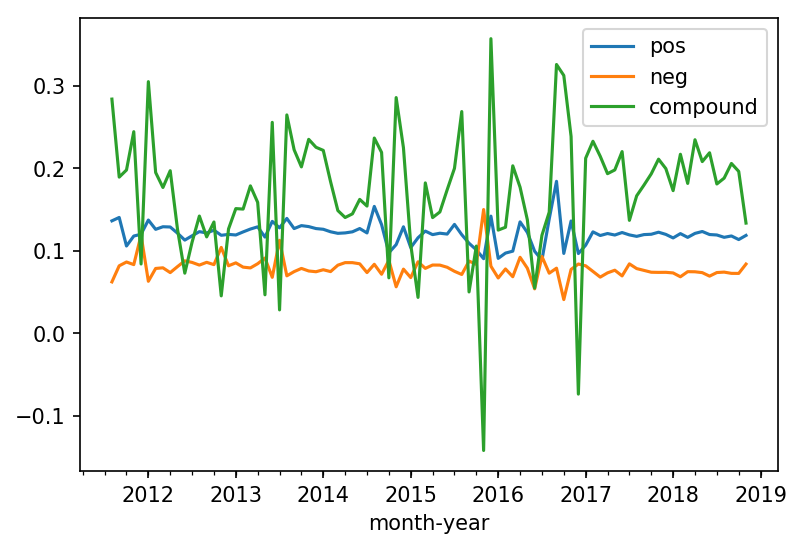

In [9]:
timed_averages = plot_df.groupby(by=['month-year']).mean()
timed_averages.plot()

In [10]:
# timed_averages = plot_df.groupby(by=[plot_df.index.month, plot_df.index.day,  plot_df.index.year]).mean()
# timed_averages.index = timed_averages.index.set_names(names=['Month', 'Day', 'Year'])
timed_averages.head()

,pos,neg,compound
month-year,,,
2011-08,0.136103,0.062118,0.283626
2011-09,0.140199,0.081627,0.189082
2011-10,0.105598,0.086220,0.197709
2011-11,0.117697,0.083071,0.244154
2011-12,0.119857,0.118755,0.083818


In [11]:
skull_mask = np.array(Image.open("/home/xanderroy/Documents/ToxicBlizzard/step0001.jpg"))



In [12]:
monthly_words = plot_df.groupby(['month-year']).agg(lambda x: x.mean() if x.dtype=='float64' else "".join(x))
monthly_words.head()

,pos,neg,compound,Text
month-year,,,,
2011-08,0.136103,0.062118,0.283626,Welcome to the General Discussion forum! This ...
2011-09,0.140199,0.081627,0.189082,"Oh, I'm sorry -- if the problem is that you ar..."
2011-10,0.105598,0.086220,0.197709,I have to say Force you are THE MAN. I love al...
2011-11,0.117697,0.083071,0.244154,I want to be able to name mine. I know it sou...
2011-12,0.119857,0.118755,0.083818,"yep there we go again lol:(Ugh, just when I wa..."


2011-08cloud


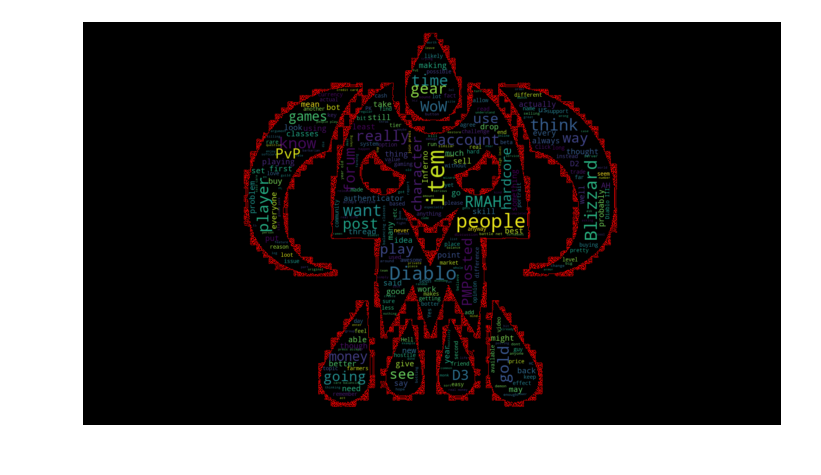

2011-09cloud


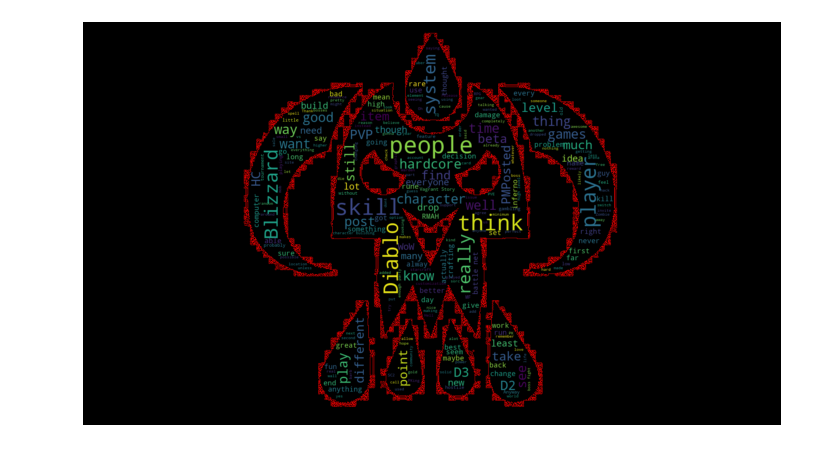

2011-10cloud


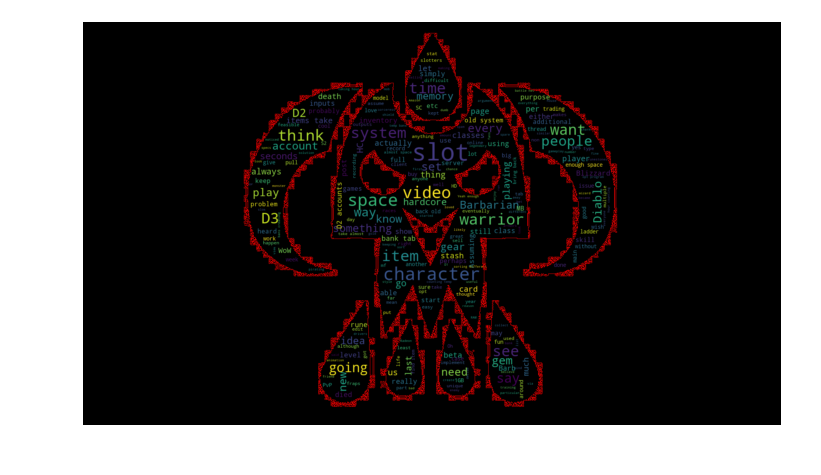

2011-11cloud


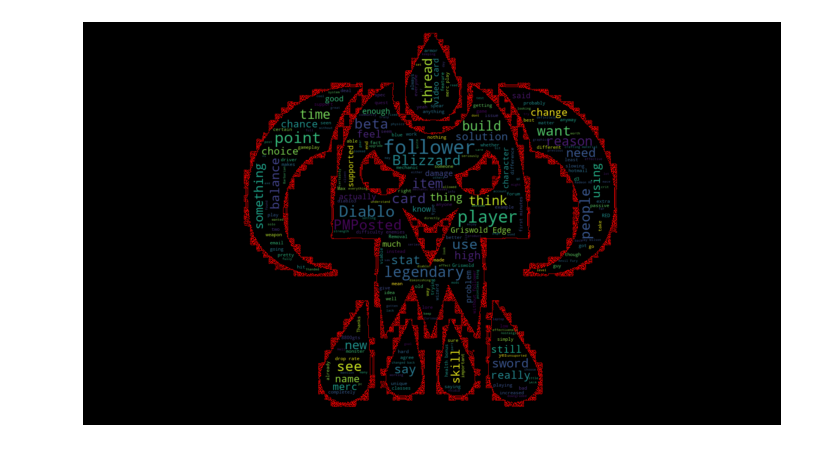

2011-12cloud


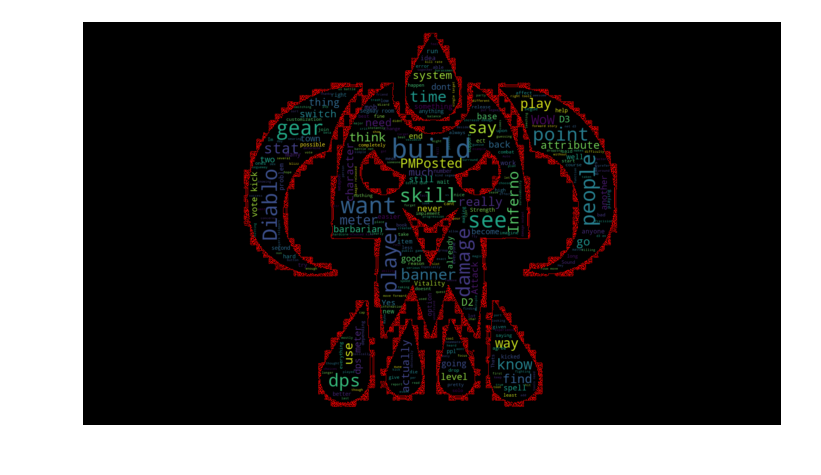

2012-01cloud


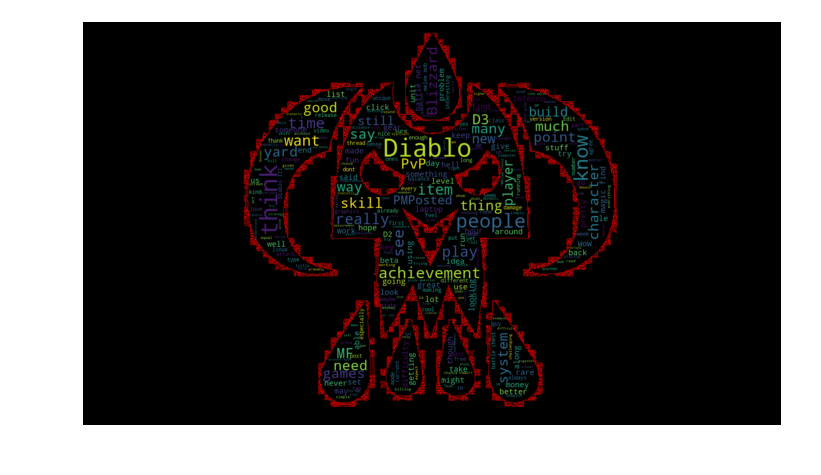

2012-02cloud


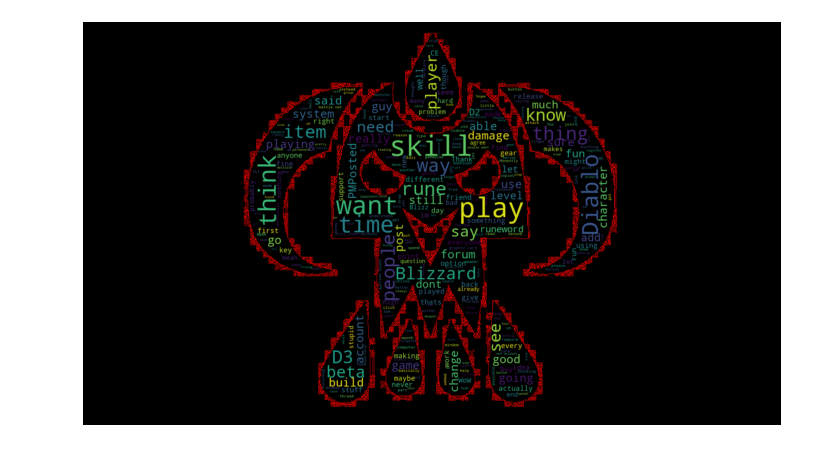

2012-03cloud


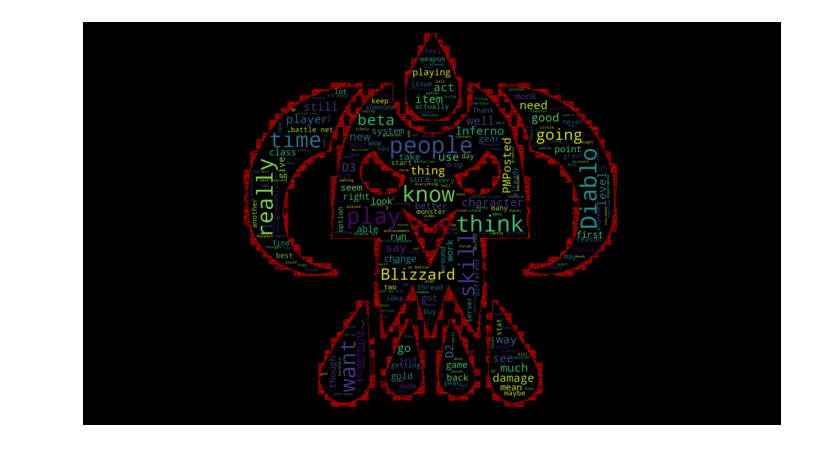

2012-04cloud


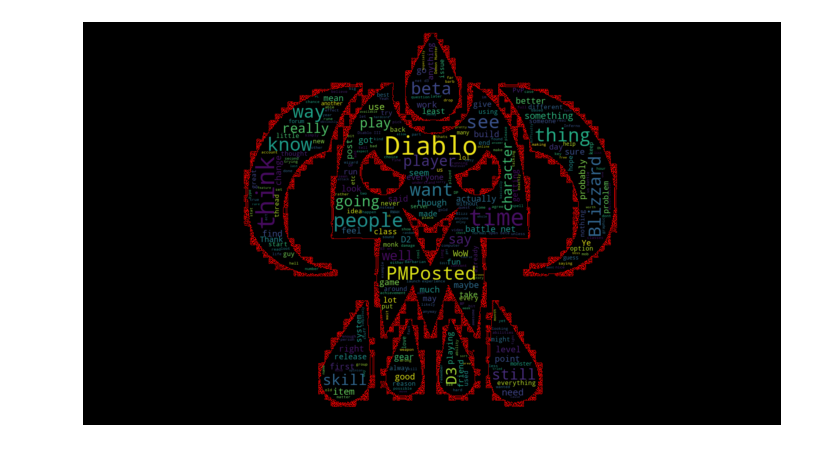

2012-05cloud


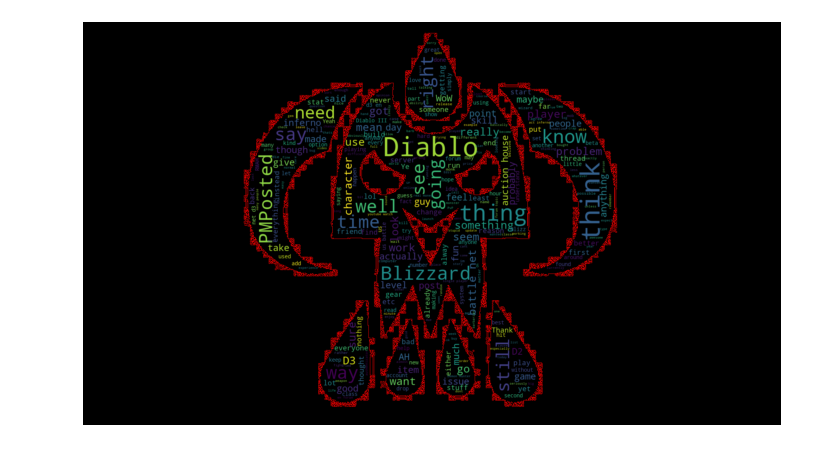

2012-06cloud


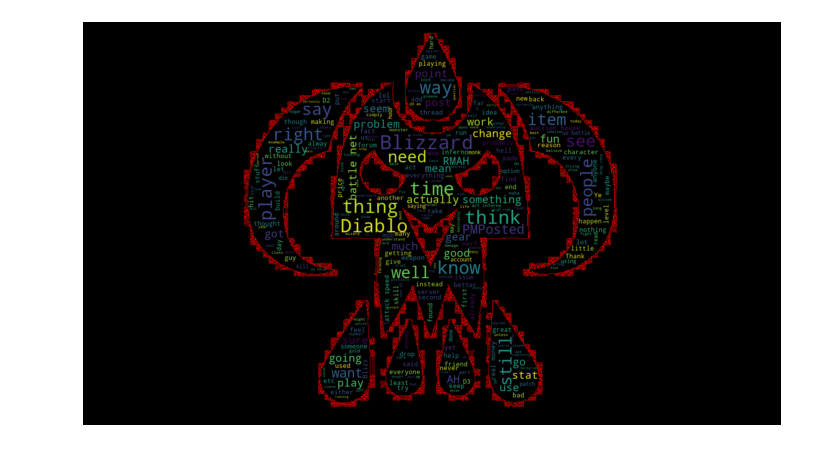

2012-07cloud


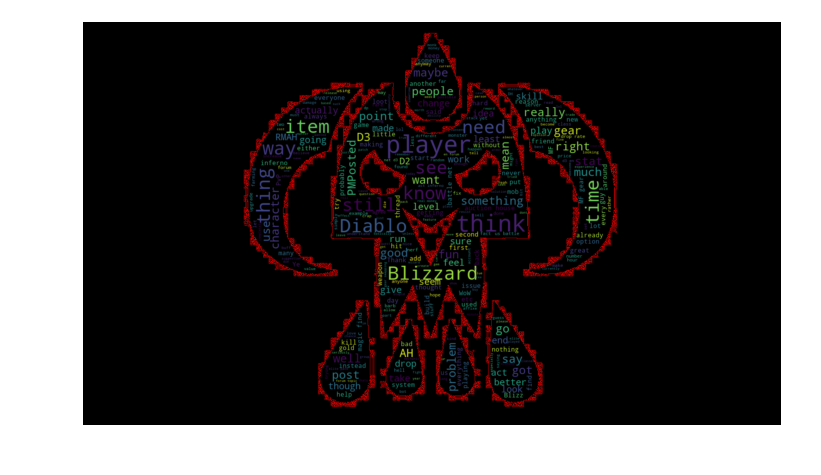

2012-08cloud


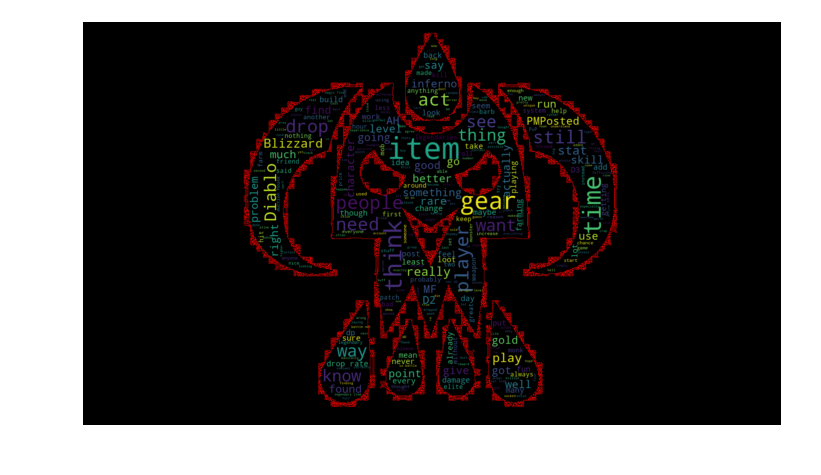

2012-09cloud


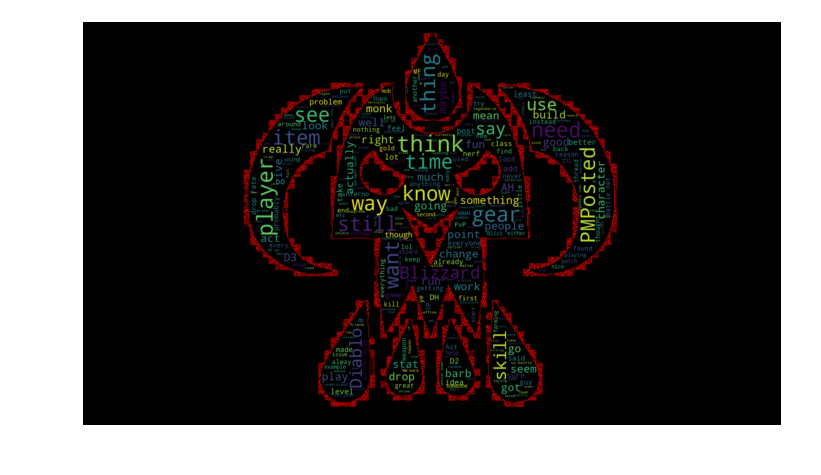

2012-10cloud


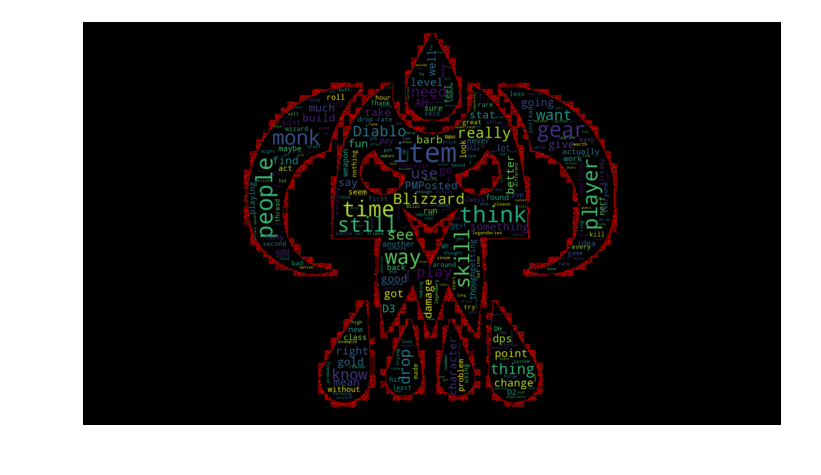

2012-11cloud


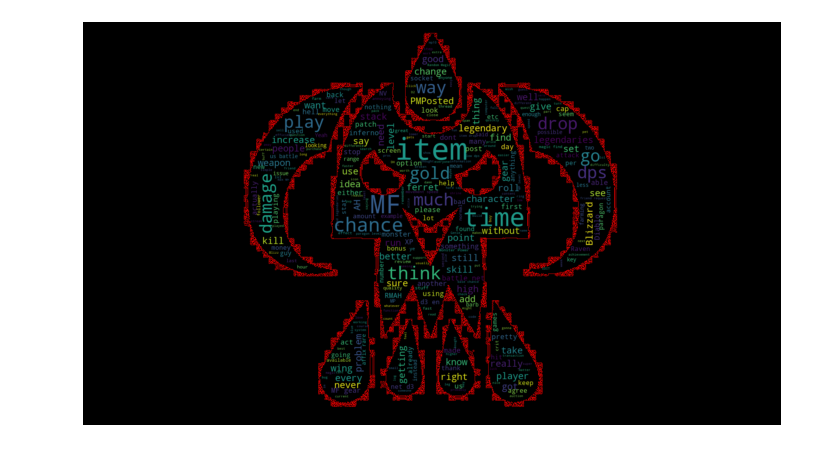

2012-12cloud


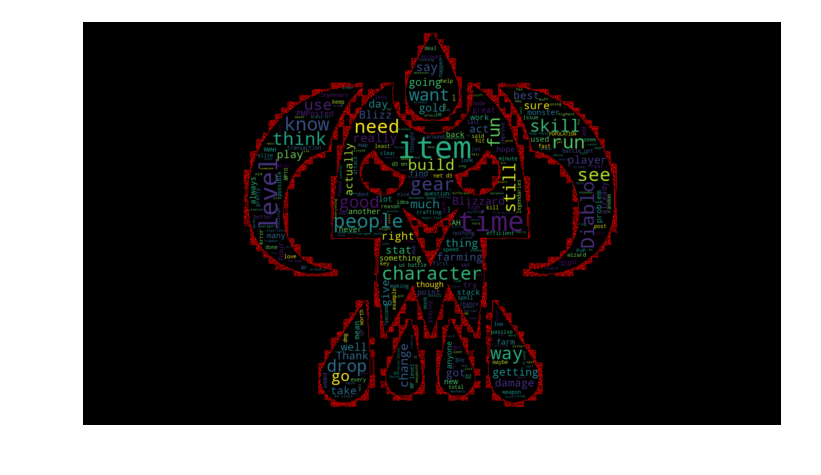

2013-01cloud


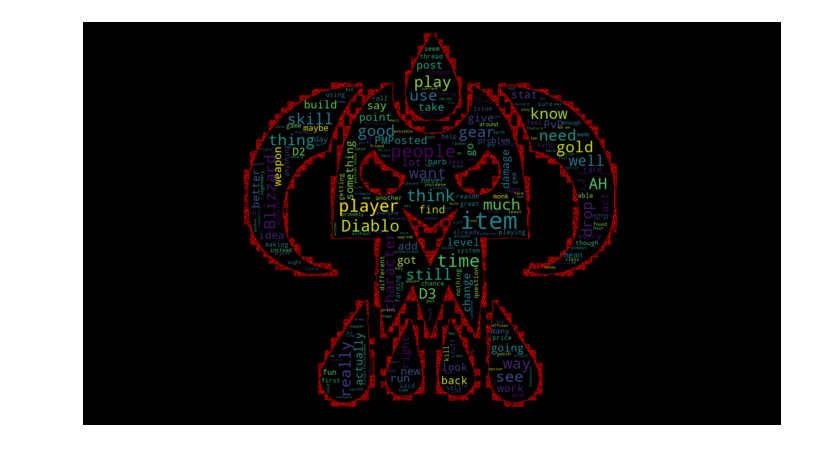

2013-02cloud


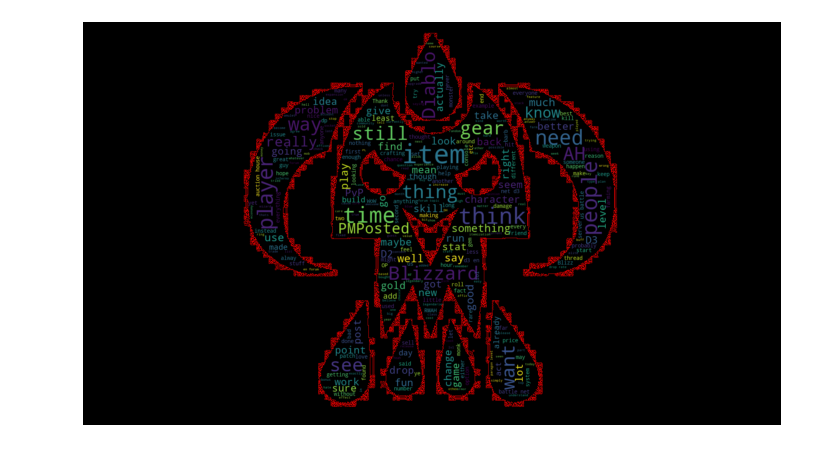

2013-03cloud


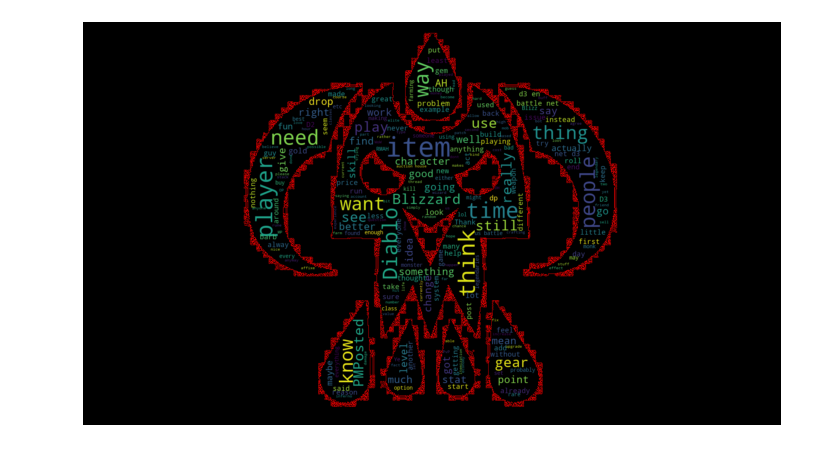

2013-04cloud


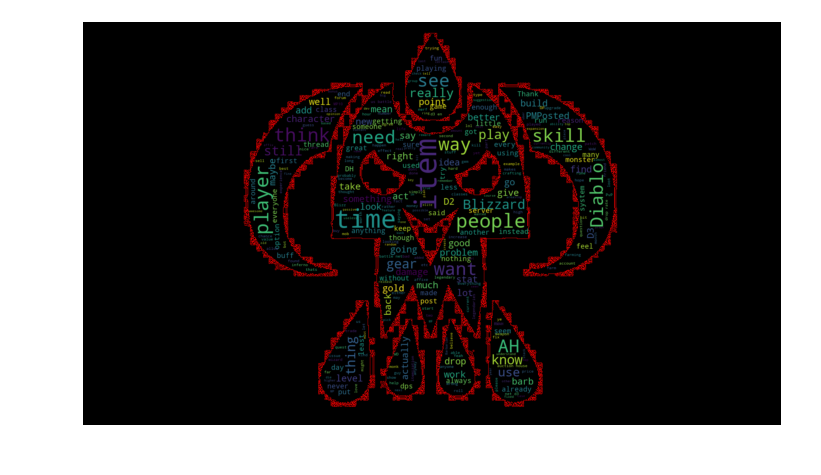

2013-05cloud


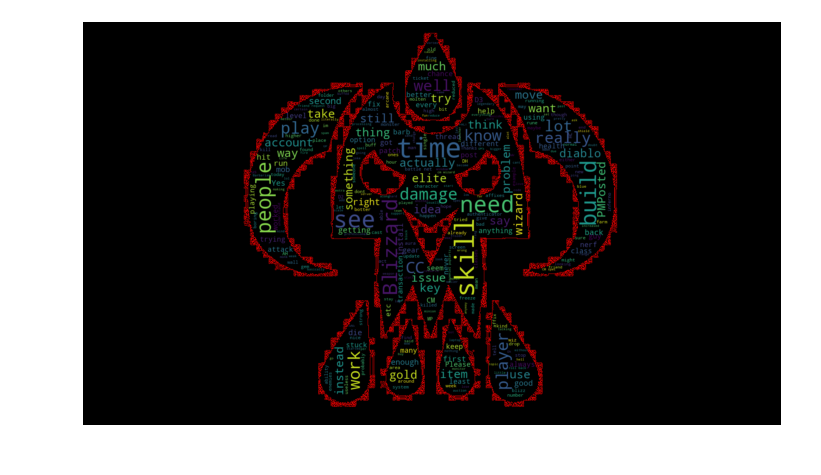

2013-06cloud


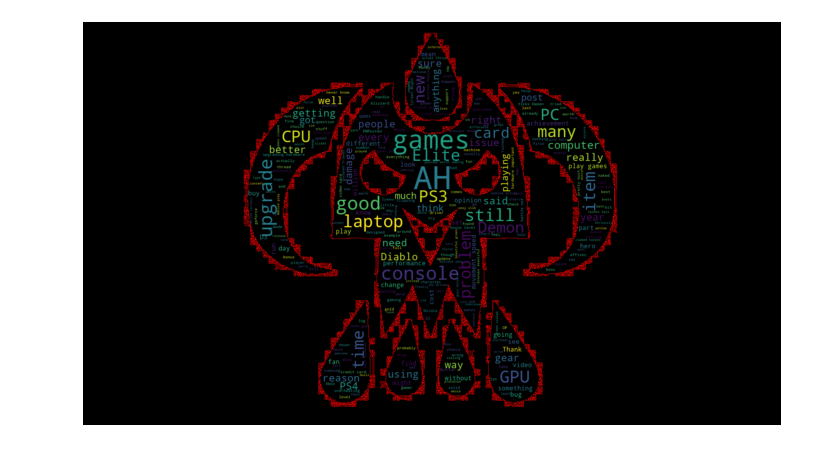

2013-07cloud


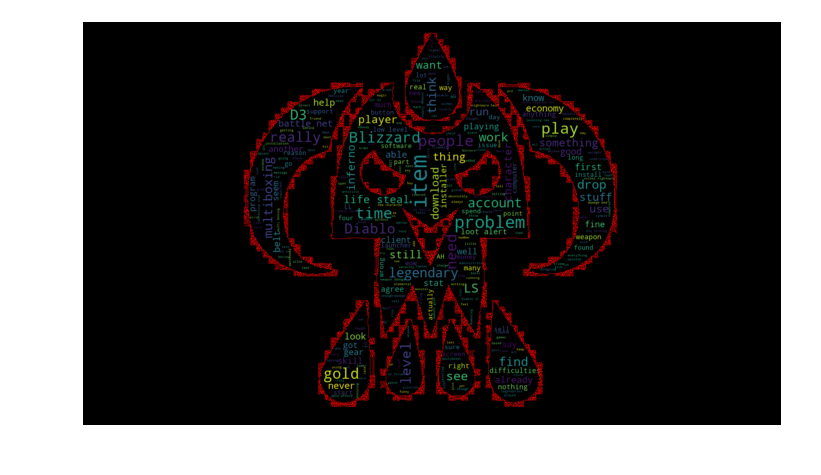

2013-08cloud


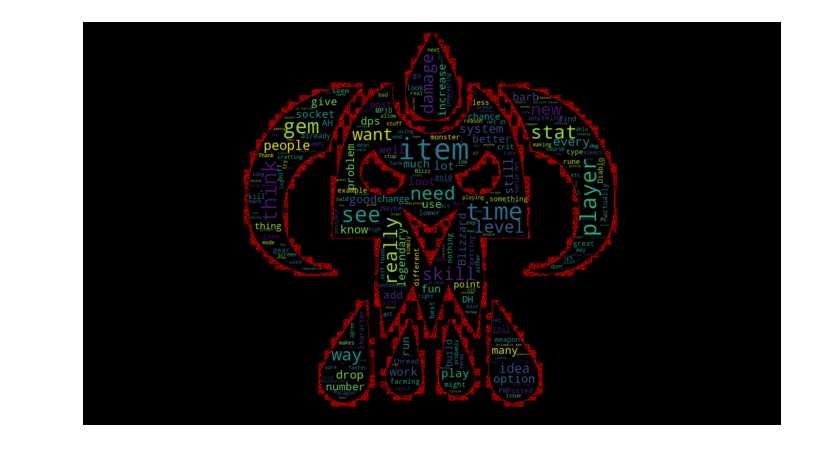

2013-09cloud


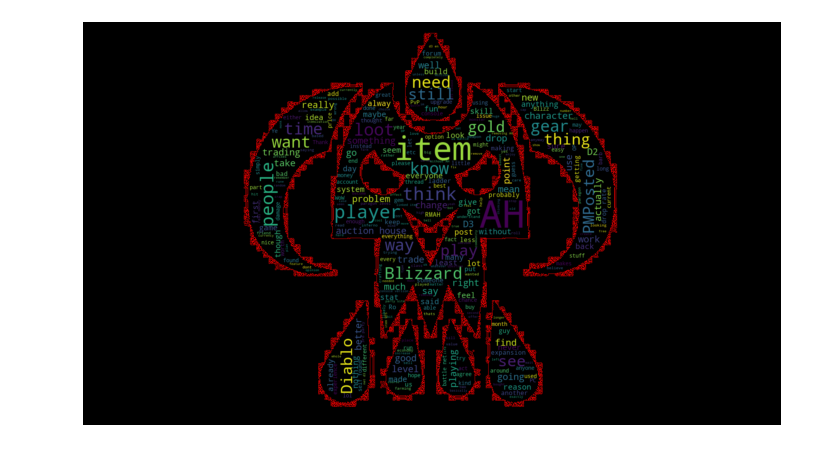

2013-10cloud


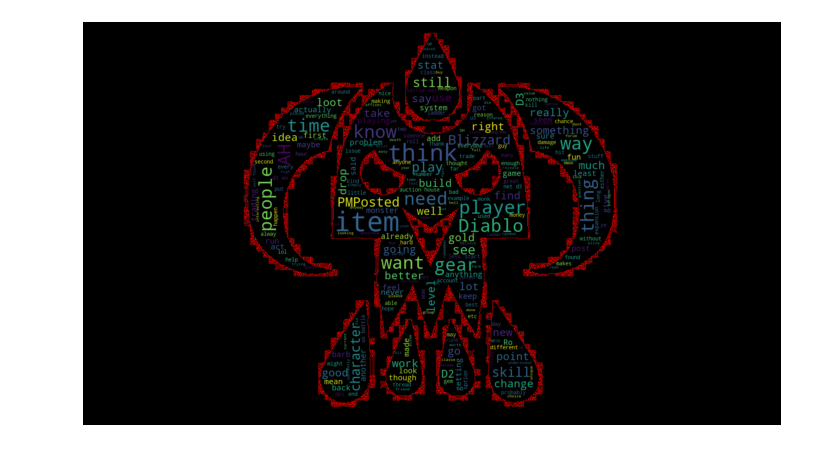

2013-11cloud


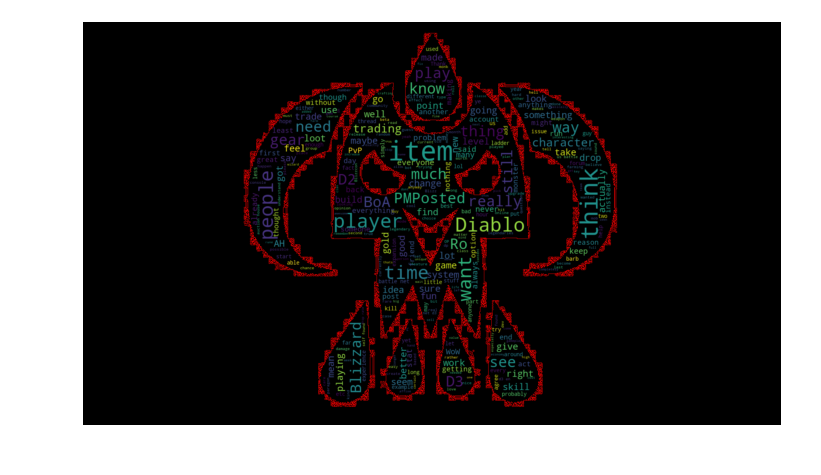

2013-12cloud


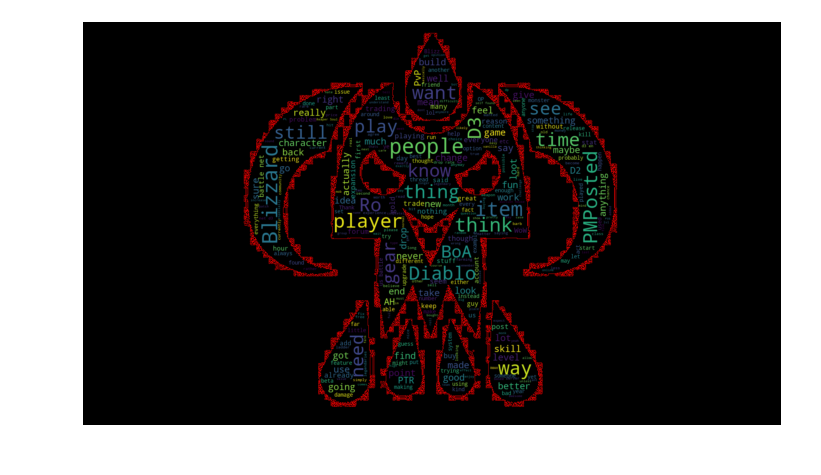

2014-01cloud


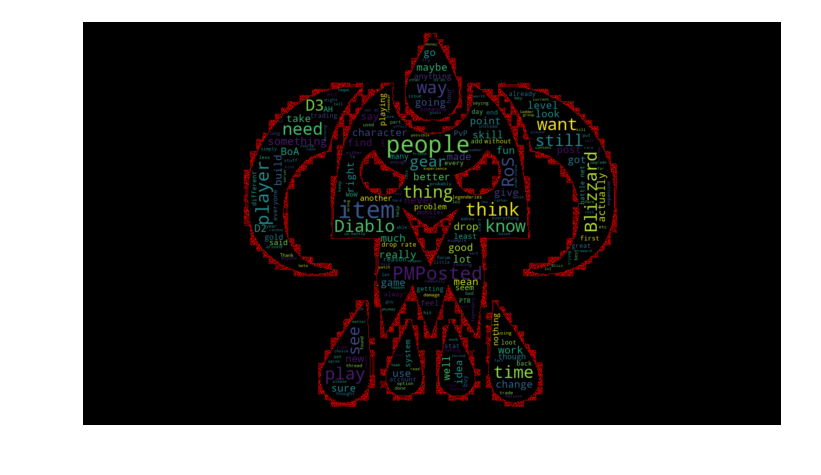

2014-02cloud


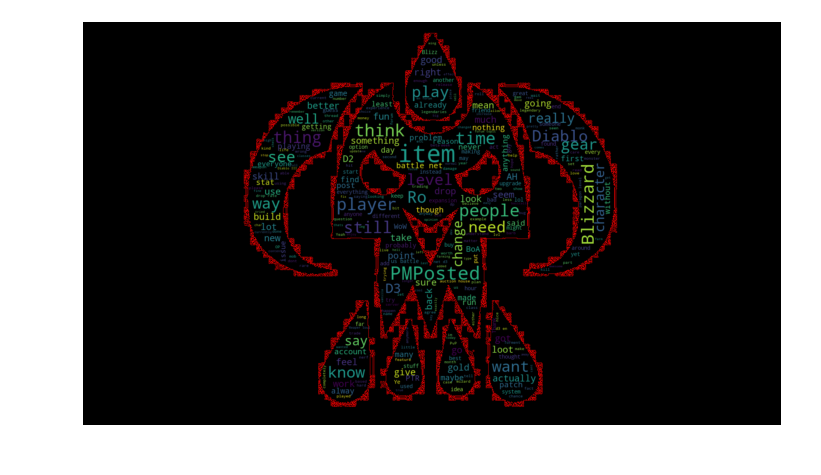

2014-03cloud


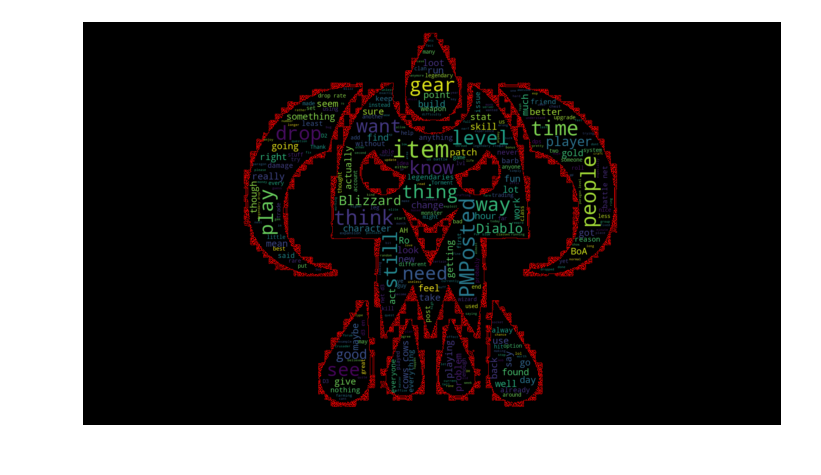

2014-04cloud


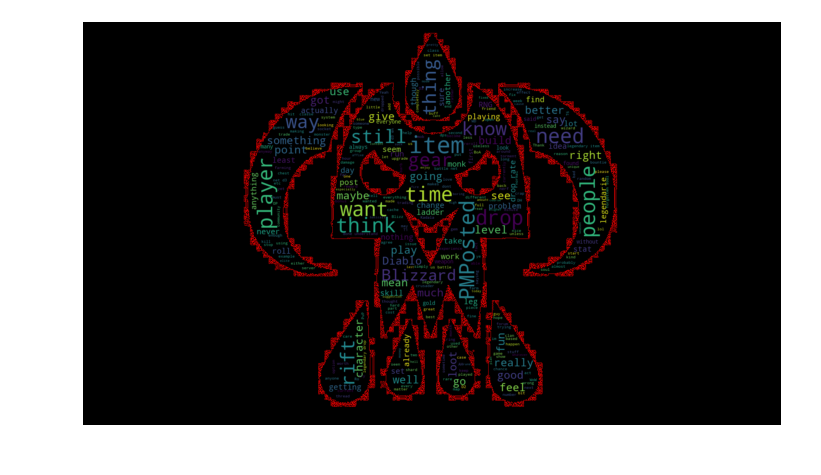

2014-05cloud


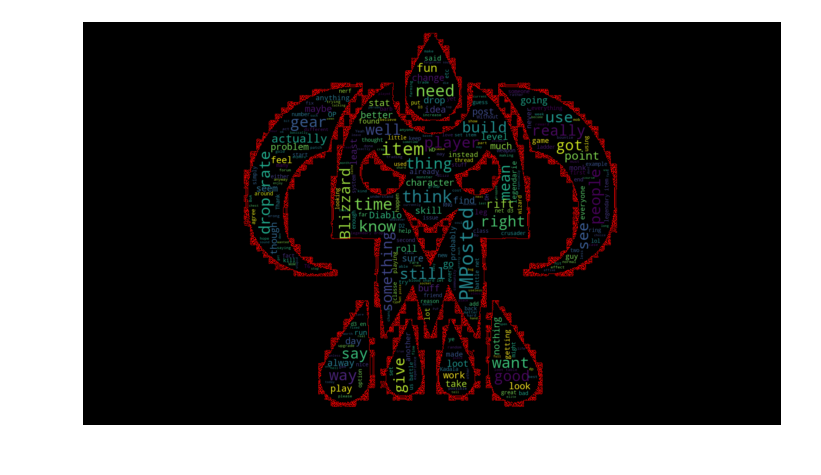

2014-06cloud


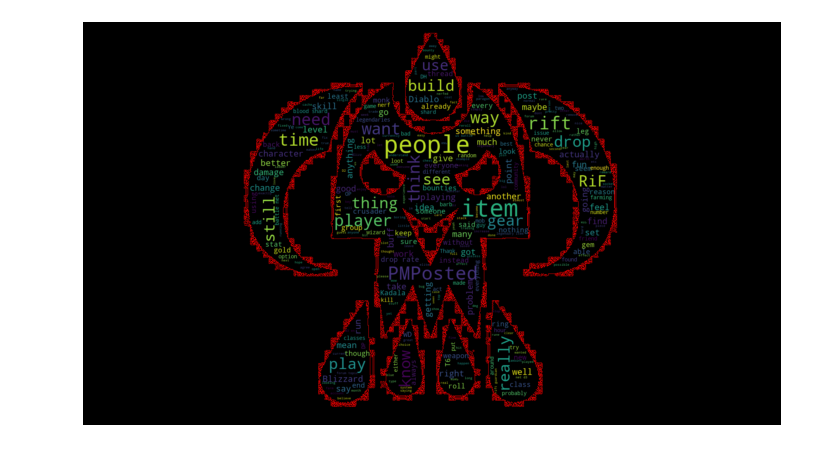

2014-07cloud


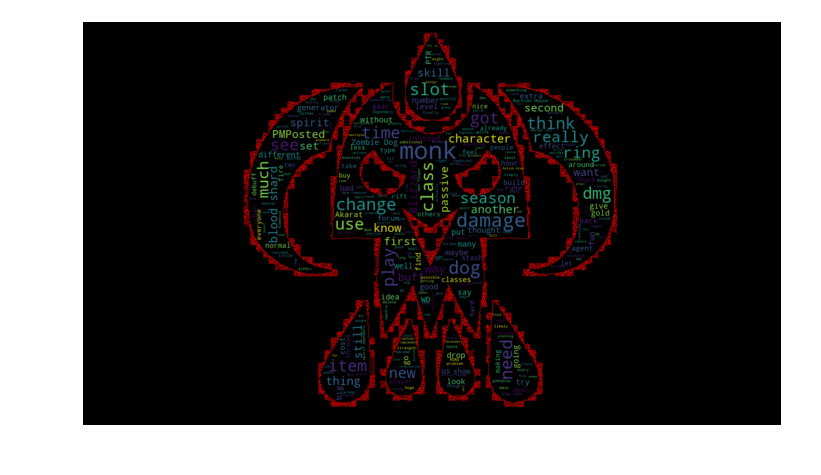

2014-08cloud


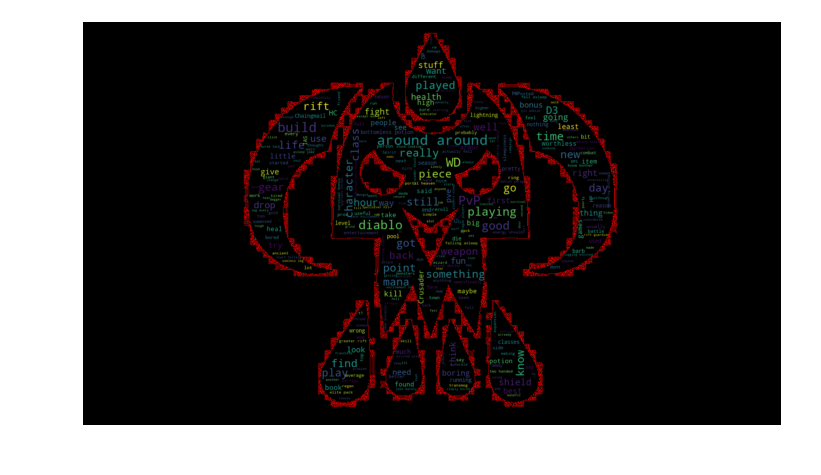

2014-09cloud


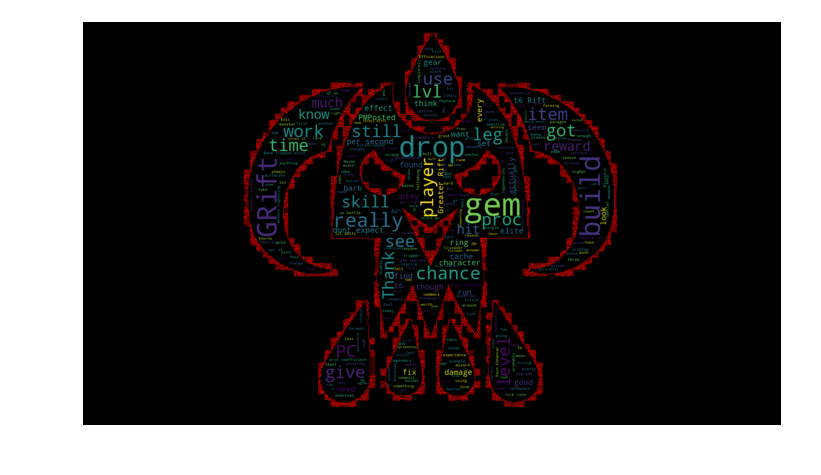

2014-10cloud


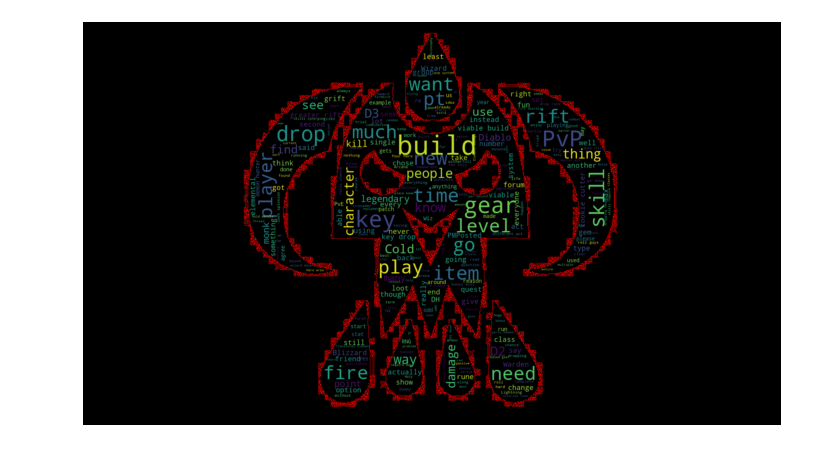

2014-11cloud


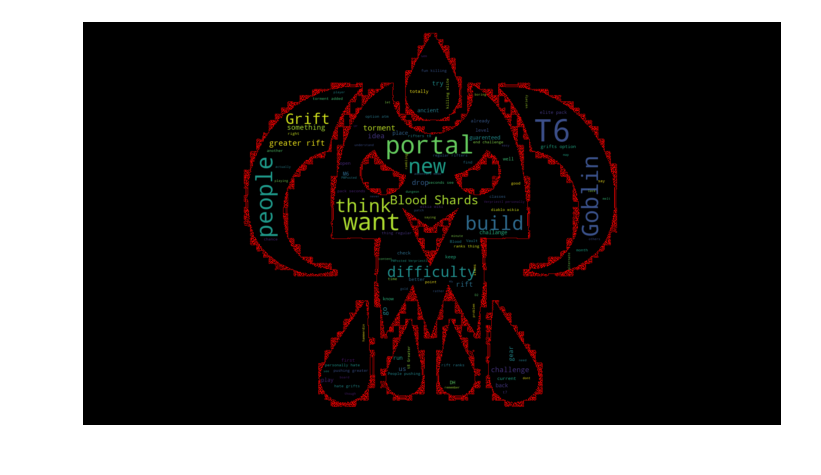

2014-12cloud


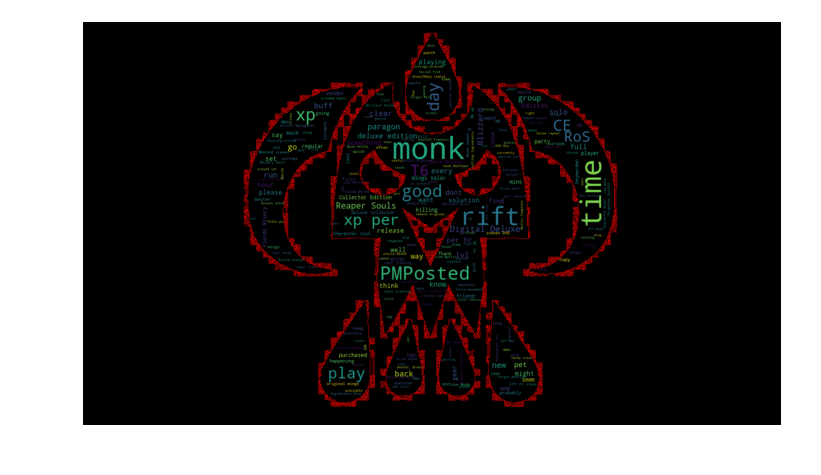

2015-01cloud


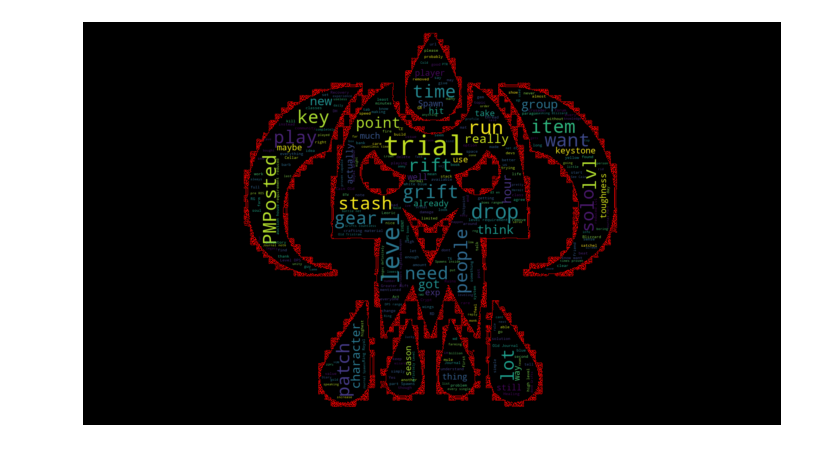

2015-02cloud


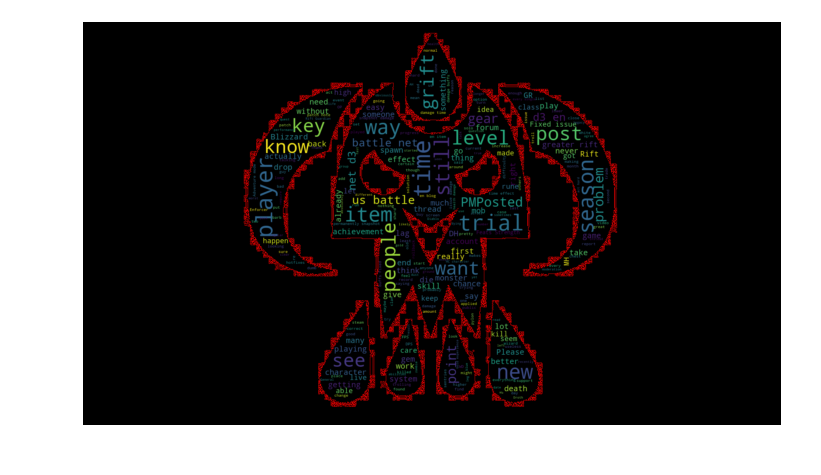

2015-03cloud


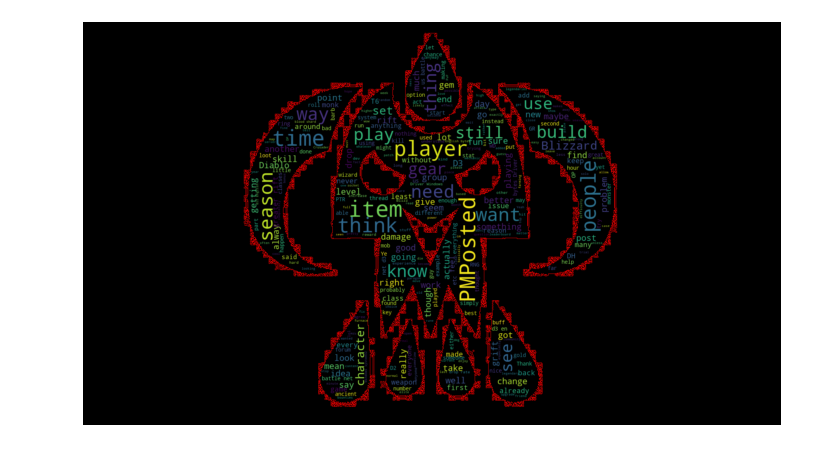

2015-04cloud


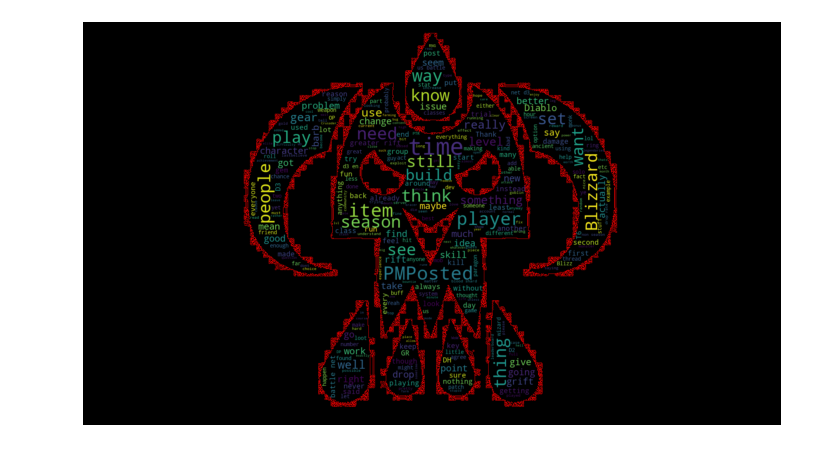

2015-05cloud


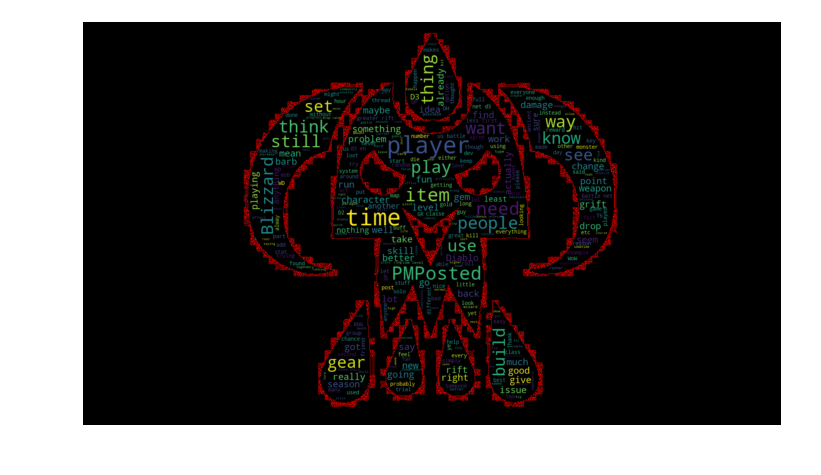

2015-06cloud


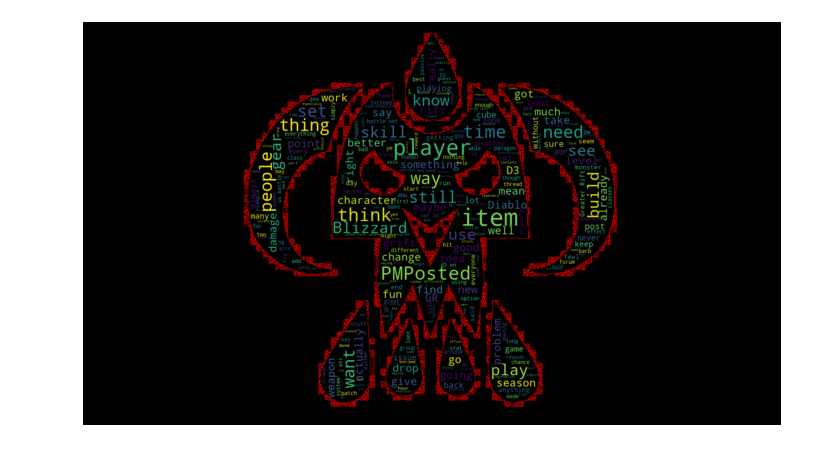

2015-07cloud


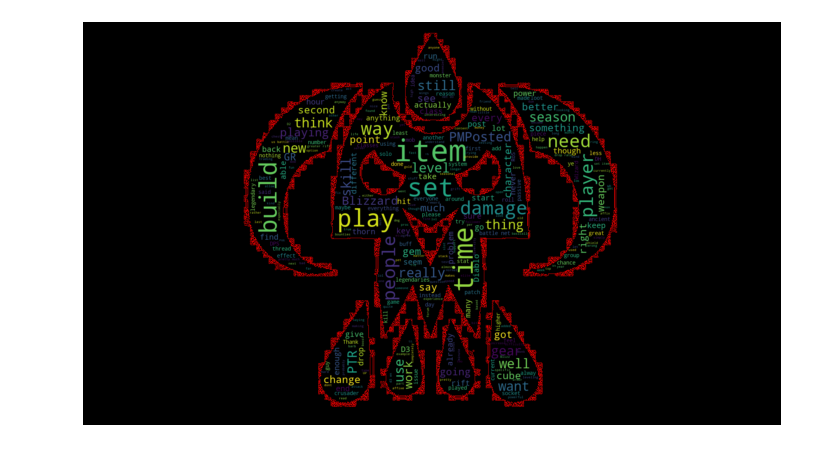

2015-08cloud


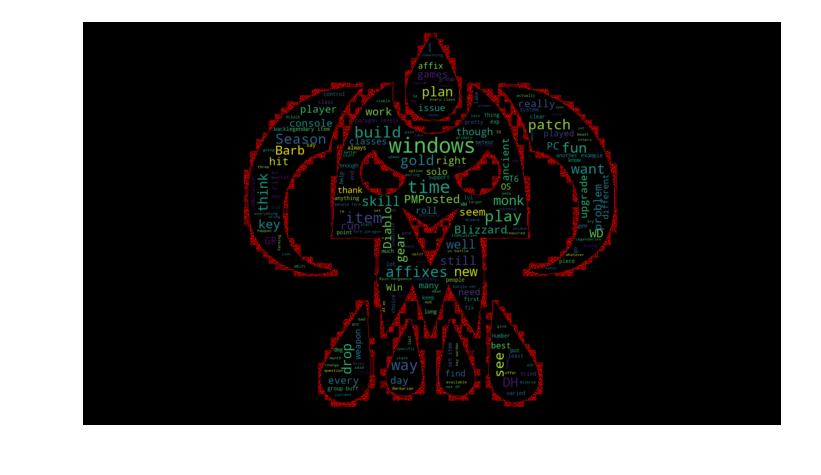

2015-09cloud


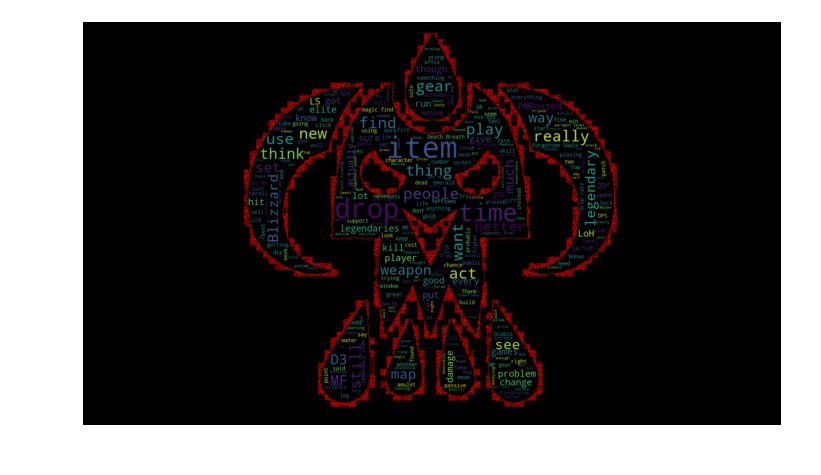

2015-10cloud


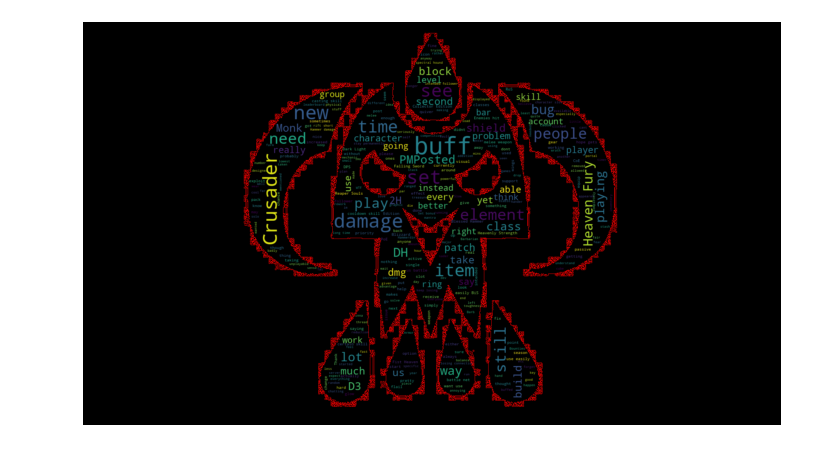

2015-11cloud


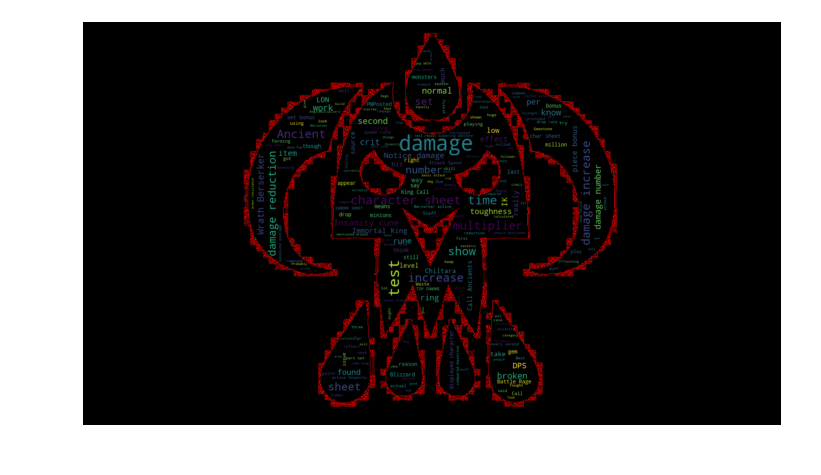

2015-12cloud


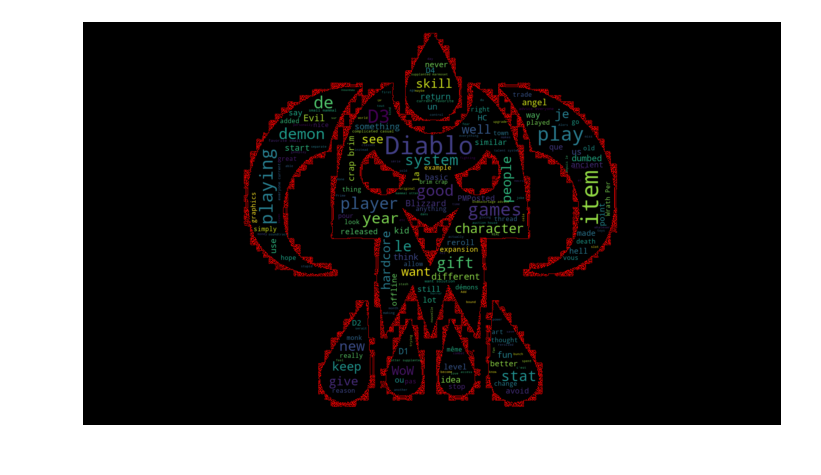

2016-01cloud


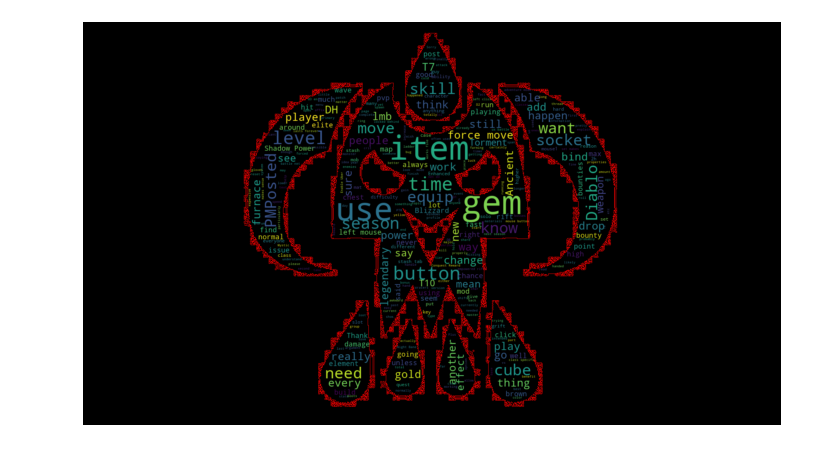

2016-02cloud


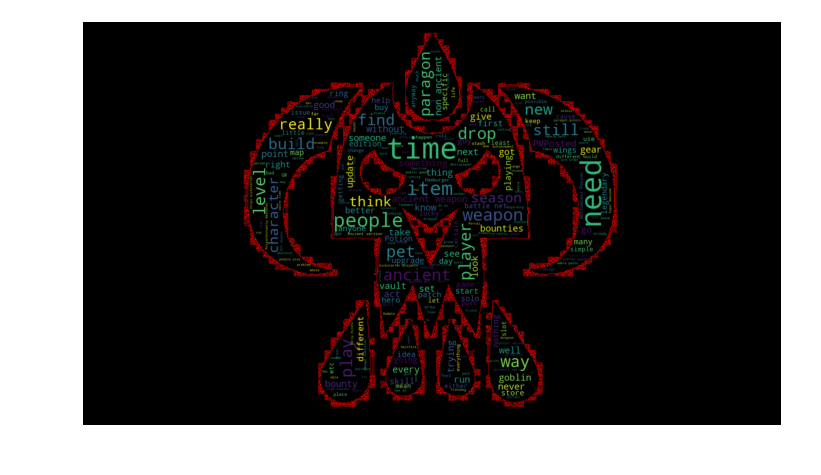

2016-03cloud


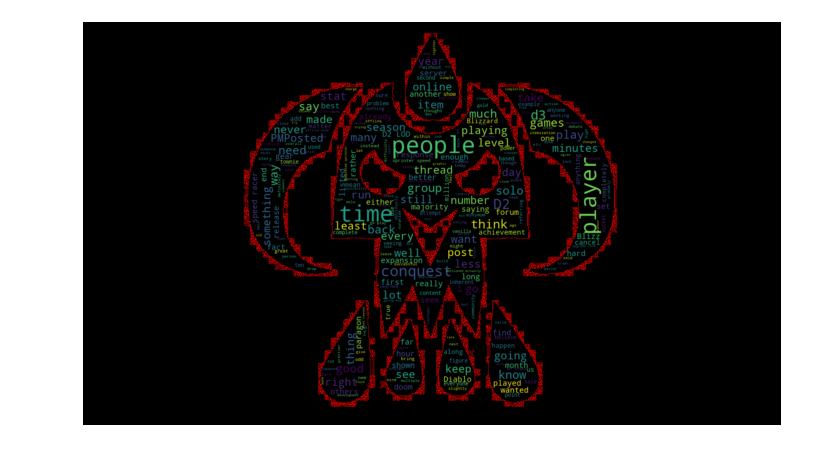

2016-04cloud


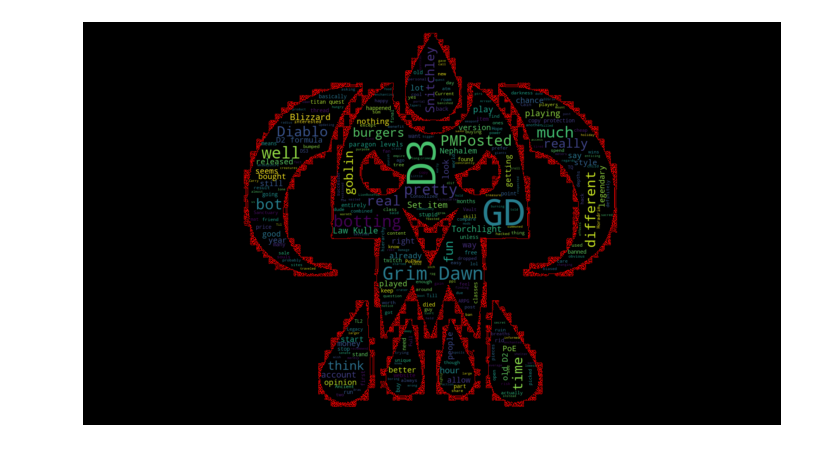

2016-05cloud


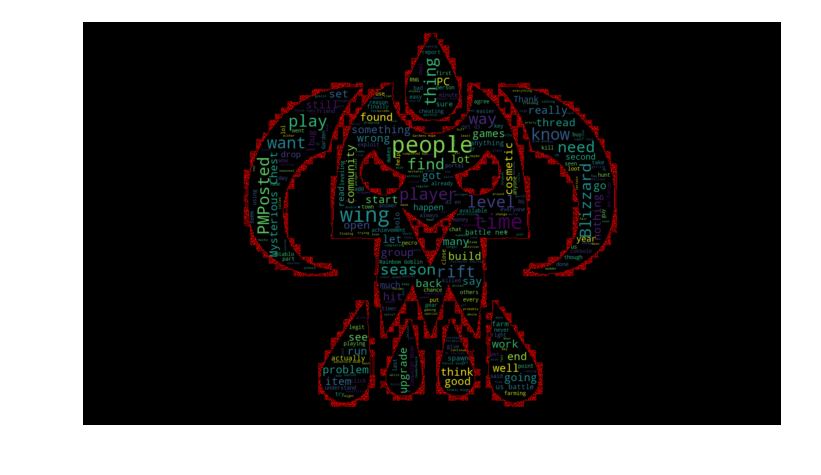

2016-06cloud


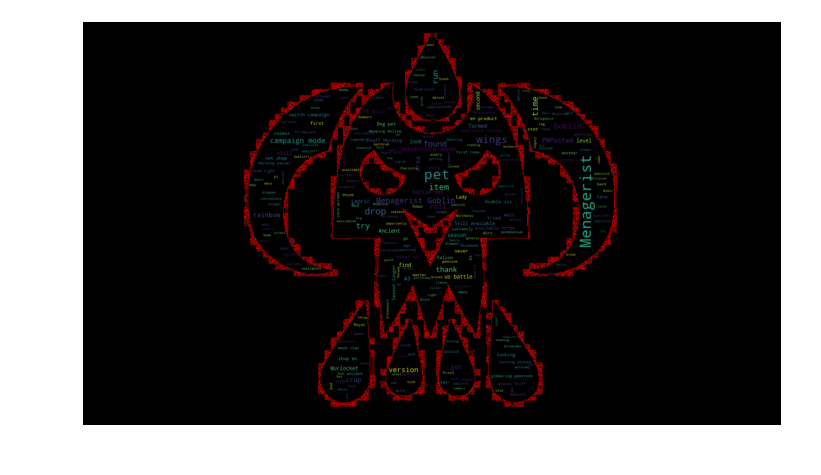

2016-07cloud


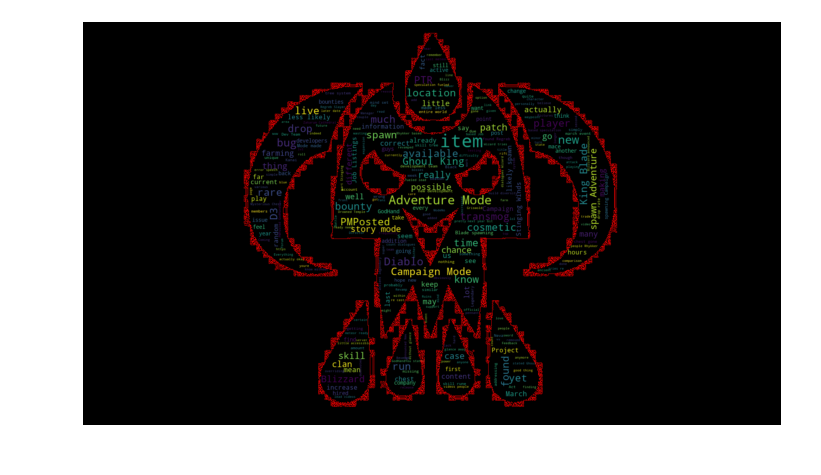

2016-08cloud


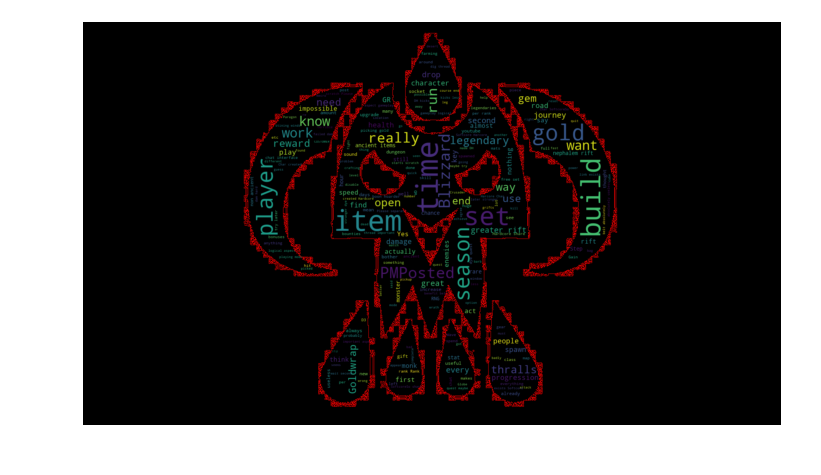

2016-09cloud


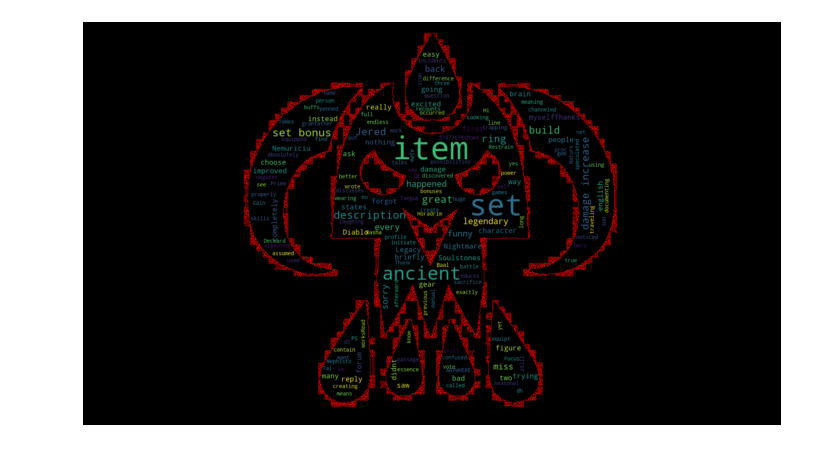

2016-10cloud


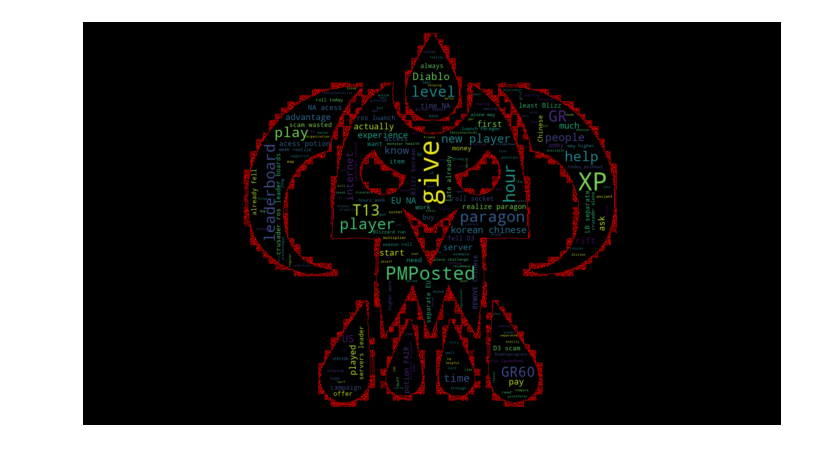

2016-11cloud


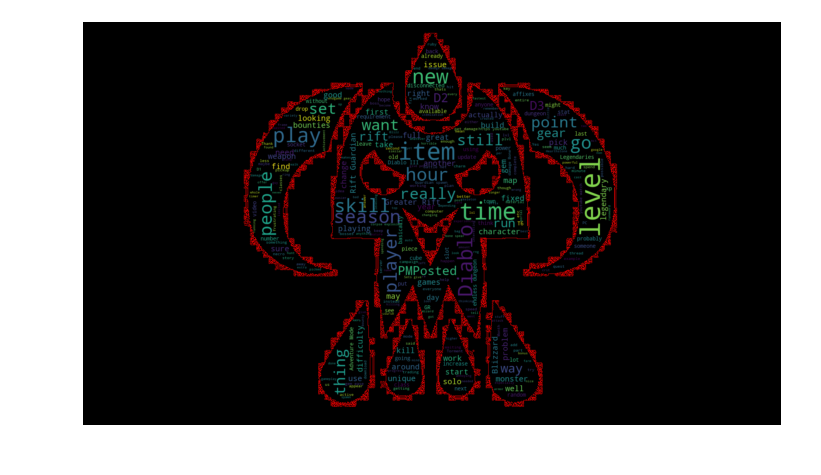

2016-12cloud


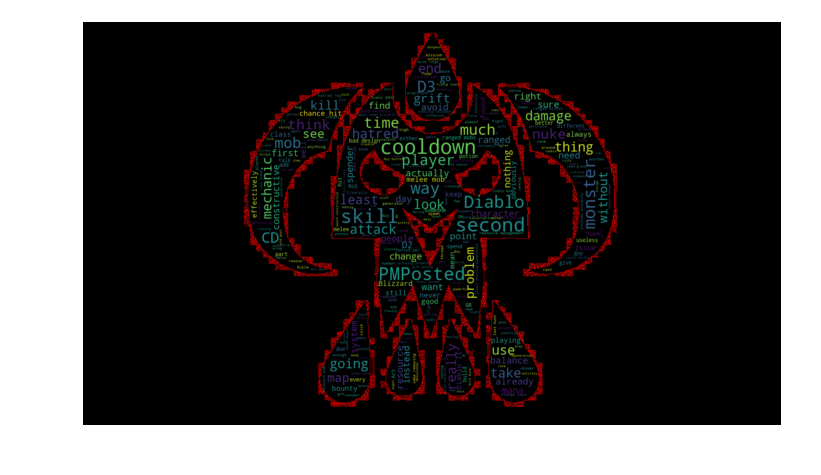

2017-01cloud


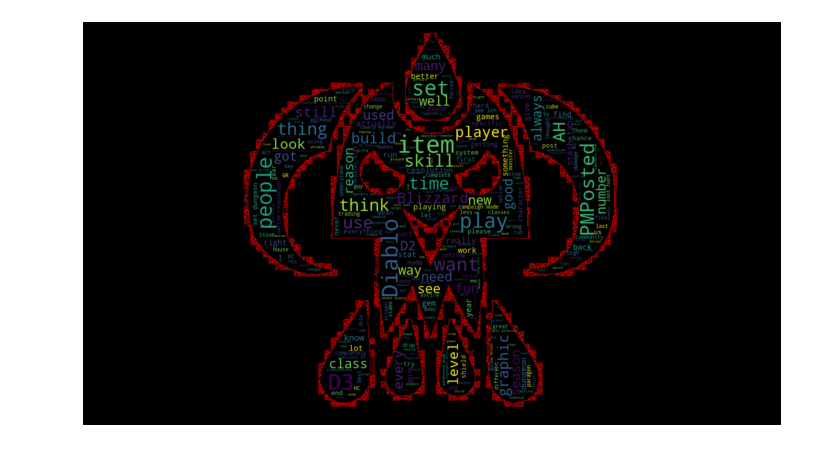

2017-02cloud


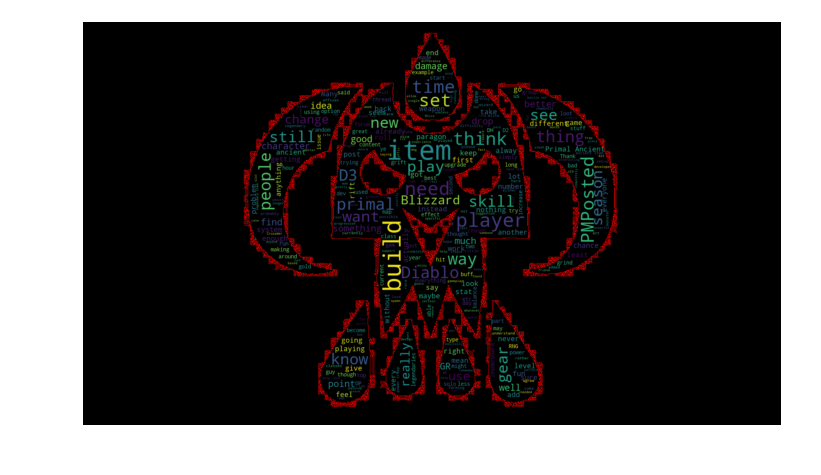

2017-03cloud


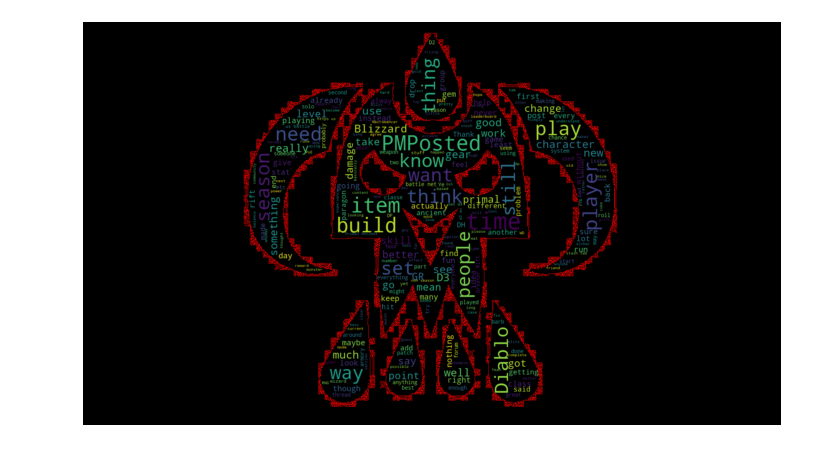

2017-04cloud


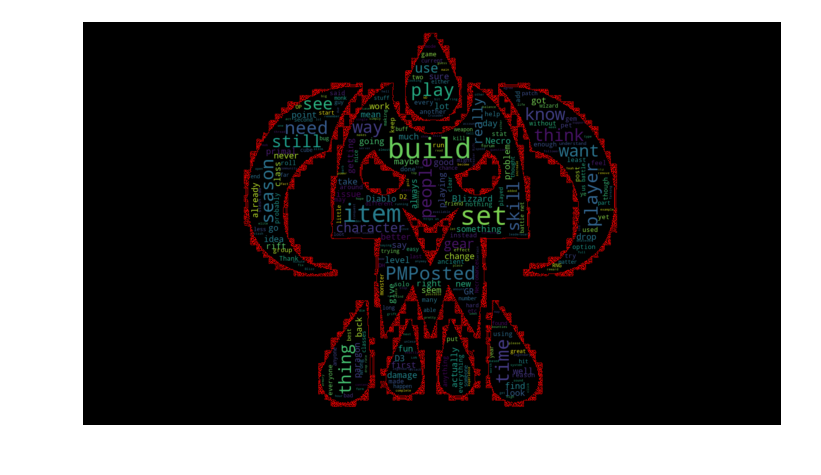

2017-05cloud


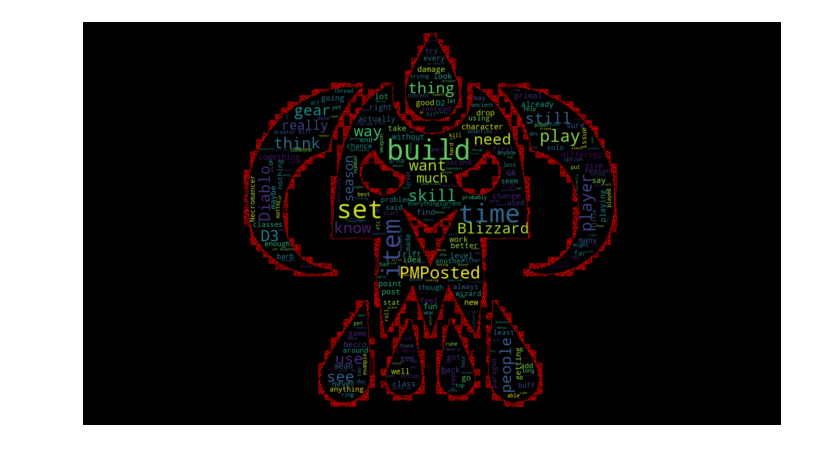

2017-06cloud


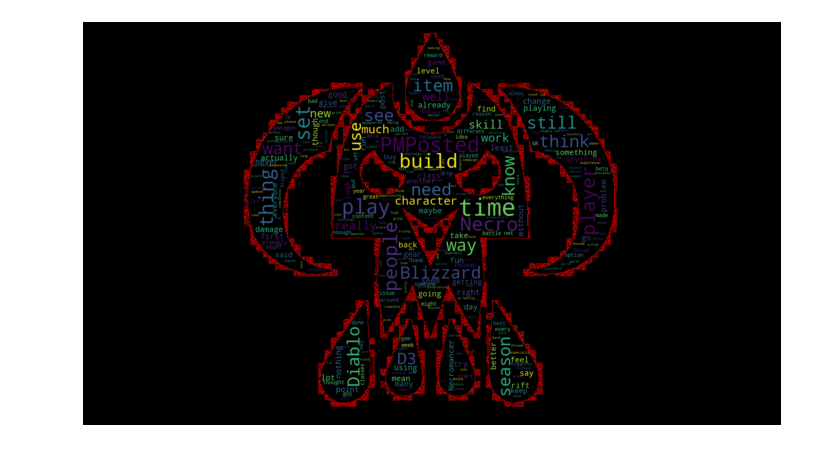

2017-07cloud


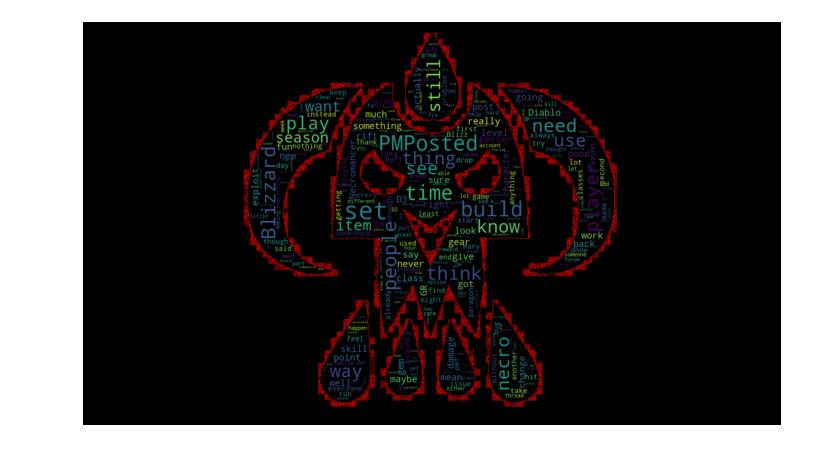

2017-08cloud


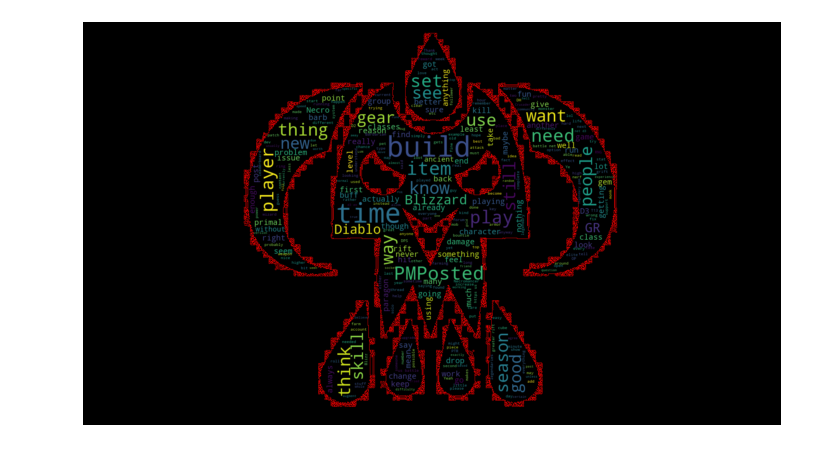

2017-09cloud


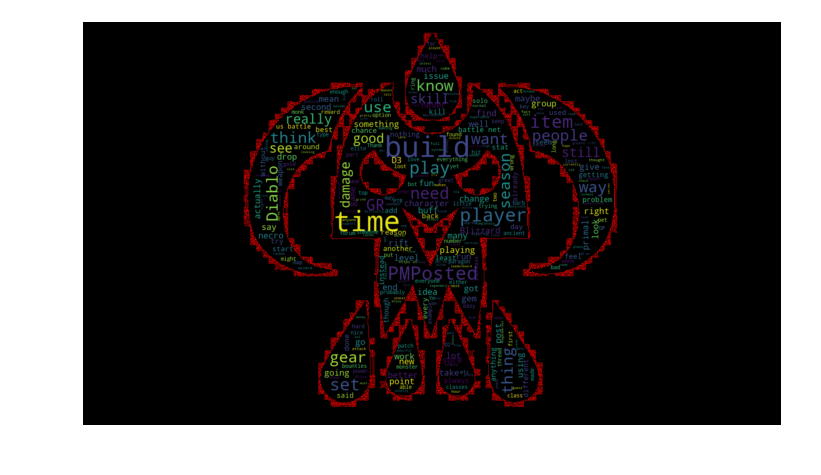

2017-10cloud


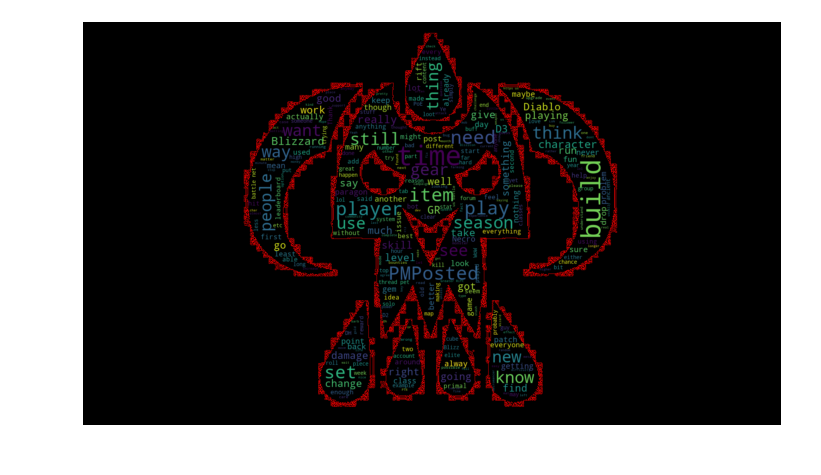

2017-11cloud


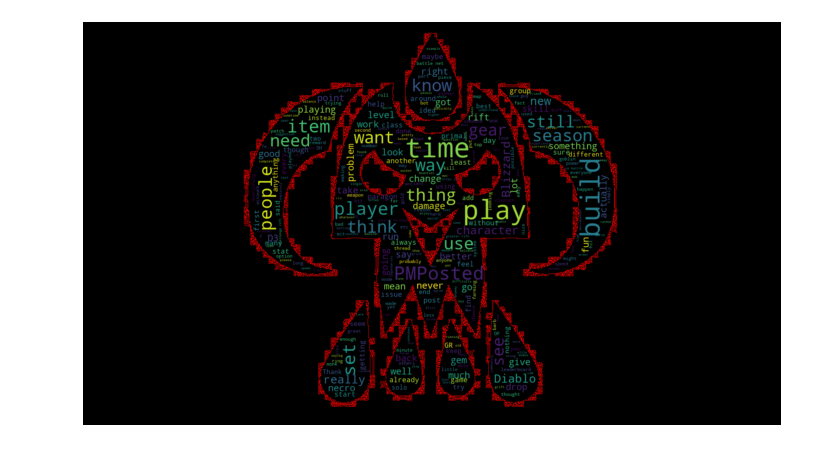

2017-12cloud


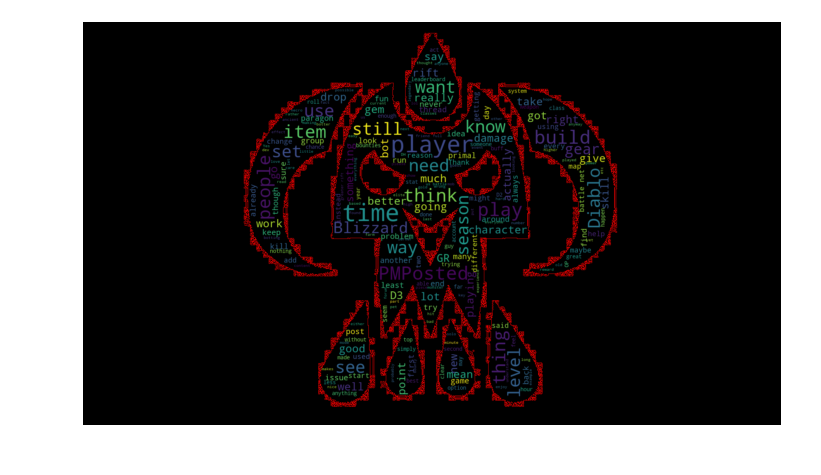

2018-01cloud


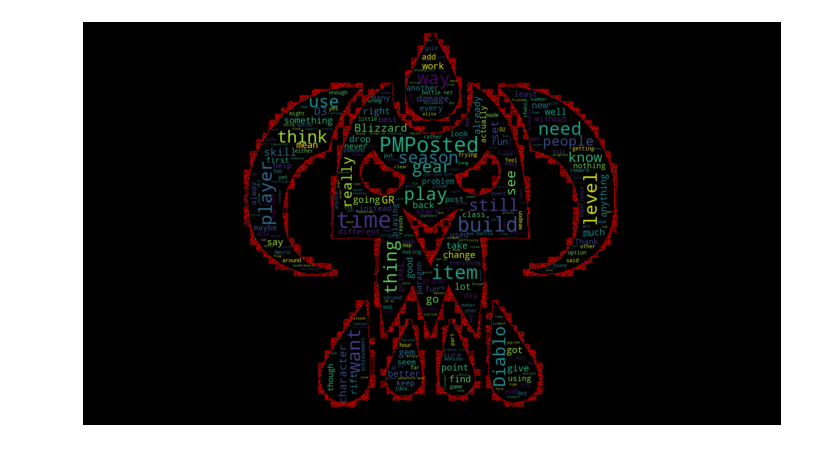

2018-02cloud


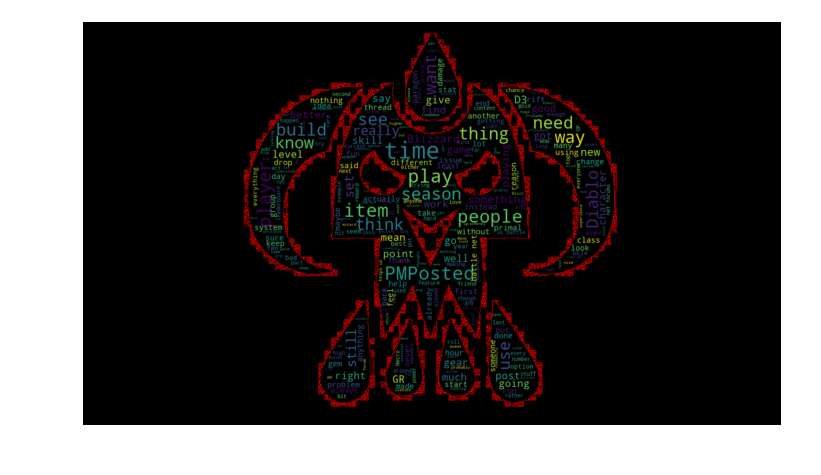

2018-03cloud


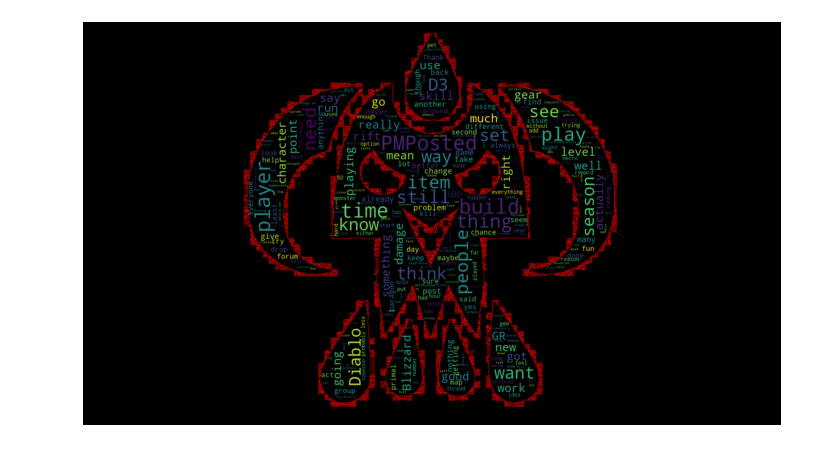

2018-04cloud


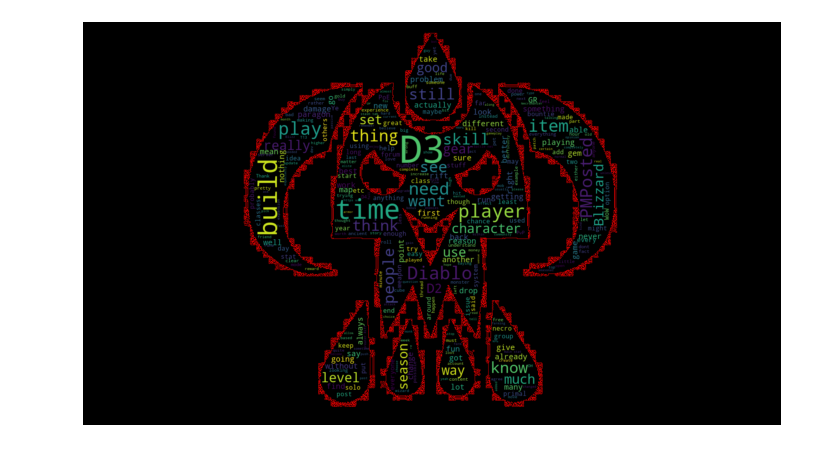

2018-05cloud


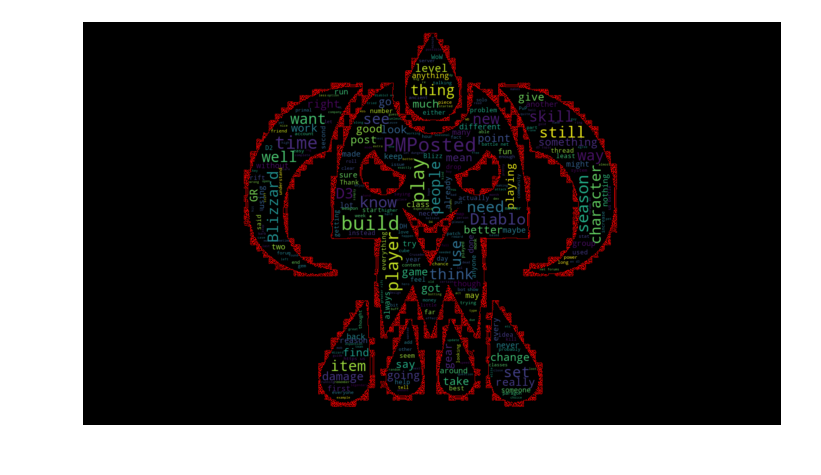

2018-06cloud


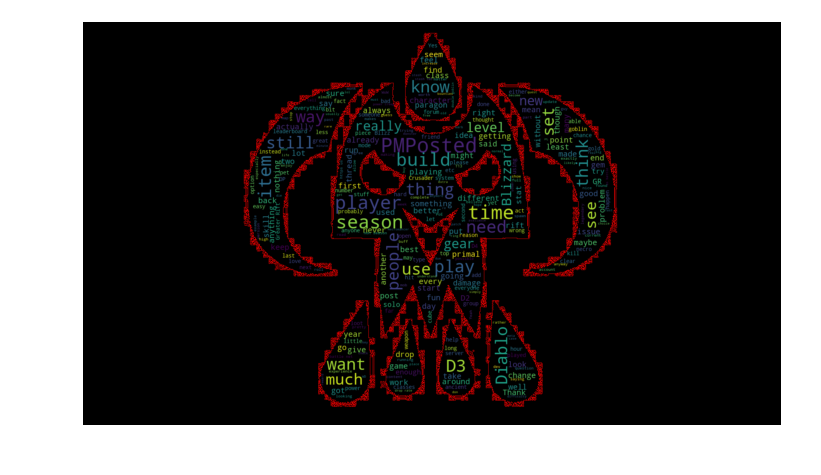

2018-07cloud


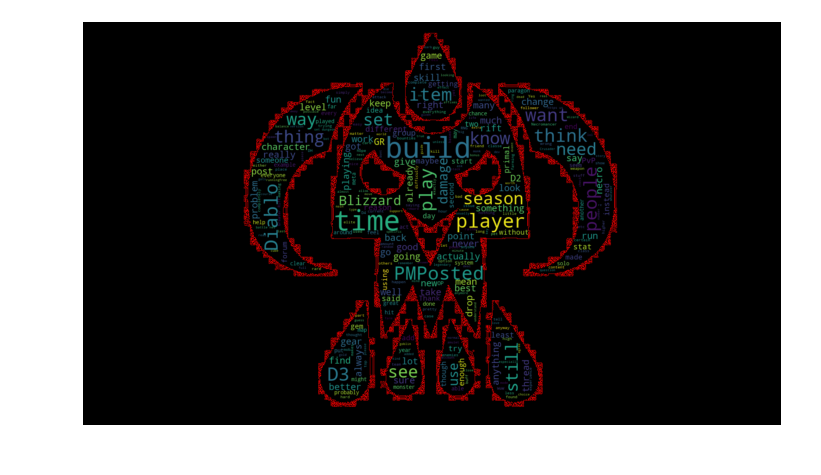

2018-08cloud


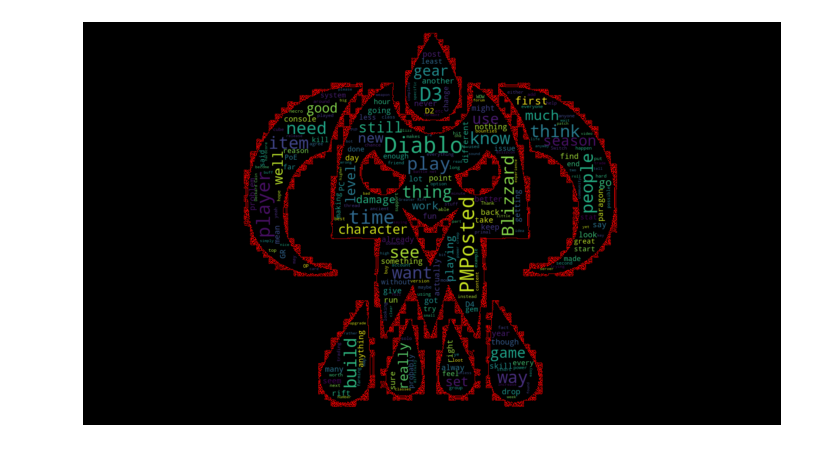

2018-09cloud


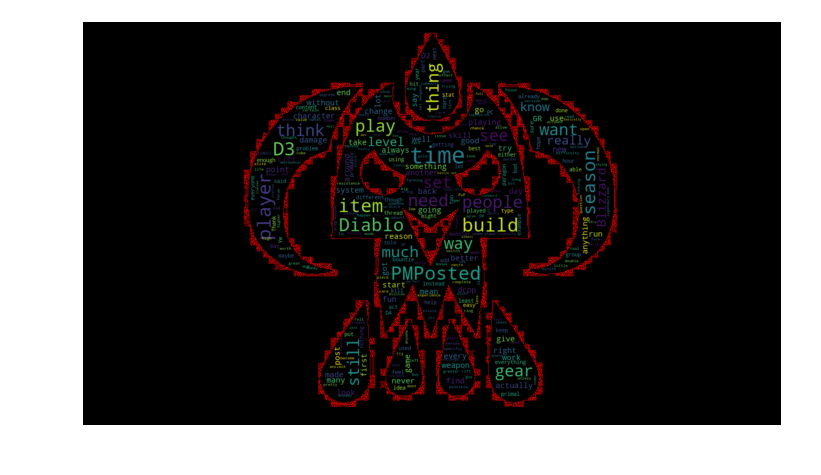

2018-10cloud


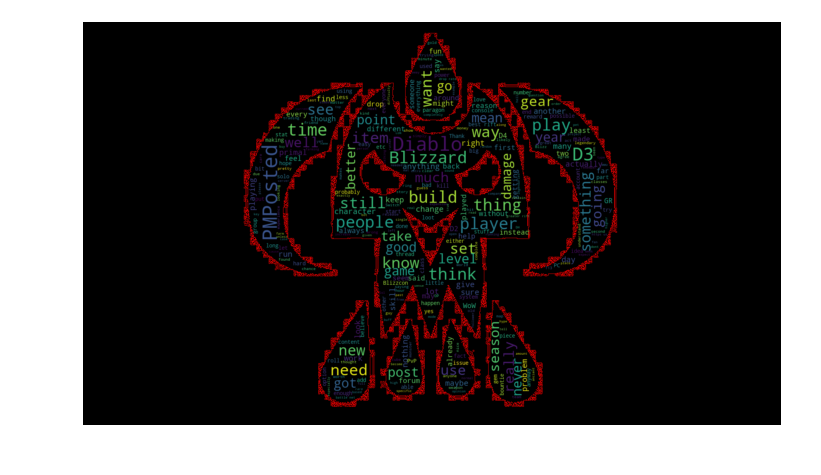

2018-11cloud


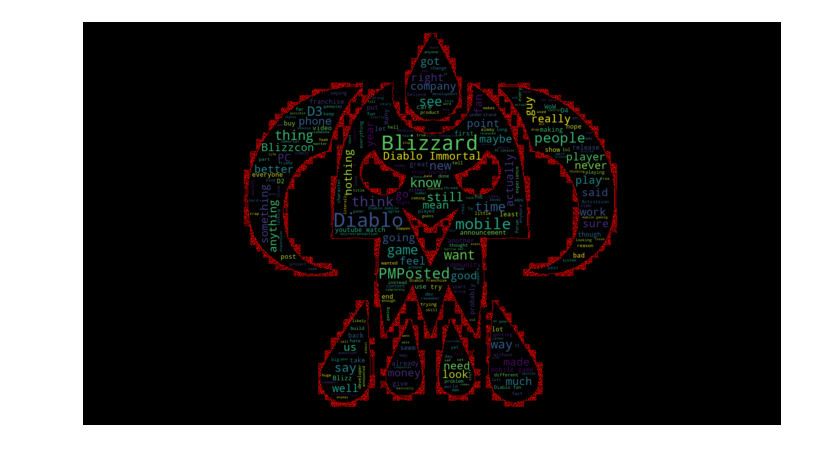

In [13]:

stopwords = set(STOPWORDS)
stopwords.update(['now', 'will', 'come', 'or', 'to', 'and', 
            'the', 'be', 'i', 'it', 'in', 'of', 'with', 'this', 'if', 'make', 'even', 'PMPosted'
            'so', 'but', 'that', 'so', 'all', 'a', 'game', 'because', 'one', 'AMPosted'])

for row in monthly_words.iterrows():
    wordcloud = WordCloud(stopwords=stopwords, mask=skull_mask, scale=2, height=500,
                         background_color="black", relative_scaling=.5, max_words=300, 
                         contour_width=0.5, contour_color='red').generate(row[1].Text)

#     plt.figure(figsize=(6, 3), dpi=400)
    plt.imshow(wordcloud, interpolation='bilinear')
    plt.axis("off")
    date =  row[0].strftime('%Y-%m')
    filename = f'{date}cloud'

    plt.savefig(f'/home/xanderroy/Documents/homework/Webpage/Homepage/images/{filename}',bbox_inches='tight',  pad_inches = -1)
    print(filename)
    plt.show()


In [14]:
wordcloud?


In [15]:
# "June 28, 2008 at 12:18pm" : announce date
# May 2011: Blizzard started the company-wide alpha testing phase
# May 15th, 2011: announced that the beta would start by the end of the third quarter 
# August 1st, 2011: first preview of their beta build and 
# September 1st, 2011 : they relaunched their community site.
# September 6th, 2011 : the Friends and Family beta started. 
# September 20th, 2011 through May 1st, 2012.: closed beta
#     October 22, 2011: Open Beta Announced @ blizzcon
        
    

# Febuary 2012: Announced D3 Would not launch in first quarter of 2012
# April 20-23, 2012 :Open Beta Weekend event 
    
# May 15, 2012: Release Date
# May 28, 2012: FTC raid on South Korea office
# June 15, 2012: French consumers group UFC Que Choisir announced that it had received 1,500 complaints in four days regarding connectivity issues 
# June 2012: full refunds offered
# May 31, 2012: Eurogamer Article denounced Error 37 ongoing 
# #credit SalParadise   https://us.battle.net/forums/en/d3/topic/6413082176
# 2012/05/15: Game Released
# 2012/05/15: First Level 60
# 2012/05/15: First working bot
# 2012/05/18: Monks group "Serenity" rune nerfed (hotfix)
# 2012/05/19: First NA Inferno Diablo kill w/ screenshot (potentially not first)
# 2012/05/22: DH Smokescreen, Wizard Invincibility nerfed (hotfix)
# 2012/05/29: 1.0.2a released
# 2012/06/07: 1.0.2b released
# 2012/06/08: Ashes give less gold, Multiplayer Mob Damage nerfed (hotfix)
# 2012/06/19: 1.0.3 released (attack speed reduced 50%, no MF for breakables, high iLvl items drop in A1, affix pool for high iLvl items increased)
# 2012/06/28: High iLvl drop rates increased from initial 1.0.3 values
# 2012/07/03: Prevented double-drops from elite packs
# 2012/07/28: Removed wizard invulnerability, barbarian regen exploit
# 2012/08/21: 1.0.4 released
# August 15, 2012 starter edition released
# August 2013: Ps4 develeopment announced
# November 8, 2013: Blizzcon
# February 25, 2014, patch 2.0.1 was released, 
# March 25, 2014: the Reaper of Souls
# May 2014: Diablo III: Ultimate Evil Edition Announced (August 19th release)
# November 7, 2014: Blizzcon
# November 6, 2015: Blizzcon
# November 4 2016 :Blizzcon Annouunce darkening of tristam event
# June 27, 2017 : ps4, xbone release Eternal Collection
# November 3, 2017: Blizzcon
# November 2, 2018: switch release Eternaal Collection
# November 2, 2018: Immortal Is Announced
    
# Patch 2.6.1 — October 2017
# Patch 2.6.0 — June 2017
# Patch 2.5.0 — March 2017
# Patch 2.4.3 — January 2017
# Patch 2.4.2 — August 2016
# Patch 2.4.1 — April 2016
# Patch 2.4 — January 2016
# Patch 2.3 — August 2015
# Patch 2.2 — April 2015
# Patch 2.1.2 — January 2015
# Patch 2.1.1 — September 2014
# Patch 2.1.0 — August 2014
# Patch 2.0.6 — June 2014
# Patch 2.0.5 — May 2014
# Patch 2.0.4 — April 2014
# Diablo 3 Reaper of Souls — March 2014
# Patch 2.0.3 — March 2014
# Patch 2.0.2 — March 2014
# Patch 2.0.1 — February 2014
# Patch 1.0.8 — May 2013
# Patch 1.0.7 — February 2013
# Patch 1.0.6 — November 2012
# Patch 1.0.5 — October 2012
# Patch 1.0.4 — August 2012
# Patch 1.0.3 — June 2012
# Patch 1.0.2 — June 2012
# Diablo 3 "Vanilla" — May 2012
# Patch 1.0.1 — May 2012



# Patch 2.6.1 — October 2017
# Class Set Revisions
# Skill Changes
# Item Revisions
# Patch 2.6.0 — June 2017
# Necromancer Character pack
# New Class: Necromancer
# New Set and Legendary Items
# New Cosmetics
# New Zones: Moors and Temple of the Firstborn
# New Zones: Fractured Realms (Realms of Fate)
# Challenge Rifts
# Patch 2.5.0 — March 2017
# Seasons on Console
# The Armory - Easy system for switching builds
# Crafting Mat Storage
# Primal Ancients - Perfectly rolled ancient items
# Changes to Legendaries, Set Items, Greater Rifts, Skills and more
# Patch 2.4.3 — January 2017
# 20th Anniversary Event
# 64-bit client and other hardware support
# Changes to Legendaries, Set Items, Elite Affixes, Skills, and more
# Patch 2.4.2 — August 2016
# New Difficulty Levels
# New and Updated Items
# UI Updates
# Adventure Mode Changes
# Patch 2.4.1 — April 2016
# Legendary Gem Updates
# New Cosmetic Items
# Patch 2.4 — January 2016
# VIDEO: What's New in Patch 2.4
# New: Greyhollow Island. Expanded: The Eternal Woods and Royal Quarters
# Revamped Set Items. New Legendaries
# Set Dungeons
# Empowered Rifts
# Action Combat
# Season Rebirth
# Revised Buff User Interface
# More Stash Space
# Patch 2.3 — August 2015
# VIDEO: What's New in Patch 2.3
# Kanai’s Cube
# Season Journey
# Torment 7-10
# Adventure Mode and Crafting Updates
# Ruins of Sescheron
# Combat Changes
# Patch 2.2 — April 2015
# New Bounties. Auto-crafting. Blood Shard cap
# New items, item and set changes
# Undocumented Changes
# Patch 2.1.2 — January 2015
# Some sets reworked
# Damage shield changes (e.g. cheat deaths, absorb shields, and % Damage Reduction)
# Ancient items
# New Treasure Goblins
# Patch 2.1.1 — September 2014
# Pet survivability
# Enchant jewelry cost reduced
# Undocumented Changes
# Patch 2.1.0 — August 2014
# VIDEO: What's New in Patch 2.1.0
# Combat Changes: Dexterity Change, Healing, 2h Weapons Buff, Charges
# New Game Mode: Seasons
# New Zones
# Greater Rifts, Legendary Gems
# Changes to Legendary Items
# Undocumented Changes
# Hotfixes on August 3, 2014
# Patch 2.0.6 — June 2014
# Unique crafting materials removed
# Several Monk changes
# Patch 2.0.5 — May 2014
# Skill balancing
# Undocumented Changes
# Patch 2.0.4 — April 2014
# Skill balancing
# Gem costs changes
# Undocumented Changes
# Diablo 3 Reaper of Souls — March 2014
# Crusader Class
# Level 70
# Act V
# Adventure Mode - Bounties, Nephalem Rifts, Blood Shard Gambling
# Mystic - Enchanting and Transmogrification
# New items/powers only for level 61+ characters.
# MORE INFO: Reaper of Souls Mega FAQ/Help Thread
# Patch 2.0.3 — March 2014
# Bug fixes
# Patch 2.0.2 — March 2014
# Bug fixes
# Patch 2.0.1 — February 2014
# Loot 2.0
# Class Changes: Barbarian, Demon Hunter, Monk, Witch Doctor, and Wizard
# Difficulty Changes
# Paragon 2.0
# Clans and Communities
# Reworked quest bonuses, hero statistics, and boss fights
# New/Changed Monster affixes and New/Changed Events
# Patch 1.0.8 — May 2013
# Increased Multiplayer Experience. Many Experience changes, Team Alerts
# Identify All. Queue up multiple crafts. Craft from stash materials.
# Game type tags
# Patch 1.0.7 — February 2013
# Brawling
# Demonic Essence for Bind on Account Crafting
# Marquise Gems
# Reflect changed
# Patch 1.0.6 — November 2012
# Bugfixes
# Patch 1.0.5 — October 2012
# Infernal Machine and Hellfire Rings
# Monster Power
# Patch 1.0.4 — August 2012
# Paragon Levels
# Magic Find no longer averaged on team
# New Legendary Items
# No Enrage Timer for Champs and Rares.
# Invulnerable Minion removed. Shielding changed.
# Patch 1.0.3 — June 2012
# Attack Speed bonus nerf.
# Patch 1.0.2 — June 2012
# Real Money Auction House
# Diablo 3 "Vanilla" — May 2012
# Patch 1.0.1 — May 2012
# Diablo 3 "Vanilla" is released.